## Problem:

### For this particular assignment, the data of different types of wine sales in the 20th century is to be analysed. Both of these data are from the same company but of different wines. As an analyst in the ABC Estate Wines, you are tasked to analyse and forecast Wine Sales in the 20th century.

### Data set for the Problem: Sparkling.csv and Rose.csv

## Q1. Read the data as an appropriate Time Series data and plot the data.

In [48]:
import numpy as np
import pandas as pd
import seaborn as sns
import seaborn as sns
import matplotlib.pyplot as plt   
import matplotlib.style
plt.style.use('seaborn')
from warnings import filterwarnings
filterwarnings("ignore")

In [49]:
df_spark = pd.read_csv('Sparkling.csv')
df_spark.head(5)

,YearMonth,Sparkling
0,1980-01,1686
1,1980-02,1591
2,1980-03,2304
3,1980-04,1712
4,1980-05,1471


In [50]:
df_spark.tail()

,YearMonth,Sparkling
182,1995-03,1897
183,1995-04,1862
184,1995-05,1670
185,1995-06,1688
186,1995-07,2031


In [51]:
df_rose = pd.read_csv('Rose.csv')
df_rose.head()

,YearMonth,Rose
0,1980-01,112.0
1,1980-02,118.0
2,1980-03,129.0
3,1980-04,99.0
4,1980-05,116.0


In [52]:
df_rose.tail()

,YearMonth,Rose
182,1995-03,45.0
183,1995-04,52.0
184,1995-05,28.0
185,1995-06,40.0
186,1995-07,62.0


#### Generating and setting TimeStamp data as the index column

In [53]:
date = pd.date_range(start='1/1/1980', end='8/1/1995', freq='M')
date

DatetimeIndex(['1980-01-31', '1980-02-29', '1980-03-31', '1980-04-30',
               '1980-05-31', '1980-06-30', '1980-07-31', '1980-08-31',
               '1980-09-30', '1980-10-31',
               ...
               '1994-10-31', '1994-11-30', '1994-12-31', '1995-01-31',
               '1995-02-28', '1995-03-31', '1995-04-30', '1995-05-31',
               '1995-06-30', '1995-07-31'],
              dtype='datetime64[ns]', length=187, freq='M')

In [54]:
df = pd.DataFrame({'YearMonth':date,
                   'Sparkling':df_spark.Sparkling,
                   'Rose':df_rose.Rose})
df.set_index('YearMonth',inplace=True)

In [55]:
df.head()

,Sparkling,Rose
YearMonth,,
1980-01-31,1686,112.0
1980-02-29,1591,118.0
1980-03-31,2304,129.0
1980-04-30,1712,99.0
1980-05-31,1471,116.0


In [56]:
df.tail()

,Sparkling,Rose
YearMonth,,
1995-03-31,1897,45.0
1995-04-30,1862,52.0
1995-05-31,1670,28.0
1995-06-30,1688,40.0
1995-07-31,2031,62.0


In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 187 entries, 1980-01-31 to 1995-07-31
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Sparkling  187 non-null    int64  
 1   Rose       185 non-null    float64
dtypes: float64(1), int64(1)
memory usage: 4.4 KB


In [58]:
df.describe()

,Sparkling,Rose
count,187.000000,185.000000
mean,2402.417112,90.394595
std,1295.111540,39.175344
min,1070.000000,28.000000
25%,1605.000000,63.000000
50%,1874.000000,86.000000
75%,2549.000000,112.000000
max,7242.000000,267.000000


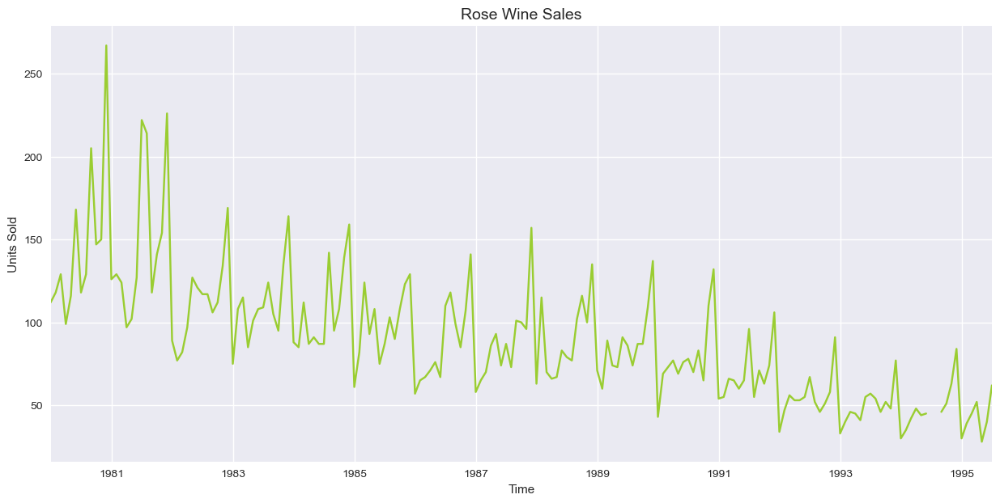

In [59]:
plt.figure(figsize = (15, 7))
df.Rose.plot(color='yellowgreen')
plt.title('Rose Wine Sales', fontsize=14)
plt.xlabel('Time')
plt.ylabel('Units Sold');

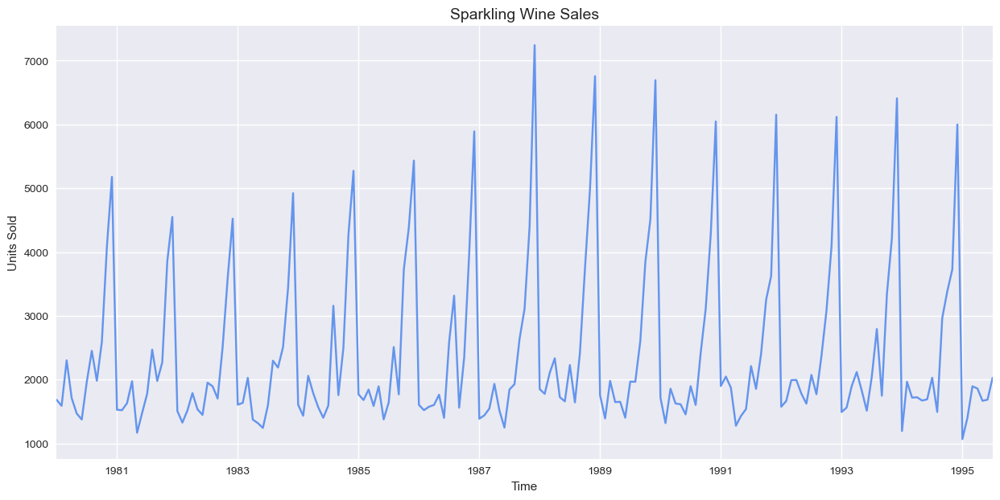

In [60]:
plt.figure(figsize = (15, 7))
df.Sparkling.plot(color='cornflowerblue')
plt.title('Sparkling Wine Sales', fontsize=14)
plt.xlabel('Time')
plt.ylabel('Units Sold');

In [61]:
df.isnull().sum()

Sparkling    0
Rose         2
dtype: int64

### There are two missing values present in the rose dataset

In [62]:
#Treatment of Missing Value
df.converted  = df.Rose
ts = df.converted.resample('D').mean() 
df.Rose = ts.interpolate(method = 'linear')
df.Rose['1994']

YearMonth
1994-01-31    30.000000
1994-02-28    35.000000
1994-03-31    42.000000
1994-04-30    48.000000
1994-05-31    44.000000
1994-06-30    45.000000
1994-07-31    45.336957
1994-08-31    45.673913
1994-09-30    46.000000
1994-10-31    51.000000
1994-11-30    63.000000
1994-12-31    84.000000
Name: Rose, dtype: float64

In [63]:
from pylab import rcParams
rcParams['figure.figsize'] =  15,7

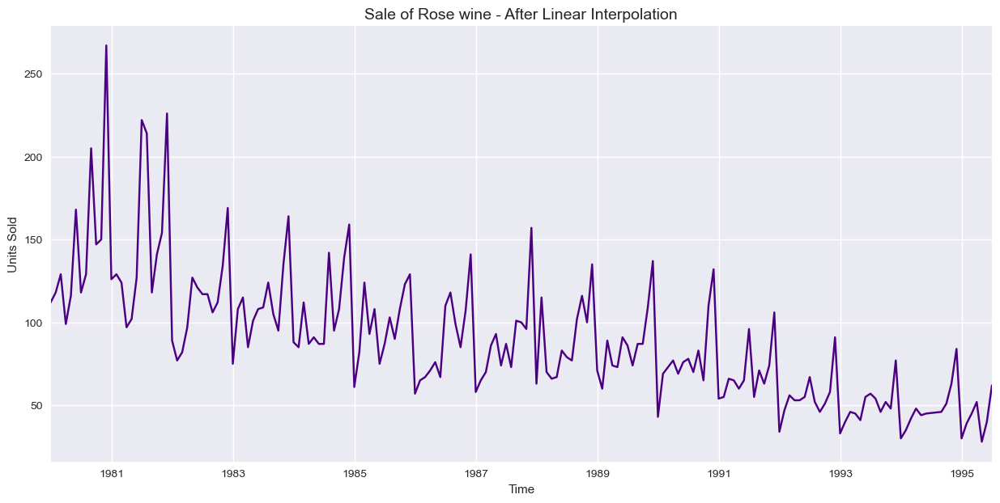

In [64]:
plt.figure(figsize = (15, 7))
df.Rose.plot(color='indigo')
plt.title('Sale of Rose wine - After Linear Interpolation', fontsize =14)
plt.xlabel('Time')
plt.ylabel('Units Sold');

## Q2. Perform appropriate Exploratory Data Analysis to understand the data and also perform decomposition.

In [65]:
df_spark.describe()

,Sparkling
count,187.000000
mean,2402.417112
std,1295.111540
min,1070.000000
25%,1605.000000
50%,1874.000000
75%,2549.000000
max,7242.000000


In [66]:
df_spark.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   YearMonth  187 non-null    object
 1   Sparkling  187 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 3.0+ KB


In [67]:
df_rose.describe()

,Rose
count,185.000000
mean,90.394595
std,39.175344
min,28.000000
25%,63.000000
50%,86.000000
75%,112.000000
max,267.000000


In [68]:
df_rose.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   YearMonth  187 non-null    object 
 1   Rose       185 non-null    float64
dtypes: float64(1), object(1)
memory usage: 3.0+ KB


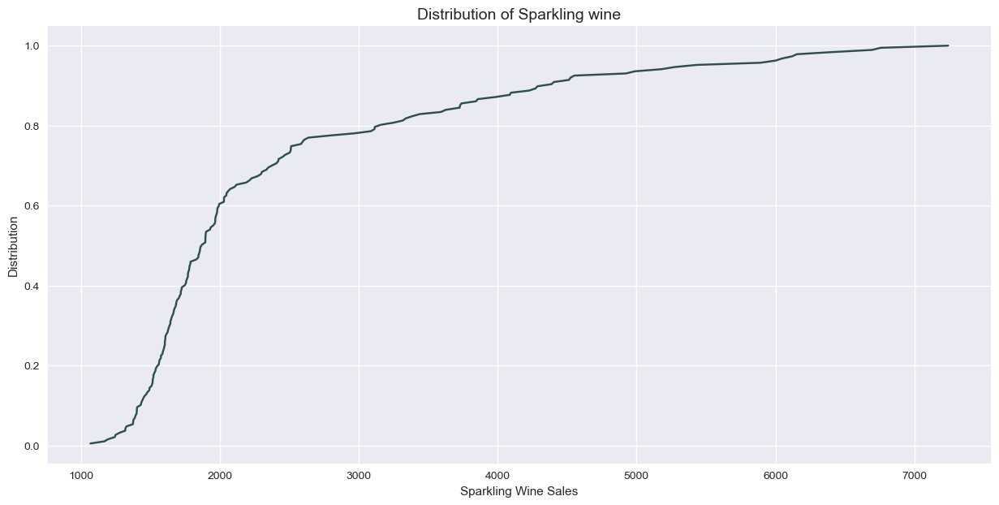

In [69]:
from statsmodels.distributions.empirical_distribution import ECDF

plt.figure(figsize = (15, 7))
cdf = ECDF(df['Sparkling'])
plt.plot(cdf.x, cdf.y, label = "statmodels", color = 'darkslategray')
plt.title('Distribution of Sparkling wine', fontsize=14)
plt.xlabel('Sparkling Wine Sales')
plt.ylabel('Distribution');
#An empirical cumulative distribution function is called the Empirical Distribution Function, or EDF for short. 
#It is also referred to as the Empirical Cumulative Distribution Function, or ECDF.

#The EDF is calculated by ordering all of the unique observations in the data sample and calculating the cumulative probability for each as the number of observations less than or equal to a given observation divided by the total number of observations.

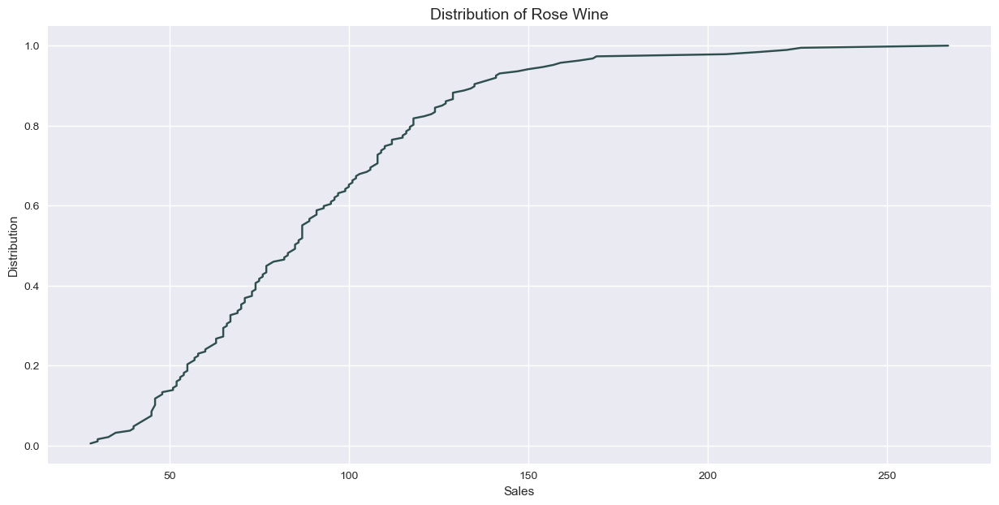

In [70]:
plt.figure(figsize = (15, 7))
cdf = ECDF(df['Rose'])
plt.plot(cdf.x, cdf.y, label = "statmodels", color = 'darkslategray')
plt.title('Distribution of Rose Wine', fontsize=14)
plt.xlabel('Sales')
plt.ylabel('Distribution');

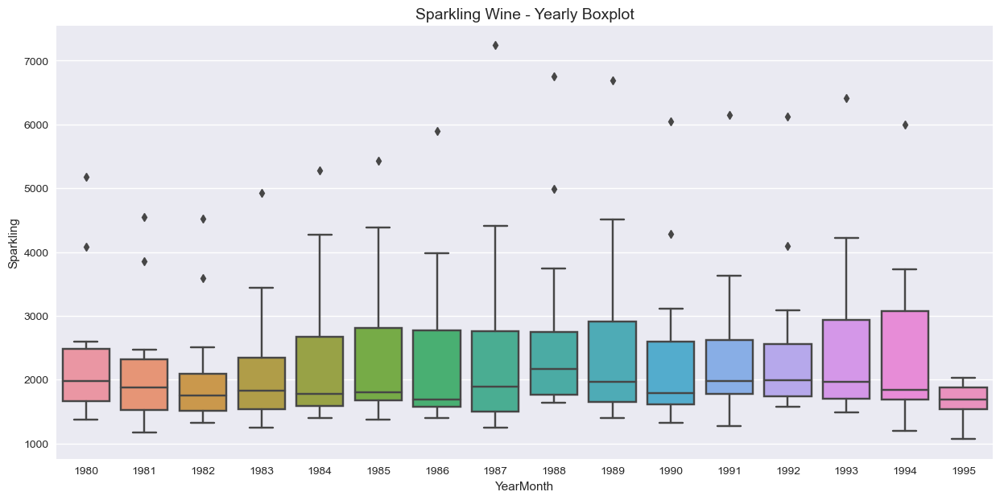

In [71]:
#Yearly Boxplot - Sparkling Wine
plt.figure(figsize = (15, 7))
sns.boxplot(x = df.index.year,y = df['Sparkling'])
plt.title('Sparkling Wine - Yearly Boxplot', fontsize=14);

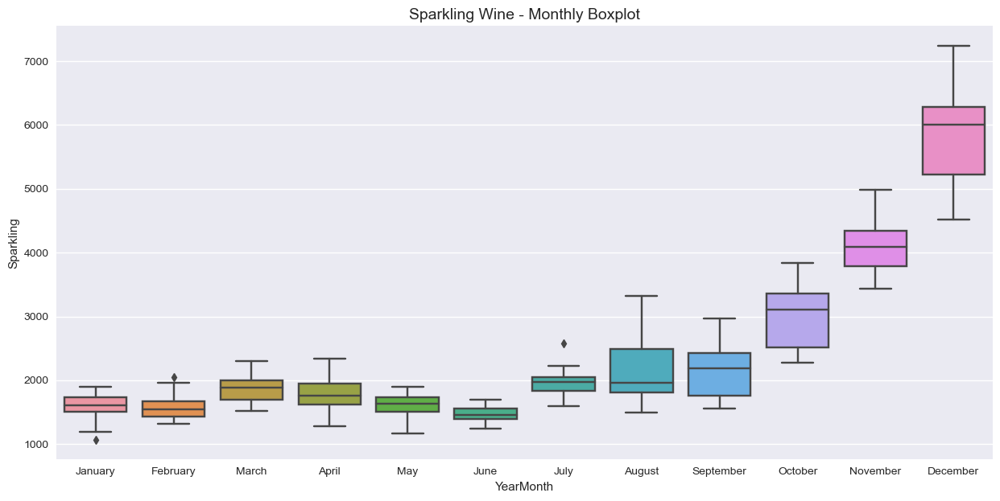

In [72]:
#Monthly Plot - Sparkling
plt.figure(figsize = (15, 7))
sns.boxplot(x = df.index.month_name(),y = df['Sparkling'])
plt.title('Sparkling Wine - Monthly Boxplot', fontsize=14);

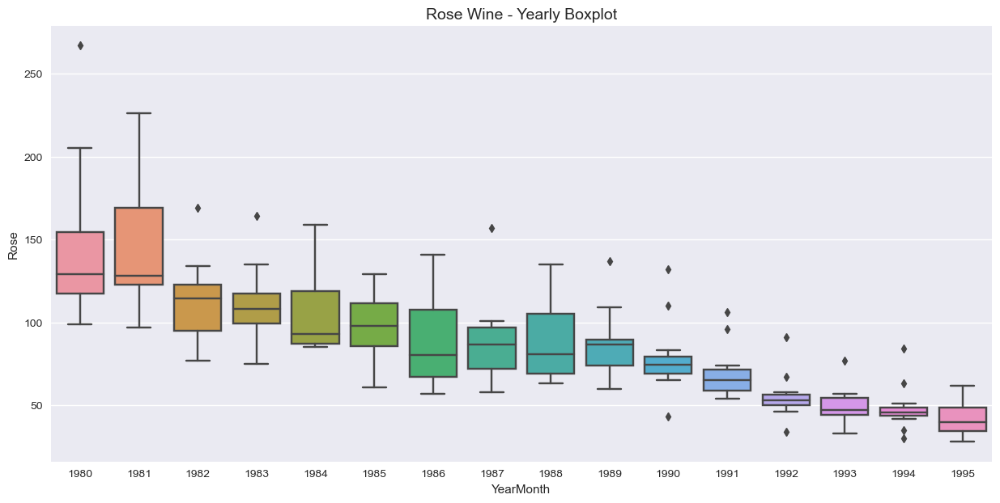

In [73]:
#Yearly Boxplot - Rose
plt.figure(figsize = (15, 7))
sns.boxplot(x = df.index.year,y = df['Rose'])
plt.title('Rose Wine - Yearly Boxplot', fontsize=14);

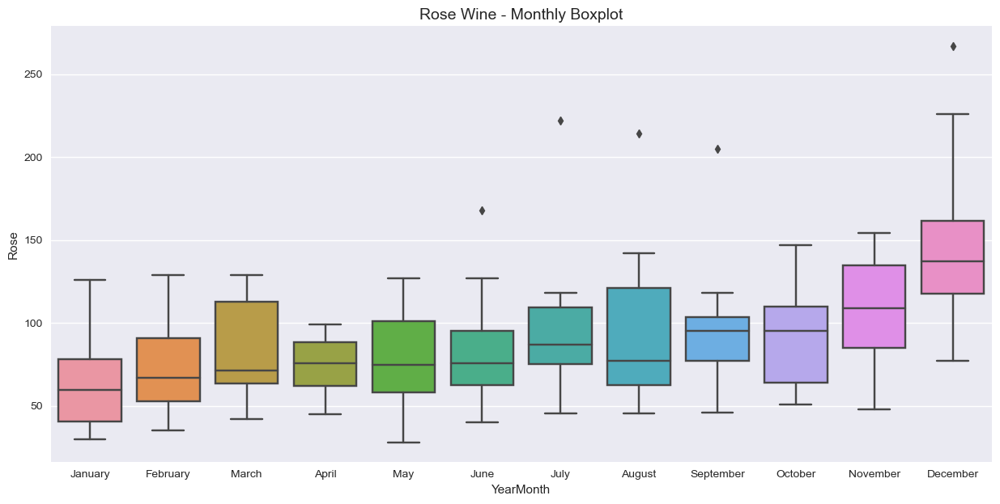

In [74]:
#Monthly Plot - Rose
plt.figure(figsize = (15, 7))
sns.boxplot(x = df.index.month_name(),y = df['Rose'])
plt.title('Rose Wine - Monthly Boxplot', fontsize=14);

#### Above plots are depicting rose wine's monthly and yearly plot

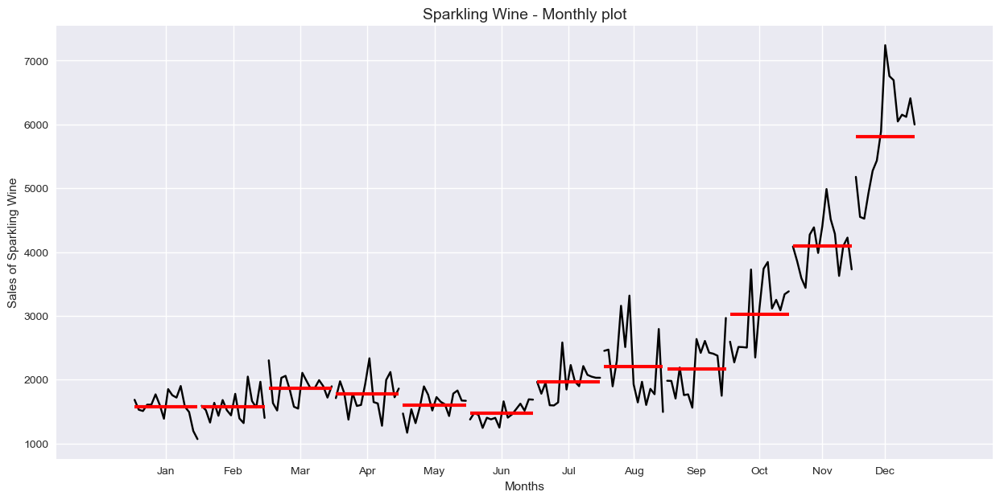

In [75]:
from statsmodels.graphics.tsaplots import month_plot
month_plot(df['Sparkling'],ylabel='Sales of Sparkling Wine')
plt.xlabel('Months')
plt.title('Sparkling Wine - Monthly plot', fontsize = 14);

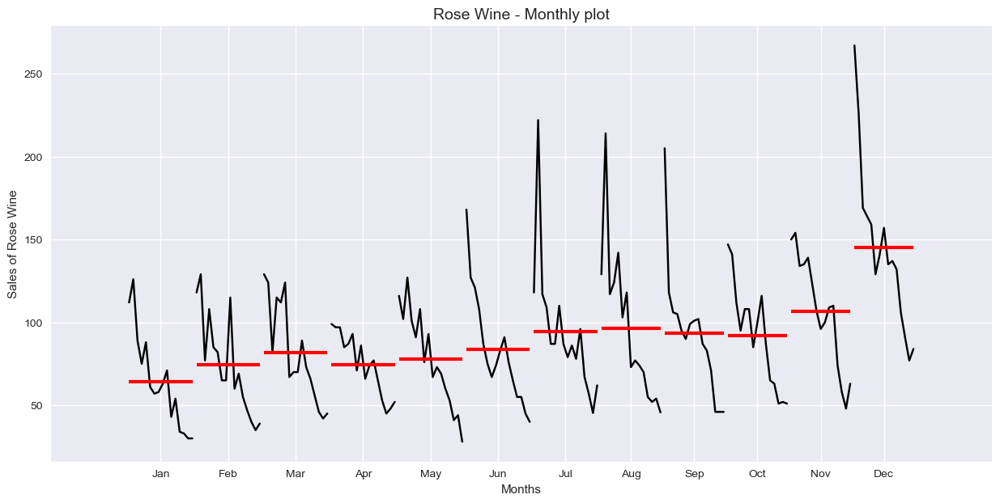

In [76]:
month_plot(df['Rose'],ylabel='Sales of Rose Wine')
plt.xlabel('Months')
plt.title('Rose Wine - Monthly plot', fontsize=14);

#### Sparking wine monthly sales across all these years

In [77]:
monthly_sales_across_years = pd.pivot_table(df, values = 'Sparkling', columns = df.index.month, index = df.index.year)
monthly_sales_across_years

YearMonth,1,2,3,4,5,6,7,8,9,10,11,12
YearMonth,,,,,,,,,,,,
1980,1686.0,1591.0,2304.0,1712.0,1471.0,1377.0,1966.0,2453.0,1984.0,2596.0,4087.0,5179.0
1981,1530.0,1523.0,1633.0,1976.0,1170.0,1480.0,1781.0,2472.0,1981.0,2273.0,3857.0,4551.0
1982,1510.0,1329.0,1518.0,1790.0,1537.0,1449.0,1954.0,1897.0,1706.0,2514.0,3593.0,4524.0
1983,1609.0,1638.0,2030.0,1375.0,1320.0,1245.0,1600.0,2298.0,2191.0,2511.0,3440.0,4923.0
1984,1609.0,1435.0,2061.0,1789.0,1567.0,1404.0,1597.0,3159.0,1759.0,2504.0,4273.0,5274.0
1985,1771.0,1682.0,1846.0,1589.0,1896.0,1379.0,1645.0,2512.0,1771.0,3727.0,4388.0,5434.0
1986,1606.0,1523.0,1577.0,1605.0,1765.0,1403.0,2584.0,3318.0,1562.0,2349.0,3987.0,5891.0
1987,1389.0,1442.0,1548.0,1935.0,1518.0,1250.0,1847.0,1930.0,2638.0,3114.0,4405.0,7242.0
1988,1853.0,1779.0,2108.0,2336.0,1728.0,1661.0,2230.0,1645.0,2421.0,3740.0,4988.0,6757.0


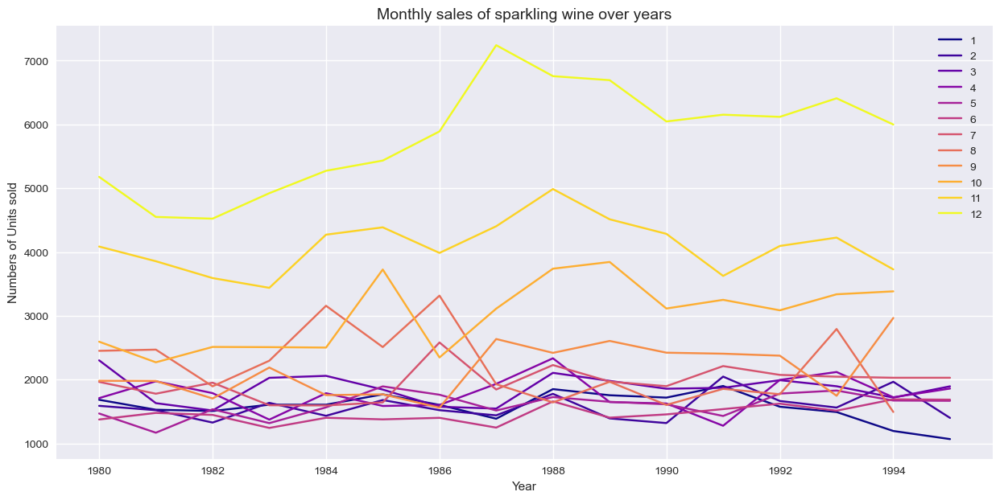

In [78]:
plt.figure.figsize=(15,8)
monthly_sales_across_years.plot(colormap='plasma')
plt.legend(loc='best')
plt.ylabel('Numbers of Units sold')
plt.xlabel('Year')
plt.title('Monthly sales of sparkling wine over years', fontsize=14);

#### Rose wine monthly sales across all these years

In [79]:
monthly_sales_across_years = pd.pivot_table(df, values = 'Rose', columns = df.index.month, index = df.index.year)
monthly_sales_across_years

YearMonth,1,2,3,4,5,6,7,8,9,10,11,12
YearMonth,,,,,,,,,,,,
1980,112.0,118.0,129.0,99.0,116.0,168.0,118.000000,129.000000,205.0,147.0,150.0,267.0
1981,126.0,129.0,124.0,97.0,102.0,127.0,222.000000,214.000000,118.0,141.0,154.0,226.0
1982,89.0,77.0,82.0,97.0,127.0,121.0,117.000000,117.000000,106.0,112.0,134.0,169.0
1983,75.0,108.0,115.0,85.0,101.0,108.0,109.000000,124.000000,105.0,95.0,135.0,164.0
1984,88.0,85.0,112.0,87.0,91.0,87.0,87.000000,142.000000,95.0,108.0,139.0,159.0
1985,61.0,82.0,124.0,93.0,108.0,75.0,87.000000,103.000000,90.0,108.0,123.0,129.0
1986,57.0,65.0,67.0,71.0,76.0,67.0,110.000000,118.000000,99.0,85.0,107.0,141.0
1987,58.0,65.0,70.0,86.0,93.0,74.0,87.000000,73.000000,101.0,100.0,96.0,157.0
1988,63.0,115.0,70.0,66.0,67.0,83.0,79.000000,77.000000,102.0,116.0,100.0,135.0


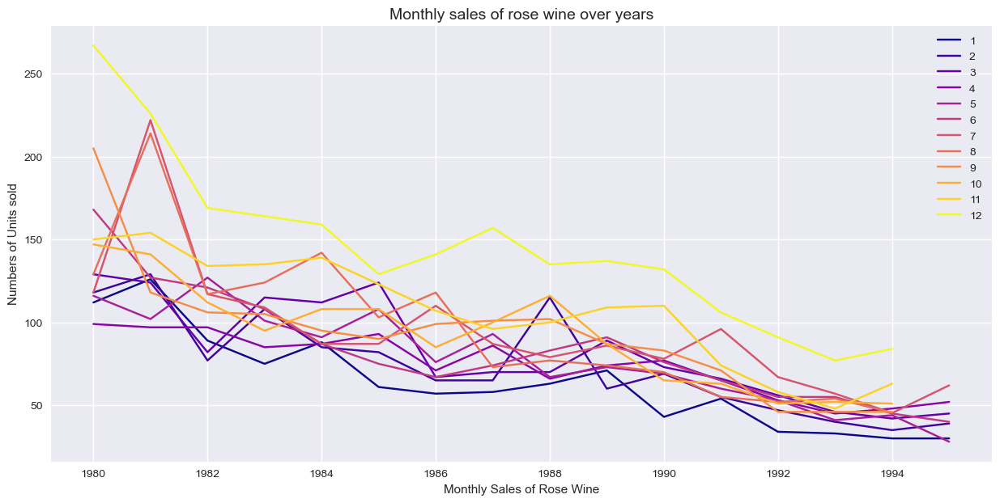

In [80]:
plt.figure.figsize=(15,8)
monthly_sales_across_years.plot(colormap='plasma')
plt.legend(loc='best')
plt.ylabel('Numbers of Units sold')
plt.xlabel('Monthly Sales of Rose Wine')
plt.title('Monthly sales of rose wine over years', fontsize=14);

#### Average sales per month on month percentage change of sales.

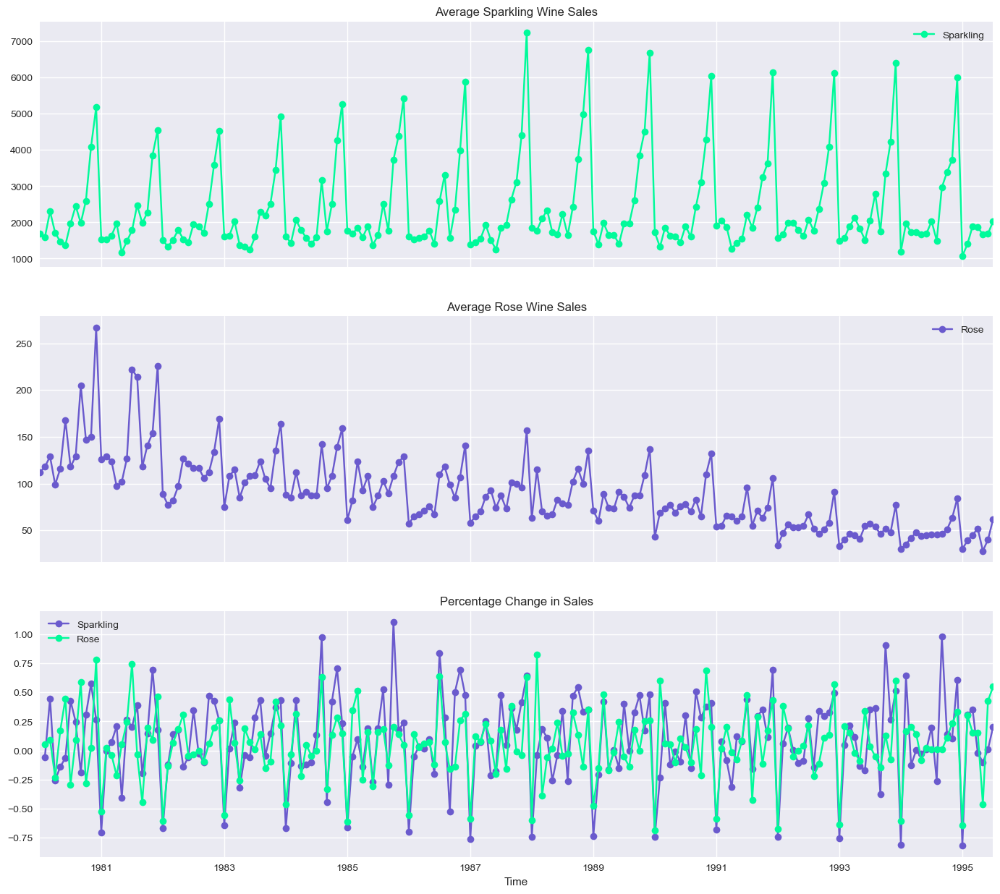

In [81]:
# group by date and get average Sparkling & Rose sales, and precent change
average_s    = df.groupby(df.index)['Sparkling'].mean()
average_r    = df.groupby(df.index)['Rose'].mean()
pct_change_s = df.groupby(df.index)['Sparkling'].sum().pct_change()
pct_change_r = df.groupby(df.index)['Rose'].sum().pct_change()

fig, (axis1,axis2,axis3) = plt.subplots(3,1,sharex=True,figsize=(17,15))

# plotting average Sparkling sales over time(year-month)
ax1 = average_s.plot(legend=True,ax=axis1,marker='o',title="Average Sparkling Wine Sales", color = 'mediumspringgreen')
ax2 = average_r.plot(legend=True,ax=axis2,marker='o',title="Average Rose Wine Sales", color = 'slateblue')
# plotting precent change for Sales over time(year-month)
ax3 = pct_change_s.plot(legend=True,ax=axis3,marker='o',color='slateblue',title="Percentage Change in Sales")
ax3 = pct_change_r.plot(legend=True,ax=axis3,marker='o',color='mediumspringgreen',title="Percentage Change in Sales")
plt.xlabel('Time')
plt.legend(loc='best');

### Decomposition
#### For Sparkling
#### Additive Decomposition

In [82]:
from statsmodels.tsa.seasonal import seasonal_decompose

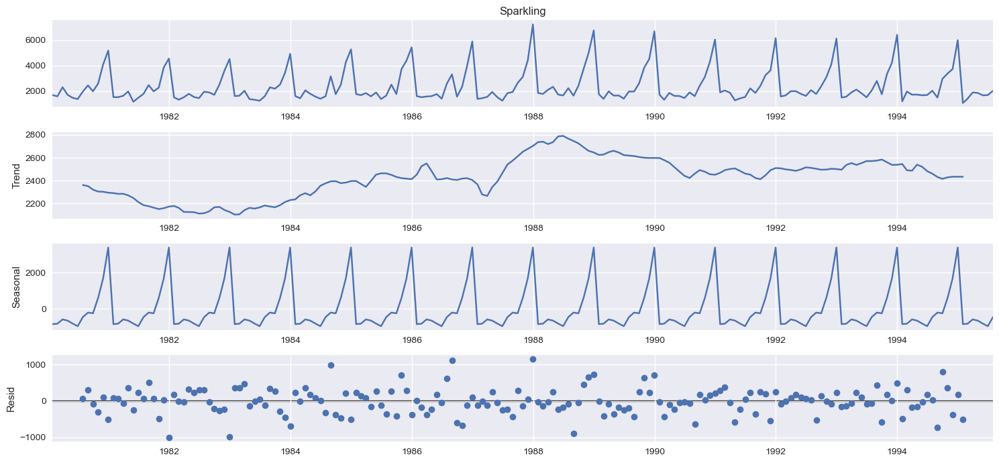

In [83]:
decomposition = seasonal_decompose(df['Sparkling'],model='additive')
decomposition.plot();

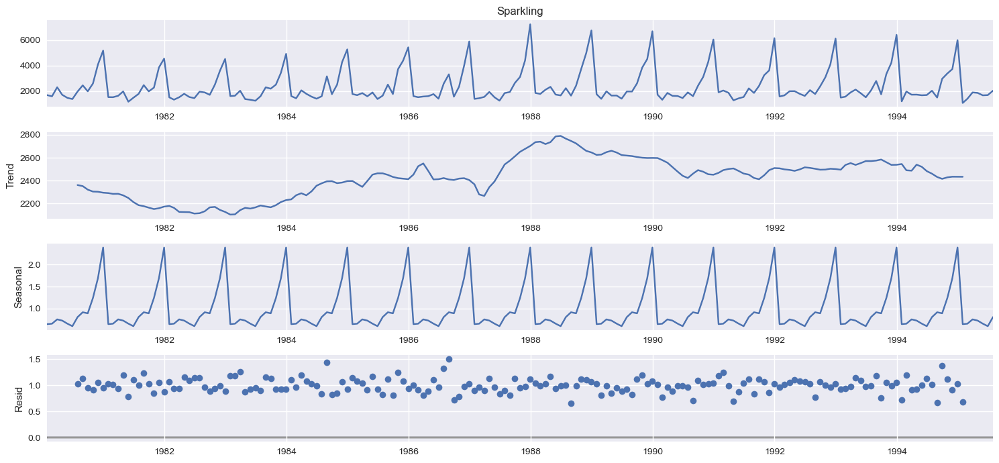

In [84]:
decomposition = seasonal_decompose(df['Sparkling'],model='multiplicative')
decomposition.plot();

### Rose Wine
#### Additive Decomposition

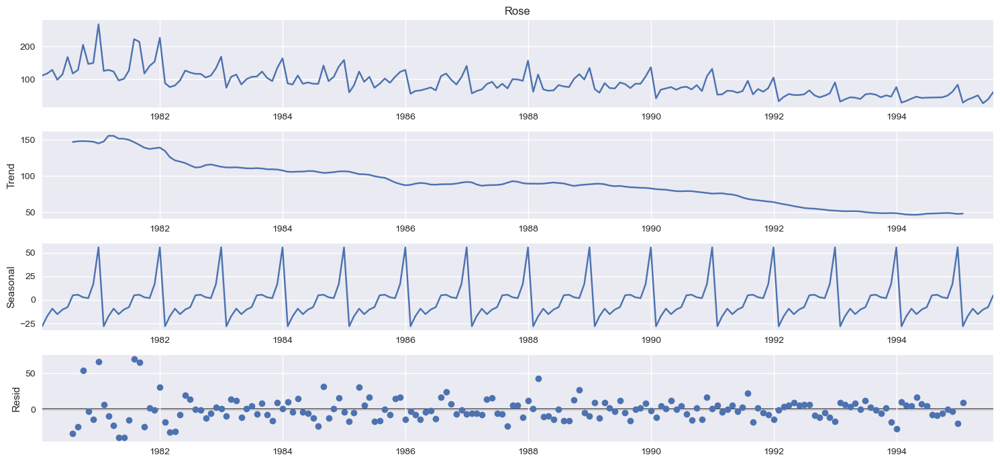

In [85]:
decomposition = seasonal_decompose(df['Rose'],model='additive')
decomposition.plot();

#### Multiplicative Decomposition

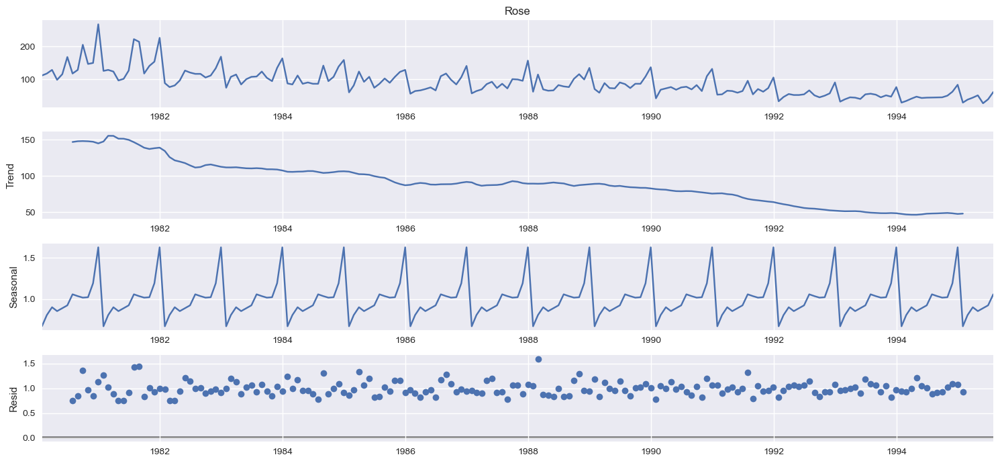

In [86]:
decomposition = seasonal_decompose(df['Rose'],model='multiplicative')
decomposition.plot();

## Q3. Split the data into training and test. The test data should start in 1991.

In [87]:
train=df[df.index.year < 1991]
test=df[df.index.year >= 1991]

In [88]:
from IPython.display import display
print('First few rows of Training Data')
display(train.head())
print('Last few rows of Training Data')
display(train.tail())
print('First few rows of Test Data')
display(test.head())
print('Last few rows of Test Data')
display(test.tail())

First few rows of Training Data


,Sparkling,Rose
YearMonth,,
1980-01-31,1686,112.0
1980-02-29,1591,118.0
1980-03-31,2304,129.0
1980-04-30,1712,99.0
1980-05-31,1471,116.0


Last few rows of Training Data


,Sparkling,Rose
YearMonth,,
1990-08-31,1605,70.0
1990-09-30,2424,83.0
1990-10-31,3116,65.0
1990-11-30,4286,110.0
1990-12-31,6047,132.0


First few rows of Test Data


,Sparkling,Rose
YearMonth,,
1991-01-31,1902,54.0
1991-02-28,2049,55.0
1991-03-31,1874,66.0
1991-04-30,1279,65.0
1991-05-31,1432,60.0


Last few rows of Test Data


,Sparkling,Rose
YearMonth,,
1995-03-31,1897,45.0
1995-04-30,1862,52.0
1995-05-31,1670,28.0
1995-06-30,1688,40.0
1995-07-31,2031,62.0


In [89]:
print(train.shape)
print(test.shape)

(132, 2)
(55, 2)


In [90]:
print("Dimensions of the training and test data")
print('Number of rows and columns of the training set :',train.shape)
print('Number of rows and columns of the training set :',test.shape)

Dimensions of the training and test data
Number of rows and columns of the training set : (132, 2)
Number of rows and columns of the training set : (55, 2)


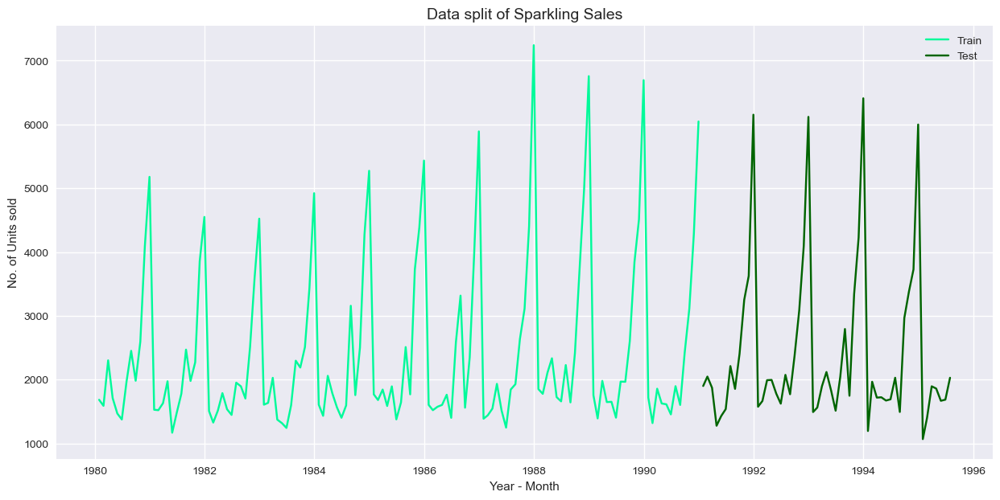

In [91]:
plt.figure(figsize = (15, 7))
plt.plot(train['Sparkling'], label = 'Train', color='mediumspringgreen')
plt.plot(test['Sparkling'], label = 'Test', color='darkgreen')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Data split of Sparkling Sales', fontsize = 14)
plt.show;

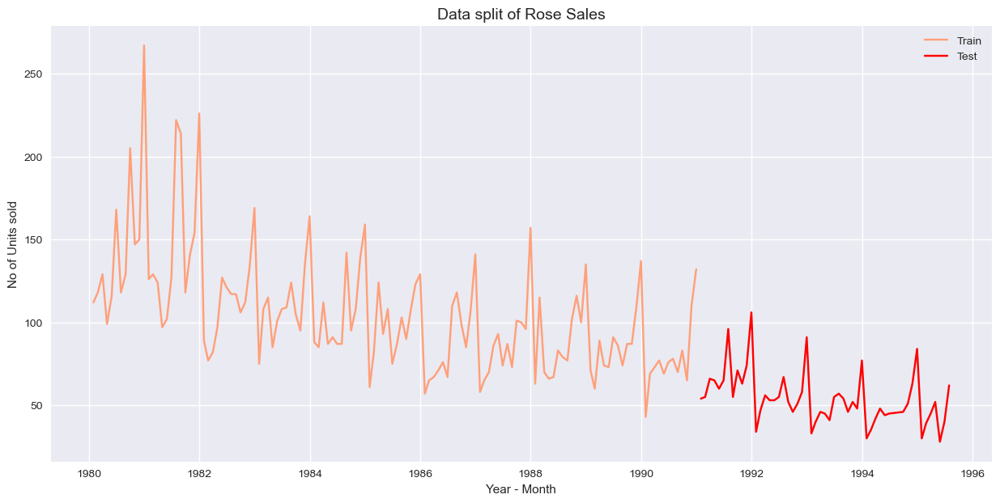

In [92]:
plt.figure(figsize = (15, 7))
plt.plot(train['Rose'], label = 'Train', color='lightsalmon')
plt.plot(test['Rose'], label = 'Test', color='red')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('No of Units sold')
plt.title('Data split of Rose Sales', fontsize = 14)
plt.show;

## Q4. Build all the exponential smoothing models on the training data and evaluate the model using RMSE on the test data. Other models such as regression,naïve forecast models and simple average models. should also be built on the training data and check the performance on the test data using RMSE.

#### Model 1: Linear Regression

In [93]:
train_time = [i+1 for i in range(len(train))]
test_time = [i+133 for i in range(len(test))]
print('Training Time instance','\n',train_time)
print('Test Time instance','\n',test_time)

Training Time instance 
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132]
Test Time instance 
 [133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187]


In [94]:
LinearRegression_train = train.copy()
LinearRegression_test = test.copy()

In [95]:
LinearRegression_train['time'] = train_time
LinearRegression_test['time'] = test_time

print('First few rows of Training Data','\n',LinearRegression_train.head(),'\n')
print('Last few rows of Training Data','\n',LinearRegression_train.tail(),'\n')
print('First few rows of Test Data','\n',LinearRegression_test.head(),'\n')
print('Last few rows of Test Data','\n',LinearRegression_test.tail(),'\n')

First few rows of Training Data 
             Sparkling   Rose  time
YearMonth                         
1980-01-31       1686  112.0     1
1980-02-29       1591  118.0     2
1980-03-31       2304  129.0     3
1980-04-30       1712   99.0     4
1980-05-31       1471  116.0     5 

Last few rows of Training Data 
             Sparkling   Rose  time
YearMonth                         
1990-08-31       1605   70.0   128
1990-09-30       2424   83.0   129
1990-10-31       3116   65.0   130
1990-11-30       4286  110.0   131
1990-12-31       6047  132.0   132 

First few rows of Test Data 
             Sparkling  Rose  time
YearMonth                        
1991-01-31       1902  54.0   133
1991-02-28       2049  55.0   134
1991-03-31       1874  66.0   135
1991-04-30       1279  65.0   136
1991-05-31       1432  60.0   137 

Last few rows of Test Data 
             Sparkling  Rose  time
YearMonth                        
1995-03-31       1897  45.0   183
1995-04-30       1862  52.0   184
1995

In [96]:
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
lr.fit(LinearRegression_train[['time']],LinearRegression_train['Sparkling'].values)

LinearRegression()

#### Sparkling Wine

In [97]:
LinearRegression_train['RegOnTime_spark'] = lr.predict(LinearRegression_train[['time']])
LinearRegression_test['RegOnTime_spark'] = lr.predict(LinearRegression_test[['time']])

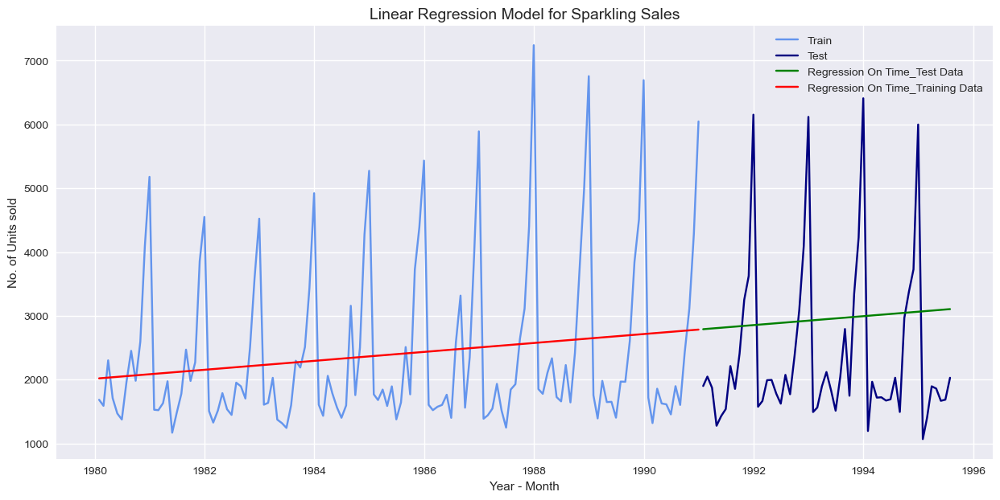

In [98]:
plt.plot( train['Sparkling'], label='Train', color = 'cornflowerblue')
plt.plot(test['Sparkling'], label='Test', color = 'navy')
plt.plot(LinearRegression_test['RegOnTime_spark'], label='Regression On Time_Test Data', color = 'green')
plt.plot(LinearRegression_train['RegOnTime_spark'], label='Regression On Time_Training Data', color = 'red')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Linear Regression Model for Sparkling Sales', fontsize = 14);

#### Rose Wine

In [99]:
lr2 = LinearRegression().fit(LinearRegression_train[['time']],LinearRegression_train['Rose'].values)

In [100]:
LinearRegression_train['RegOnTime_rose']        = lr2.predict(LinearRegression_train[['time']])
LinearRegression_test['RegOnTime_rose']         = lr2.predict(LinearRegression_test[['time']])

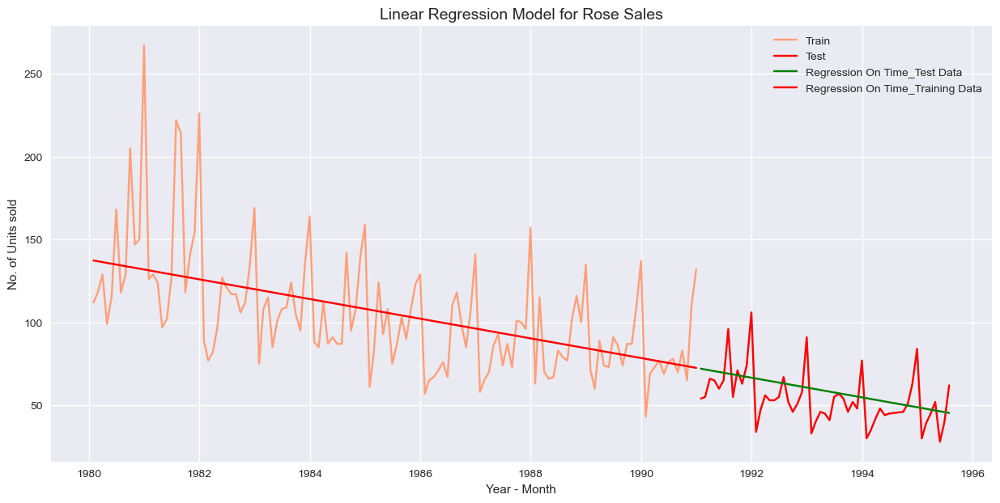

In [101]:
plt.plot( train['Rose'], label='Train', color = 'lightsalmon')
plt.plot(test['Rose'], label='Test', color = 'red')
plt.plot(LinearRegression_test['RegOnTime_rose'], label='Regression On Time_Test Data', color = 'green')
plt.plot(LinearRegression_train['RegOnTime_rose'], label='Regression On Time_Training Data', color = 'red')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Linear Regression Model for Rose Sales',fontsize=14);

#### Model Evaluation

In [102]:
from sklearn import metrics
def MAPE(y, yhat): 
    y, yhat = np.array(y), np.array(yhat)
    try:
        mape =  round(np.sum(np.abs(yhat - y)) / np.sum(y) * 100,2)
    except:
        print("Observed values are empty")
        mape = np.nan
    return mape

In [103]:
## Sparkling Wine Training Data - RMSE and MAPE

rmse_spark_model1_train = metrics.mean_squared_error(train['Sparkling'],LinearRegression_train['RegOnTime_spark'],squared=False)
mape_spark_model1_train = MAPE(train['Sparkling'],LinearRegression_train['RegOnTime_spark'])
print("For Regression On Time forecast on the Sparkling Wine Training Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model1_train, mape_spark_model1_train))

For Regression On Time forecast on the Sparkling Wine Training Data:  RMSE is 1279.322 and MAPE is 40.05


In [104]:
## Sparkling Wine Testing Data - RMSE and MAPE

rmse_spark_model1_test = metrics.mean_squared_error(test['Sparkling'],LinearRegression_test['RegOnTime_spark'],squared=False)
mape_spark_model1_test = MAPE(test['Sparkling'],LinearRegression_test['RegOnTime_spark'])
print("For Regression On Time forecast on the Sparkling Wine Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model1_test, mape_spark_model1_test))

For Regression On Time forecast on the Sparkling Wine Testing Data:  RMSE is 1389.135 and MAPE is 50.15


In [105]:
## Rose Wine Training Data - RMSE and MAPE

rmse_rose_model1_train = metrics.mean_squared_error(train['Rose'],LinearRegression_train['RegOnTime_rose'],squared=False)
mape_rose_model1_train = MAPE(train['Rose'],LinearRegression_train['RegOnTime_rose'])
print("For Regression On Time forecast on the Rose Wine Training Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model1_train, mape_rose_model1_train))

For Regression On Time forecast on the Rose Wine Training Data:  RMSE is 30.718 and MAPE is 21.22


In [106]:
## Rose wine testing Data - RMSE and MAPE

rmse_rose_model1_test = metrics.mean_squared_error(test['Rose'],LinearRegression_test['RegOnTime_rose'],squared=False)
mape_rose_model1_test = MAPE(test['Rose'],LinearRegression_test['RegOnTime_rose'])
print("For Regression On Time forecast on the Rose wine testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model1_test, mape_rose_model1_test))

For Regression On Time forecast on the Rose wine testing Data:  RMSE is 15.269 and MAPE is 22.82


In [107]:
spark_resultsDf = pd.DataFrame({'Test RMSE': [rmse_spark_model1_test],'Test MAPE': [mape_spark_model1_test]},index=['Regression On Time'])
spark_resultsDf

,Test RMSE,Test MAPE
Regression On Time,1389.135175,50.15


In [108]:
rose_resultsDf = pd.DataFrame({'Test RMSE': [rmse_rose_model1_test],'Test MAPE': [mape_rose_model1_test]},index=['Regression On Time'])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82


#### Model 2: Naive forecast

In [109]:
NaiveModel_train = train.copy()
NaiveModel_test = test.copy()

#### Sparkling Wine

In [110]:
NaiveModel_train['spark_naive'] = np.asarray(train['Sparkling'])[len(np.asarray(train['Sparkling']))-1]
NaiveModel_train['spark_naive'].head()

YearMonth
1980-01-31    6047
1980-02-29    6047
1980-03-31    6047
1980-04-30    6047
1980-05-31    6047
Name: spark_naive, dtype: int64

In [111]:
NaiveModel_test['spark_naive'] = np.asarray(train['Sparkling'])[len(np.asarray(train['Sparkling']))-1]
NaiveModel_test['spark_naive'].head()

YearMonth
1991-01-31    6047
1991-02-28    6047
1991-03-31    6047
1991-04-30    6047
1991-05-31    6047
Name: spark_naive, dtype: int64

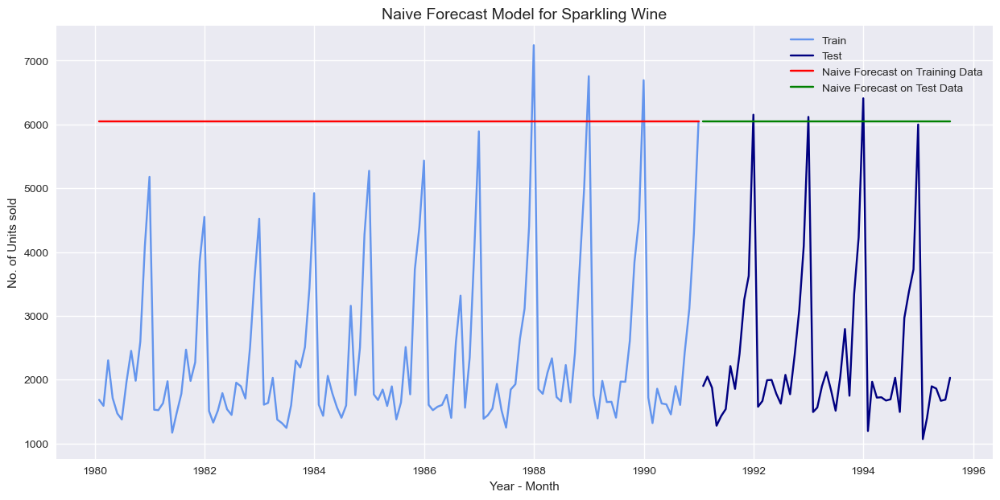

In [112]:
plt.plot(NaiveModel_train['Sparkling'], label='Train', color = 'cornflowerblue')
plt.plot(test['Sparkling'], label='Test', color = 'navy')
plt.plot(NaiveModel_train['spark_naive'], label='Naive Forecast on Training Data', color = 'red')
plt.plot(NaiveModel_test['spark_naive'], label='Naive Forecast on Test Data', color = 'green')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title("Naive Forecast Model for Sparkling Wine", fontsize = 14);

#### Rose Wine

In [113]:
NaiveModel_train['rose_naive'] = np.asarray(train['Rose'])[len(np.asarray(train['Rose']))-1]
NaiveModel_train['rose_naive'].head()

YearMonth
1980-01-31    132.0
1980-02-29    132.0
1980-03-31    132.0
1980-04-30    132.0
1980-05-31    132.0
Name: rose_naive, dtype: float64

In [114]:
NaiveModel_test['rose_naive'] = np.asarray(train['Rose'])[len(np.asarray(train['Rose']))-1]
NaiveModel_test['rose_naive'].head()

YearMonth
1991-01-31    132.0
1991-02-28    132.0
1991-03-31    132.0
1991-04-30    132.0
1991-05-31    132.0
Name: rose_naive, dtype: float64

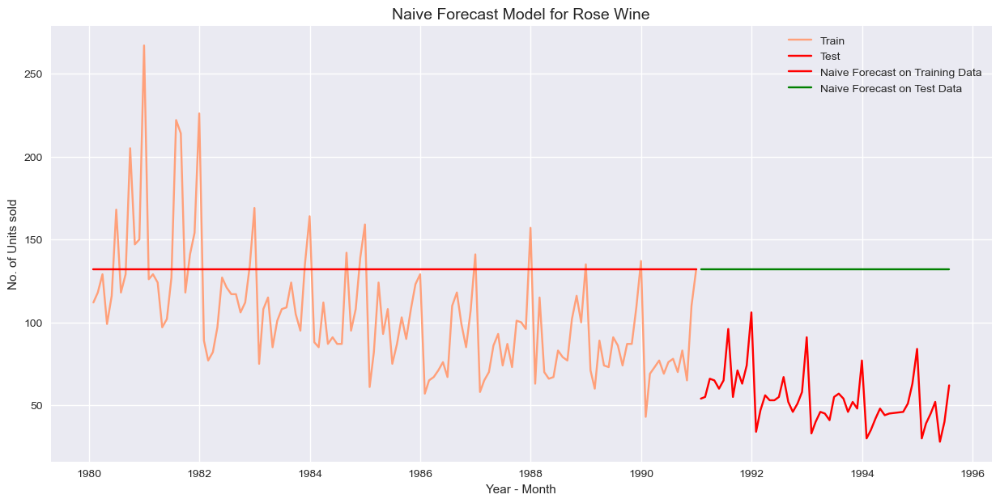

In [115]:
plt.plot(NaiveModel_train['Rose'], label='Train', color = 'lightsalmon')
plt.plot(test['Rose'], label='Test', color = 'red')
plt.plot(NaiveModel_train['rose_naive'], label='Naive Forecast on Training Data', color = 'red')
plt.plot(NaiveModel_test['rose_naive'], label='Naive Forecast on Test Data', color = 'green')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title("Naive Forecast Model for Rose Wine", fontsize = 14);

#### Model Evauation

In [116]:
## Sparkling Wine Training Data - RMSE and MAPE

rmse_spark_model2_train = metrics.mean_squared_error(train['Sparkling'],NaiveModel_train['spark_naive'],squared=False)
mape_spark_model2_train = MAPE(train['Sparkling'],NaiveModel_train['spark_naive'])
print("For Naive forecast Model on the Sparkling Wine Training Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model2_train, mape_spark_model2_train))

For Naive forecast Model on the Sparkling Wine Training Data:  RMSE is 3867.701 and MAPE is 153.17


In [117]:
## Sparkling Wine Testing Data - RMSE and MAPE

rmse_spark_model2_test = metrics.mean_squared_error(test['Sparkling'],NaiveModel_test['spark_naive'],squared=False)
mape_spark_model2_test = MAPE(test['Sparkling'],NaiveModel_test['spark_naive'])
print("For Naive forecast Model on the Sparkling Wine Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model2_test, mape_spark_model2_test))

For Naive forecast Model on the Sparkling Wine Testing Data:  RMSE is 3864.279 and MAPE is 152.87


In [118]:
## Rose Wine Training Data - RMSE and MAPE

rmse_rose_model2_train = metrics.mean_squared_error(train['Rose'],NaiveModel_train['rose_naive'],squared=False)
mape_rose_model2_train = MAPE(train['Rose'],NaiveModel_train['rose_naive'])
print("For Naive forecast Model on the Rose Wine Training Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model2_train, mape_rose_model2_train))

For Naive forecast Model on the Rose Wine Training Data:  RMSE is 45.064 and MAPE is 36.38


In [119]:
## Rose Wine Testing Data - RMSE and MAPE

rmse_rose_model2_test = metrics.mean_squared_error(test['Rose'],NaiveModel_test['rose_naive'],squared=False)
mape_rose_model2_test = MAPE(test['Rose'],NaiveModel_test['rose_naive'])
print("For Naive forecast Model on the Rose Wine Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model2_test, mape_rose_model2_test))

For Naive forecast Model on the Rose Wine Testing Data:  RMSE is 79.719 and MAPE is 145.10


In [120]:
resultsDf_2 = pd.DataFrame({'Test RMSE': [rmse_spark_model2_test],'Test MAPE': [mape_spark_model2_test]},index=['NaiveModel'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_2])
spark_resultsDf

,Test RMSE,Test MAPE
Regression On Time,1389.135175,50.15
NaiveModel,3864.279352,152.87


In [121]:
resultsDf_2 = pd.DataFrame({'Test RMSE': [rmse_rose_model2_test],'Test MAPE': [mape_rose_model2_test]},index=['NaiveModel'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_2])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82
NaiveModel,79.718559,145.10


### Model 3: Simple Average

In [122]:
SimpleAverage_train = train.copy()
SimpleAverage_test = test.copy()

#### Sparkling Wine

In [123]:
SimpleAverage_train['spark_mean_forecast'] = train['Sparkling'].mean()
SimpleAverage_train['spark_mean_forecast'].head()

YearMonth
1980-01-31    2403.780303
1980-02-29    2403.780303
1980-03-31    2403.780303
1980-04-30    2403.780303
1980-05-31    2403.780303
Name: spark_mean_forecast, dtype: float64

In [124]:
SimpleAverage_test['spark_mean_forecast'] = train['Sparkling'].mean()
SimpleAverage_test['spark_mean_forecast'].head()

YearMonth
1991-01-31    2403.780303
1991-02-28    2403.780303
1991-03-31    2403.780303
1991-04-30    2403.780303
1991-05-31    2403.780303
Name: spark_mean_forecast, dtype: float64

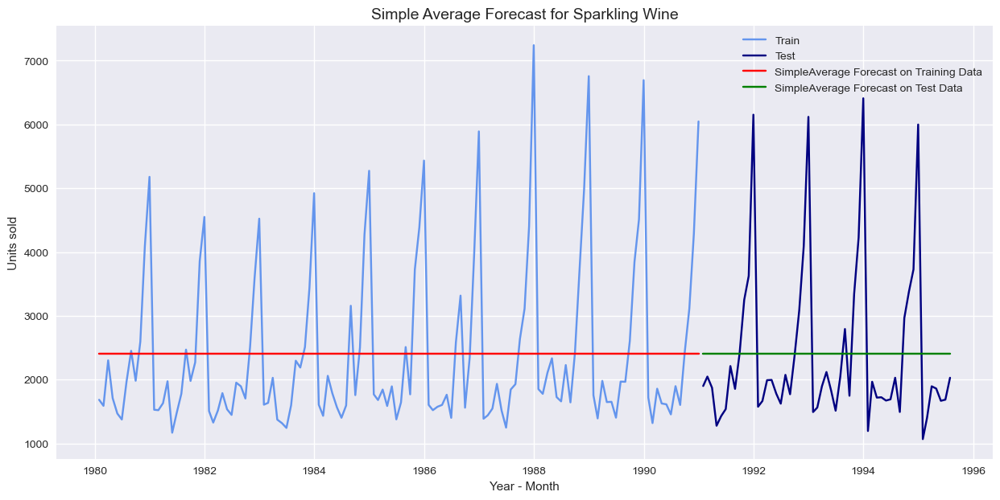

In [125]:
plt.plot(SimpleAverage_train['Sparkling'], label='Train', color = 'cornflowerblue')
plt.plot(test['Sparkling'], label='Test', color = 'navy')
plt.plot(SimpleAverage_train['spark_mean_forecast'], label='SimpleAverage Forecast on Training Data', color = 'red')
plt.plot(SimpleAverage_test['spark_mean_forecast'], label='SimpleAverage Forecast on Test Data', color = 'green')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title("Simple Average Forecast for Sparkling Wine", fontsize=14);

#### Rose Wine

In [126]:
SimpleAverage_train['rose_mean_forecast'] = train['Rose'].mean()
SimpleAverage_train['rose_mean_forecast'].head()

YearMonth
1980-01-31    104.939394
1980-02-29    104.939394
1980-03-31    104.939394
1980-04-30    104.939394
1980-05-31    104.939394
Name: rose_mean_forecast, dtype: float64

In [127]:
SimpleAverage_test['rose_mean_forecast'] = train['Rose'].mean()
SimpleAverage_test['rose_mean_forecast'].head()

YearMonth
1991-01-31    104.939394
1991-02-28    104.939394
1991-03-31    104.939394
1991-04-30    104.939394
1991-05-31    104.939394
Name: rose_mean_forecast, dtype: float64

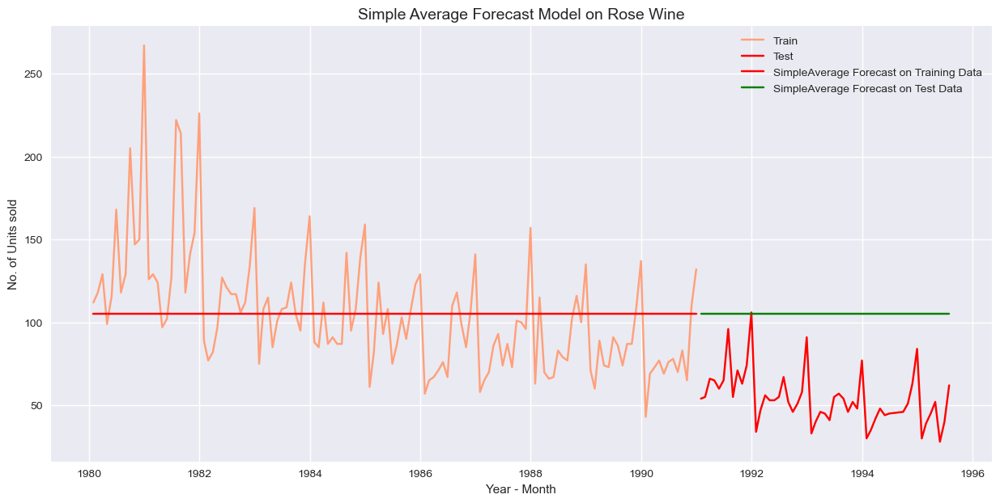

In [128]:
plt.plot(SimpleAverage_train['Rose'], label='Train', color = 'lightsalmon')
plt.plot(test['Rose'], label='Test', color = 'red')
plt.plot(SimpleAverage_train['rose_mean_forecast'], label='SimpleAverage Forecast on Training Data', color = 'red')
plt.plot(SimpleAverage_test['rose_mean_forecast'], label='SimpleAverage Forecast on Test Data', color = 'green')
plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title("Simple Average Forecast Model on Rose Wine", fontsize=14);

#### Model Evaluation

In [129]:
## Sparkling Wine Training Data - RMSE and MAPE

rmse_spark_model3_train = metrics.mean_squared_error(train['Sparkling'],SimpleAverage_train['spark_mean_forecast'],squared=False)
mape_spark_model3_train = MAPE(train['Sparkling'],SimpleAverage_train['spark_mean_forecast'])
print("For Simple Average forecast Model on the Sparkling Wine Training Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model3_train, mape_spark_model3_train))

For Simple Average forecast Model on the Sparkling Wine Training Data:  RMSE is 1298.484 and MAPE is 40.36


In [130]:
## Sparkling Wine Testing Data - RMSE and MAPE

rmse_spark_model3_test = metrics.mean_squared_error(test['Sparkling'],SimpleAverage_test['spark_mean_forecast'],squared=False)
mape_spark_model3_test = MAPE(test['Sparkling'],SimpleAverage_test['spark_mean_forecast'])
print("For Simple Average forecast Model on the Sparkling Wine Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model3_test, mape_spark_model3_test))

For Simple Average forecast Model on the Sparkling Wine Testing Data:  RMSE is 1275.082 and MAPE is 38.90


In [131]:
## Rose Wine Training Data - RMSE and MAPE

rmse_rose_model3_train = metrics.mean_squared_error(train['Rose'],SimpleAverage_train['rose_mean_forecast'],squared=False)
mape_rose_model3_train = MAPE(train['Rose'],SimpleAverage_train['rose_mean_forecast'])
print("For Simple Average forecast Model on the Rose Wine Training Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model3_train, mape_rose_model3_train))

For Simple Average forecast Model on the Rose Wine Training Data:  RMSE is 36.034 and MAPE is 25.39


In [132]:
## Rose Wine Testing Data - RMSE and MAPE

rmse_rose_model3_test = metrics.mean_squared_error(test['Rose'],SimpleAverage_test['rose_mean_forecast'],squared=False)
mape_rose_model3_test = MAPE(test['Rose'],SimpleAverage_test['rose_mean_forecast'])
print("For Simple Average forecast Model on the Rose Wine Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model3_test, mape_rose_model3_test))

For Simple Average forecast Model on the Rose Wine Testing Data:  RMSE is 53.460 and MAPE is 94.93


In [133]:
resultsDf_2 = pd.DataFrame({'Test RMSE': [rmse_spark_model3_test],'Test MAPE': [mape_spark_model3_test]},index=['SimpleAverage'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_2])
spark_resultsDf

,Test RMSE,Test MAPE
Regression On Time,1389.135175,50.15
NaiveModel,3864.279352,152.87
SimpleAverage,1275.081804,38.90


In [134]:
resultsDf_2 = pd.DataFrame({'Test RMSE': [rmse_rose_model3_test],'Test MAPE': [mape_rose_model3_test]},index=['SimpleAverage'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_2])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82
NaiveModel,79.718559,145.10
SimpleAverage,53.460350,94.93


### Model 4: Moving Average

In [135]:
MovingAverage = df.copy()
MovingAverage.head()

,Sparkling,Rose
YearMonth,,
1980-01-31,1686,112.0
1980-02-29,1591,118.0
1980-03-31,2304,129.0
1980-04-30,1712,99.0
1980-05-31,1471,116.0


In [136]:
MovingAverage['Spark_Trailing_2'] = MovingAverage['Sparkling'].rolling(2).mean()
MovingAverage['Spark_Trailing_4'] = MovingAverage['Sparkling'].rolling(4).mean()
MovingAverage['Spark_Trailing_6'] = MovingAverage['Sparkling'].rolling(6).mean()
MovingAverage['Spark_Trailing_9'] = MovingAverage['Sparkling'].rolling(9).mean()
MovingAverage['Rose_Trailing_2'] = MovingAverage['Rose'].rolling(2).mean()
MovingAverage['Rose_Trailing_4'] = MovingAverage['Rose'].rolling(4).mean()
MovingAverage['Rose_Trailing_6'] = MovingAverage['Rose'].rolling(6).mean()
MovingAverage['Rose_Trailing_9'] = MovingAverage['Rose'].rolling(9).mean()

MovingAverage.head()

,Sparkling,Rose,Spark_Trailing_2,Spark_Trailing_4,Spark_Trailing_6,Spark_Trailing_9,Rose_Trailing_2,Rose_Trailing_4,Rose_Trailing_6,Rose_Trailing_9
YearMonth,,,,,,,,,,
1980-01-31,1686,112.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-02-29,1591,118.0,1638.5,NaN,NaN,NaN,115.0,NaN,NaN,NaN
1980-03-31,2304,129.0,1947.5,NaN,NaN,NaN,123.5,NaN,NaN,NaN
1980-04-30,1712,99.0,2008.0,1823.25,NaN,NaN,114.0,114.5,NaN,NaN
1980-05-31,1471,116.0,1591.5,1769.50,NaN,NaN,107.5,115.5,NaN,NaN


#### Sparkling Wine

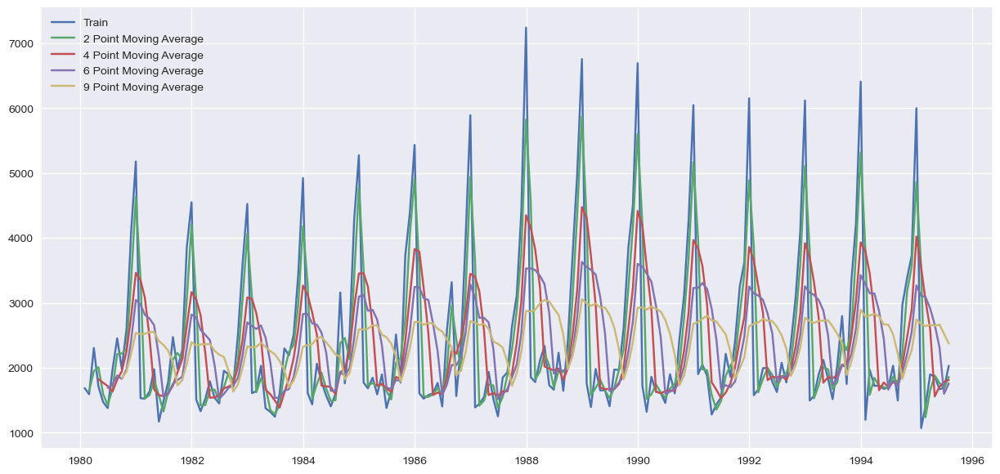

In [137]:
plt.plot(MovingAverage['Sparkling'], label='Train')
plt.plot(MovingAverage['Spark_Trailing_2'], label='2 Point Moving Average')
plt.plot(MovingAverage['Spark_Trailing_4'], label='4 Point Moving Average')
plt.plot(MovingAverage['Spark_Trailing_6'],label = '6 Point Moving Average')
plt.plot(MovingAverage['Spark_Trailing_9'],label = '9 Point Moving Average')
plt.legend(loc = 'best');

In [138]:
# Creating train and test set 
trailing_MovingAverage_train = MovingAverage[MovingAverage.index.year < 1991]
trailing_MovingAverage_test = MovingAverage[MovingAverage.index.year >= 1991]

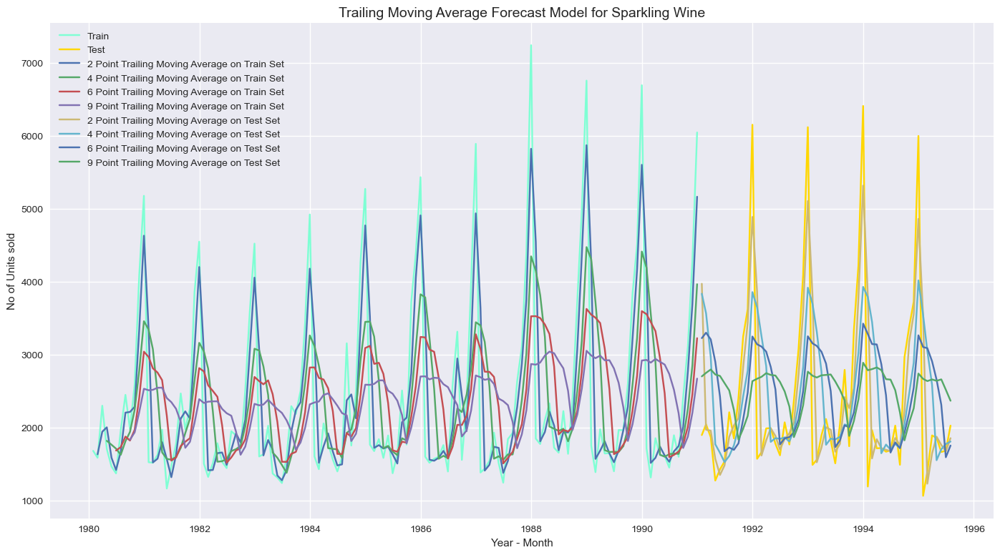

In [139]:
## Plotting on both the Training and Test data

plt.figure(figsize=(17,9))
plt.plot(trailing_MovingAverage_train['Sparkling'], label='Train', color = 'aquamarine')
plt.plot(trailing_MovingAverage_test['Sparkling'], label='Test', color = 'gold')

plt.plot(trailing_MovingAverage_train['Spark_Trailing_2'], label='2 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Spark_Trailing_4'], label='4 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Spark_Trailing_6'],label = '6 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Spark_Trailing_9'],label = '9 Point Trailing Moving Average on Train Set')

plt.plot(trailing_MovingAverage_test['Spark_Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Spark_Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Spark_Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Spark_Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')
plt.legend(loc = 'best')

plt.xlabel('Year - Month')
plt.ylabel('No of Units sold')

plt.title("Trailing Moving Average Forecast Model for Sparkling Wine", fontsize=14);

#### Rose Wine

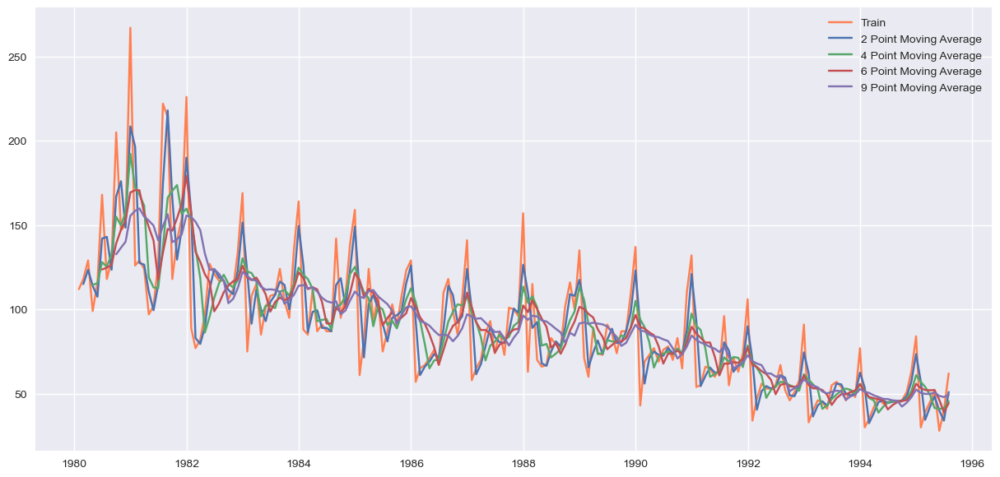

In [140]:
plt.plot(MovingAverage['Rose'], label='Train', color='coral')
plt.plot(MovingAverage['Rose_Trailing_2'], label='2 Point Moving Average')
plt.plot(MovingAverage['Rose_Trailing_4'], label='4 Point Moving Average')
plt.plot(MovingAverage['Rose_Trailing_6'],label = '6 Point Moving Average')
plt.plot(MovingAverage['Rose_Trailing_9'],label = '9 Point Moving Average')
plt.legend(loc = 'best');

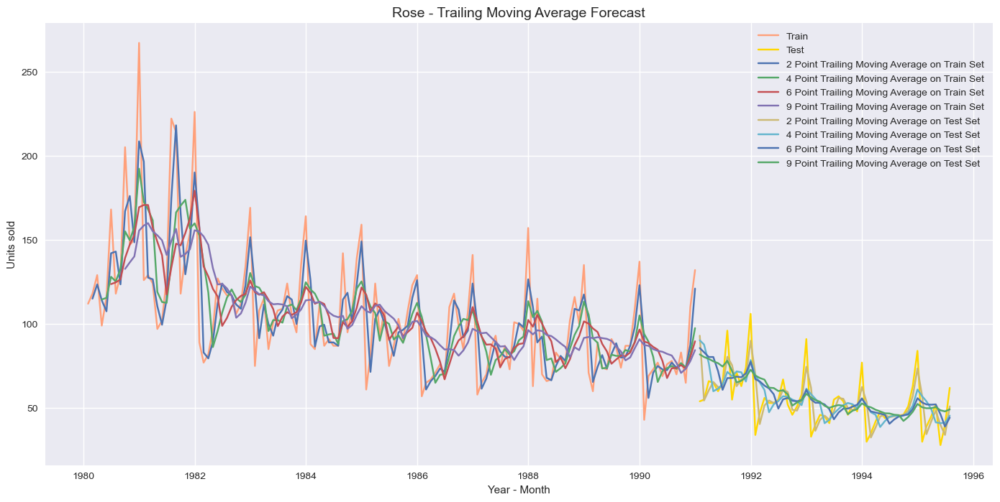

In [141]:
## Plotting on both the Training and Test data

plt.figure(figsize=(17,8))
plt.plot(trailing_MovingAverage_train['Rose'], label='Train', color = 'lightsalmon')
plt.plot(trailing_MovingAverage_test['Rose'], label='Test', color = 'gold')

plt.plot(trailing_MovingAverage_train['Rose_Trailing_2'], label='2 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Rose_Trailing_4'], label='4 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Rose_Trailing_6'],label = '6 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Rose_Trailing_9'],label = '9 Point Trailing Moving Average on Train Set')

plt.plot(trailing_MovingAverage_test['Rose_Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Rose_Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Rose_Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Rose_Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')
plt.legend(loc = 'best')
plt.xlabel('Year - Month')
plt.ylabel('Units sold')

plt.title("Rose - Trailing Moving Average Forecast", fontsize=14);

#### Model Evaluation

#### Sparkling Wine Test Data

In [142]:
## Test Data - rmse_spark and mape_spark for 2 point Spark_Trailing MA

rmse_spark_model4_test_2 = metrics.mean_squared_error(test['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_2'],squared=False)
mape_spark_model4_test_2 = MAPE(test['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_2'])
print("For 2 point Moving Average Model forecast on the Training Data,  rmse_spark is %3.3f mape_spark is %3.2f" %(rmse_spark_model4_test_2, mape_spark_model4_test_2))

## Test Data - rmse_spark and mape_spark for 4 point Spark_Trailing MA

rmse_spark_model4_test_4 = metrics.mean_squared_error(test['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_4'],squared=False)
mape_spark_model4_test_4 = MAPE(test['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_4'])
print("For 4 point Moving Average Model forecast on the Training Data,  rmse_spark is %3.3f mape_spark is %3.2f" %(rmse_spark_model4_test_4, mape_spark_model4_test_4))

## Test Data - rmse_spark and mape_spark for 6 point Spark_Trailing MA

rmse_spark_model4_test_6 = metrics.mean_squared_error(test['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_6'],squared=False)
mape_spark_model4_test_6 = MAPE(test['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_6'])
print("For 6 point Moving Average Model forecast on the Training Data,  rmse_spark is %3.3f mape_spark is %3.2f" %(rmse_spark_model4_test_6, mape_spark_model4_test_6))

## Test Data - rmse_spark and mape_spark for 9 point Spark_Trailing MA

rmse_spark_model4_test_9 = metrics.mean_squared_error(test['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_9'],squared=False)
mape_spark_model4_test_9 = MAPE(test['Sparkling'],trailing_MovingAverage_test['Spark_Trailing_9'])
print("For 9 point Moving Average Model forecast on the Training Data,  rmse_spark is %3.3f mape_spark is %3.2f" %(rmse_spark_model4_test_9, mape_spark_model4_test_9))

For 2 point Moving Average Model forecast on the Training Data,  rmse_spark is 813.401 mape_spark is 19.70
For 4 point Moving Average Model forecast on the Training Data,  rmse_spark is 1156.590 mape_spark is 35.96
For 6 point Moving Average Model forecast on the Training Data,  rmse_spark is 1283.927 mape_spark is 43.86
For 9 point Moving Average Model forecast on the Training Data,  rmse_spark is 1346.278 mape_spark is 46.86


#### Rose Wine Test Data

In [143]:
## Test Data - rmse_rose and mape_rose for 2 point rose_Trailing MA

rmse_rose_model4_test_2 = metrics.mean_squared_error(test['Rose'],trailing_MovingAverage_test['Rose_Trailing_2'],squared=False)
mape_rose_model4_test_2 = MAPE(test['Rose'],trailing_MovingAverage_test['Rose_Trailing_2'])
print("For 2 point Moving Average Model forecast on the Training Data,  rmse_rose is %3.3f mape_rose is %3.2f" %(rmse_rose_model4_test_2, mape_rose_model4_test_2))

## Test Data - rmse_rose and mape_rose for 4 point rose_Trailing MA

rmse_rose_model4_test_4 = metrics.mean_squared_error(test['Rose'],trailing_MovingAverage_test['Rose_Trailing_4'],squared=False)
mape_rose_model4_test_4 = MAPE(test['Rose'],trailing_MovingAverage_test['Rose_Trailing_4'])
print("For 4 point Moving Average Model forecast on the Training Data,  rmse_rose is %3.3f mape_rose is %3.2f" %(rmse_rose_model4_test_4, mape_rose_model4_test_4))

## Test Data - rmse_rose and mape_rose for 6 point rose_Trailing MA

rmse_rose_model4_test_6 = metrics.mean_squared_error(test['Rose'],trailing_MovingAverage_test['Rose_Trailing_6'],squared=False)
mape_rose_model4_test_6 = MAPE(test['Rose'],trailing_MovingAverage_test['Rose_Trailing_6'])
print("For 6 point Moving Average Model forecast on the Training Data,  rmse_rose is %3.3f mape_rose is %3.2f" %(rmse_rose_model4_test_6, mape_rose_model4_test_6))

## Test Data - rmse_rose and mape_rose for 9 point rose_Trailing MA

rmse_rose_model4_test_9 = metrics.mean_squared_error(test['Rose'],trailing_MovingAverage_test['Rose_Trailing_9'],squared=False)
mape_rose_model4_test_9 = MAPE(test['Rose'],trailing_MovingAverage_test['Rose_Trailing_9'])
print("For 9 point Moving Average Model forecast on the Training Data,  rmse_rose is %3.3f mape_rose is %3.2f" %(rmse_rose_model4_test_9, mape_rose_model4_test_9))

For 2 point Moving Average Model forecast on the Training Data,  rmse_rose is 11.529 mape_rose is 13.54
For 4 point Moving Average Model forecast on the Training Data,  rmse_rose is 14.451 mape_rose is 19.49
For 6 point Moving Average Model forecast on the Training Data,  rmse_rose is 14.566 mape_rose is 20.82
For 9 point Moving Average Model forecast on the Training Data,  rmse_rose is 14.728 mape_rose is 21.01


In [144]:
resultsDf_4 = pd.DataFrame({'Test RMSE': [rmse_spark_model4_test_2,rmse_spark_model4_test_4
                                          ,rmse_spark_model4_test_6,rmse_spark_model4_test_9]
                            ,'Test MAPE': [mape_spark_model4_test_2,mape_spark_model4_test_4,
                                           mape_spark_model4_test_6,mape_spark_model4_test_9]}
                           ,index=['2 point TMA','4 point TMA'
                                   ,'6 point TMA','9 point TMA'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_4])
spark_resultsDf

,Test RMSE,Test MAPE
Regression On Time,1389.135175,50.15
NaiveModel,3864.279352,152.87
SimpleAverage,1275.081804,38.90
2 point TMA,813.400684,19.70
4 point TMA,1156.589694,35.96
6 point TMA,1283.927428,43.86
9 point TMA,1346.278315,46.86


In [145]:
resultsDf_4 = pd.DataFrame({'Test RMSE': [rmse_rose_model4_test_2,rmse_rose_model4_test_4
                                          ,rmse_rose_model4_test_6,rmse_rose_model4_test_9]
                            ,'Test MAPE': [mape_rose_model4_test_2,mape_rose_model4_test_4,
                                           mape_rose_model4_test_6,mape_rose_model4_test_9]}
                           ,index=['2 point TMA','4 point TMA'
                                   ,'6 point TMA','9 point TMA'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_4])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82
NaiveModel,79.718559,145.10
SimpleAverage,53.460350,94.93
2 point TMA,11.529278,13.54
4 point TMA,14.451364,19.49
6 point TMA,14.566269,20.82
9 point TMA,14.727594,21.01


### Model 5: Simple Exponential Smoothing

In [146]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

In [147]:
SES_train = train.copy()
SES_test = test.copy()

In [148]:
SES_train['Sparkling'].head()

YearMonth
1980-01-31    1686
1980-02-29    1591
1980-03-31    2304
1980-04-30    1712
1980-05-31    1471
Name: Sparkling, dtype: int64

In [149]:
SES_train['Rose'].head()

YearMonth
1980-01-31    112.0
1980-02-29    118.0
1980-03-31    129.0
1980-04-30     99.0
1980-05-31    116.0
Name: Rose, dtype: float64

#### Sparkling Wine 

In [150]:
model = SimpleExpSmoothing(np.asarray(SES_train['Sparkling']))

Test: For alpha = 0.05,  RMSE is 1316.4117 MAPE is 45.50
For smoothing level = 0.05,  Initial level 1686.00


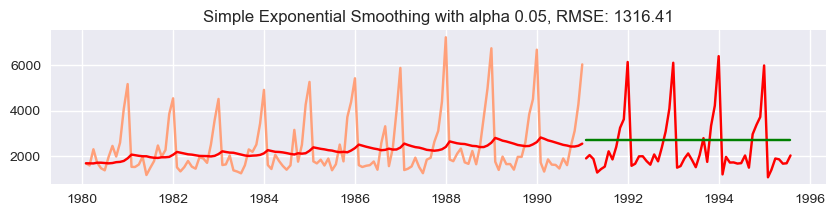

Test: For alpha = 0.10,  RMSE is 1375.3934 MAPE is 49.53
For smoothing level = 0.10,  Initial level 1686.00


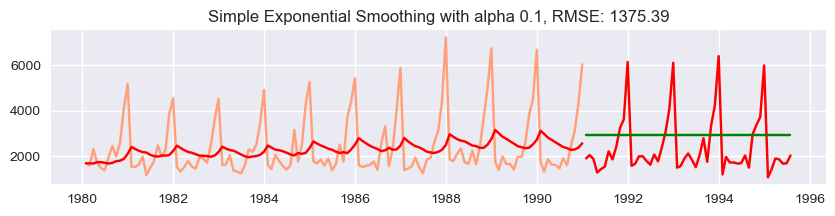

Test: For alpha = 0.20,  RMSE is 1595.2068 MAPE is 60.46
For smoothing level = 0.20,  Initial level 1686.00


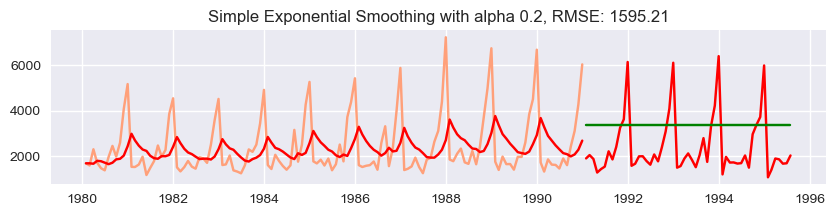

Test: For alpha = 0.30,  RMSE is 1935.5071 MAPE is 75.66
For smoothing level = 0.30,  Initial level 1686.00


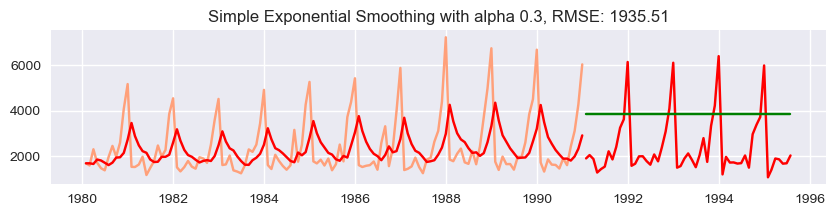

Test: For alpha = 0.50,  RMSE is 2666.3514 MAPE is 106.27
For smoothing level = 0.50,  Initial level 1686.00


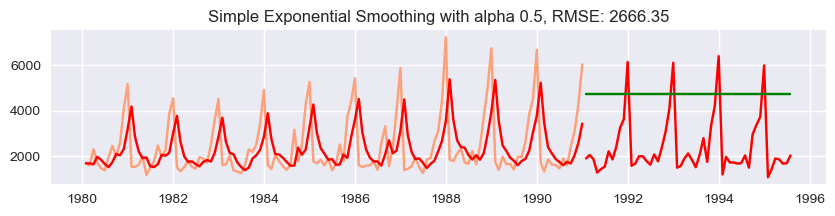

Test: For alpha = 0.99,  RMSE is 3847.5490 MAPE is 152.21
For smoothing level = 0.99,  Initial level 1686.00


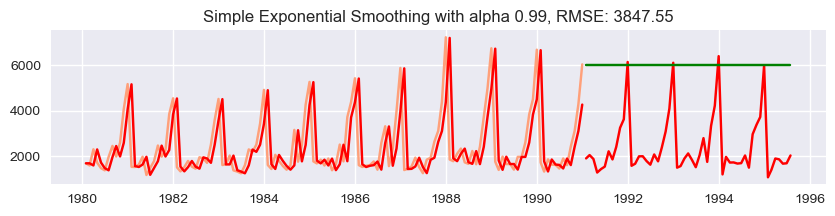

In [151]:
alpha_list = [0.05, 0.1, 0.2, 0.3, 0.5, 0.99]
pred_train_SES  = train.copy()
pred_test_SES  = test.copy() 


for alpha_value in alpha_list:

    alpha_str            =  "SES " + str(alpha_value)
    mode_fit_i           =  model.fit(smoothing_level = alpha_value, optimized=False)
    pred_train_SES[alpha_str]  =  mode_fit_i.fittedvalues 
    pred_test_SES[alpha_str]  =  mode_fit_i.forecast(len(test['Sparkling']))
    rmse                 =  np.sqrt(metrics.mean_squared_error(test['Sparkling'], pred_test_SES[alpha_str]))
    mape                 =  MAPE(test['Sparkling'],pred_test_SES[alpha_str])
    


    print("Test: For alpha = %1.2f,  RMSE is %3.4f MAPE is %3.2f" %(alpha_value, rmse, mape))
    print("For smoothing level = %1.2f,  Initial level %1.2f" %(mode_fit_i.params['smoothing_level'],mode_fit_i.params['initial_level']))
    plt.figure(figsize=(10,2))
    plt.plot(train['Sparkling'], color = 'lightsalmon')
    plt.plot(test['Sparkling'], color = 'red')
    plt.plot(pred_train_SES[alpha_str], color = 'red')
    plt.plot(pred_test_SES[alpha_str], color = 'green')
    plt.title('Simple Exponential Smoothing with alpha ' + str(alpha_value)+', RMSE: '+str(np.round(rmse,2))) 
    plt.show();

In [152]:
model_SES_autofit = model.fit(optimized=True,use_brute=True)

In [153]:
model_SES_autofit.params

{'smoothing_level': 0.049607360581862936,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 1818.535750008871,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [154]:
SES_train['predict_spark'] = model_SES_autofit.fittedvalues
SES_train.head()

,Sparkling,Rose,predict_spark
YearMonth,,,
1980-01-31,1686,112.0,1818.535750
1980-02-29,1591,118.0,1811.961001
1980-03-31,2304,129.0,1800.999709
1980-04-30,1712,99.0,1825.952226
1980-05-31,1471,116.0,1820.299357


In [155]:
SES_test['predict_spark'] = model_SES_autofit.forecast(steps=len(SES_test))
SES_test.head()

,Sparkling,Rose,predict_spark
YearMonth,,,
1991-01-31,1902,54.0,2724.932624
1991-02-28,2049,55.0,2724.932624
1991-03-31,1874,66.0,2724.932624
1991-04-30,1279,65.0,2724.932624
1991-05-31,1432,60.0,2724.932624


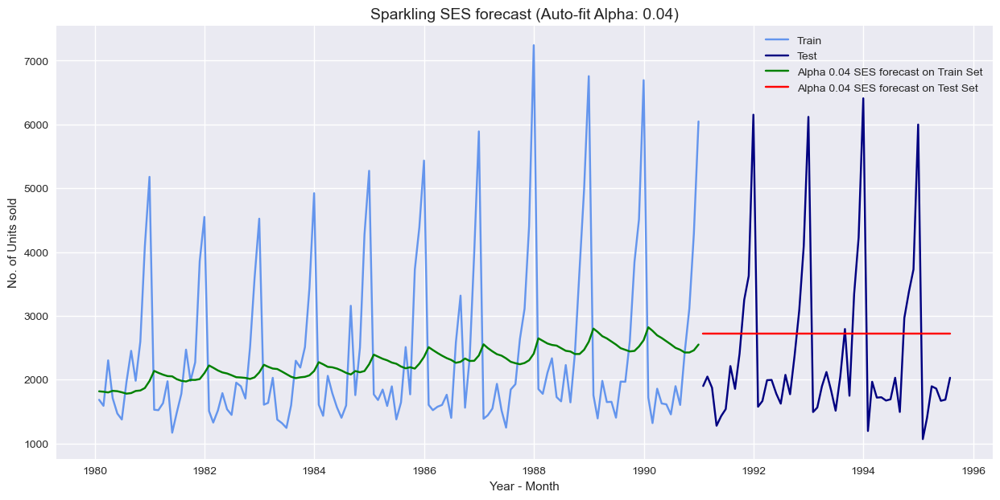

In [156]:
## Plotting on both the Training and Test data
plt.plot(SES_train['Sparkling'], label='Train', color = 'cornflowerblue')
plt.plot(SES_test['Sparkling'], label='Test', color = 'navy')

plt.plot(SES_train['predict_spark'],color = 'green', label='Alpha 0.04 SES forecast on Train Set')
plt.plot(SES_test['predict_spark'],color = 'red', label='Alpha 0.04 SES forecast on Test Set')

plt.legend(loc='best')

plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Sparkling SES forecast (Auto-fit Alpha: 0.04)', fontsize = 14);

#### Rose Wine

In [157]:
model_rose = SimpleExpSmoothing(SES_train['Rose'])

Test: For alpha = 0.10,  RMSE is 36.8278 MAPE is 63.94
For smoothing level = 0.10,  Initial level 112.00


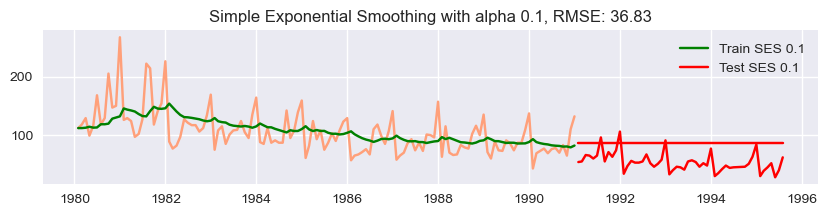

Test: For alpha = 0.20,  RMSE is 41.3617 MAPE is 72.21
For smoothing level = 0.20,  Initial level 112.00


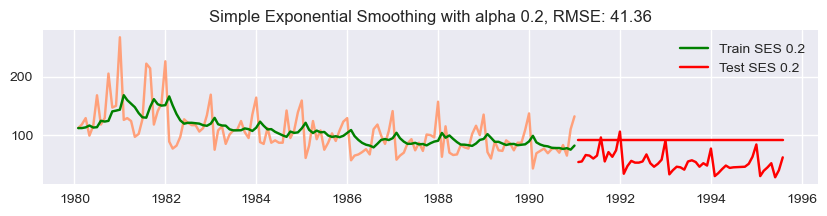

Test: For alpha = 0.30,  RMSE is 47.5046 MAPE is 83.71
For smoothing level = 0.30,  Initial level 112.00


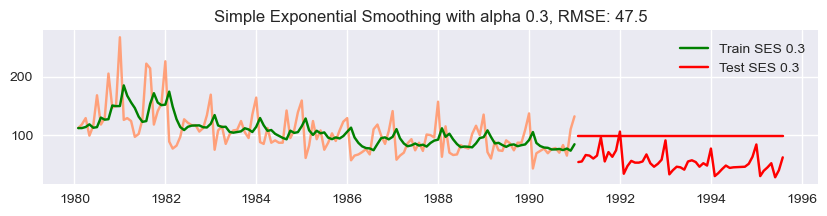

Test: For alpha = 0.50,  RMSE is 59.6416 MAPE is 106.81
For smoothing level = 0.50,  Initial level 112.00


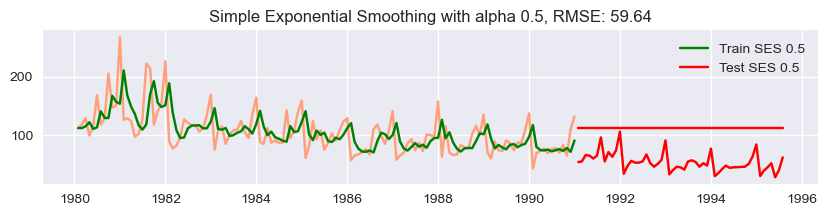

Test: For alpha = 0.99,  RMSE is 79.4985 MAPE is 144.69
For smoothing level = 0.99,  Initial level 112.00


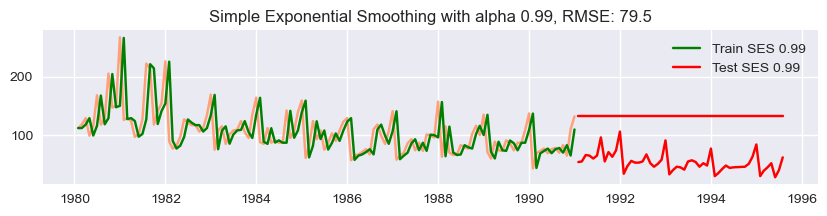

In [158]:
alpha_list = [0.1, 0.2, 0.3, 0.5, 0.99]
pred_train_SES  = train.copy()
pred_test_SES  = test.copy() 


for alpha_value in alpha_list:

    alpha_str            =  "SES " + str(alpha_value)
    mode_fit_i           =  model_rose.fit(smoothing_level = alpha_value, optimized=False)
    pred_train_SES[alpha_str]  =  mode_fit_i.fittedvalues 
    pred_test_SES[alpha_str]  =  mode_fit_i.forecast(len(test['Rose']))
    rmse                 =  np.sqrt(metrics.mean_squared_error(test['Rose'], pred_test_SES[alpha_str]))
    mape                 =  MAPE(test['Rose'],pred_test_SES[alpha_str])
    


    print("Test: For alpha = %1.2f,  RMSE is %3.4f MAPE is %3.2f" %(alpha_value, rmse, mape))
    print("For smoothing level = %1.2f,  Initial level %1.2f" %(mode_fit_i.params['smoothing_level'],mode_fit_i.params['initial_level']))
    plt.figure(figsize=(10,2))
    #Plotting the training, test and the predicted time series plots
    plt.plot(train['Rose'], color = 'lightsalmon')
    plt.plot(test['Rose'], color = 'red')
    plt.plot(pred_train_SES[alpha_str], label  = "Train "+alpha_str, color = 'green')
    plt.plot(pred_test_SES[alpha_str], label  = "Test "+alpha_str, color = 'red')
    plt.title('Simple Exponential Smoothing with alpha ' + str(alpha_value)+', RMSE: '+str(np.round(rmse,2)))
    plt.legend(loc='best') 
    plt.show()

In [159]:
model_SES_autofit2 = model_rose.fit(optimized=True,use_brute=True)
model_SES_autofit2.params

{'smoothing_level': 0.0987493111726833,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 134.38720226208358,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [160]:
SES_train['predict_rose'] = model_SES_autofit2.fittedvalues
SES_train.head()

,Sparkling,Rose,predict_spark,predict_rose
YearMonth,,,,
1980-01-31,1686,112.0,1818.535750,134.387202
1980-02-29,1591,118.0,1811.961001,132.176481
1980-03-31,2304,129.0,1800.999709,130.776564
1980-04-30,1712,99.0,1825.952226,130.601129
1980-05-31,1471,116.0,1820.299357,127.480539


In [161]:
SES_test['predict_rose'] = model_SES_autofit2.forecast(steps=len(SES_test))
SES_test.head()

,Sparkling,Rose,predict_spark,predict_rose
YearMonth,,,,
1991-01-31,1902,54.0,2724.932624,87.104983
1991-02-28,2049,55.0,2724.932624,87.104983
1991-03-31,1874,66.0,2724.932624,87.104983
1991-04-30,1279,65.0,2724.932624,87.104983
1991-05-31,1432,60.0,2724.932624,87.104983


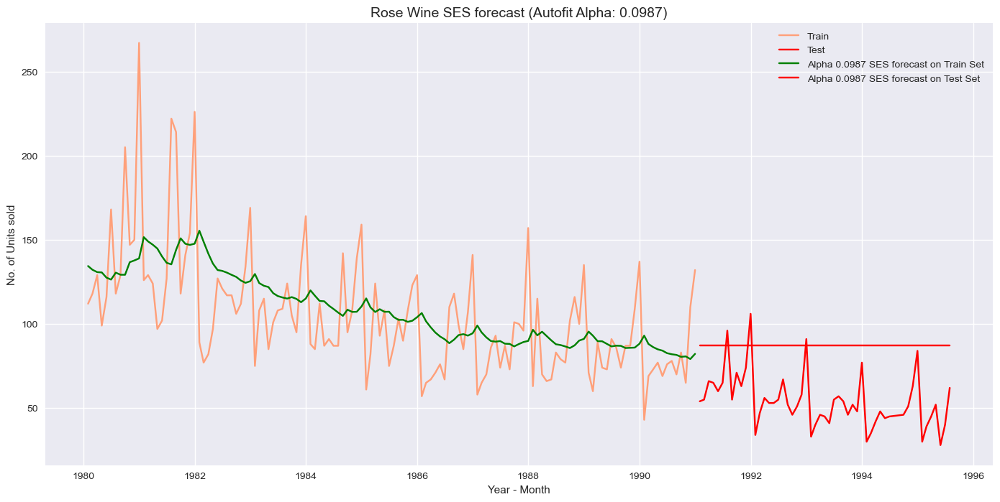

In [162]:
plt.figure(figsize=(17,8))
plt.plot(SES_train['Rose'], label='Train', color = 'lightsalmon')
plt.plot(SES_test['Rose'], label='Test', color = 'red')

plt.plot(SES_train['predict_rose'],color = 'green', label='Alpha 0.0987 SES forecast on Train Set')
plt.plot(SES_test['predict_rose'],color = 'red', label='Alpha 0.0987 SES forecast on Test Set')

plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Rose Wine SES forecast (Autofit Alpha: 0.0987)', fontsize = 14);

#### Model Evaluation

In [163]:
## Sparkling Wine Training Data - RMSE and MAPE

rmse_spark_model5_train = metrics.mean_squared_error(train['Sparkling'],SES_train['predict_spark'],squared=False)
mape_spark_model5_train = MAPE(train['Sparkling'],SES_train['predict_spark'])
print("For SES forecast on the Sparkling Wine Training Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model5_train, mape_spark_model5_train))

For SES forecast on the Sparkling Wine Training Data:  RMSE is 1315.232 and MAPE is 39.92


In [164]:
## Sparkling Wine Testing Data - RMSE and MAPE

rmse_spark_model5_test = metrics.mean_squared_error(test['Sparkling'],SES_test['predict_spark'],squared=False)
mape_spark_model5_test = MAPE(test['Sparkling'],SES_test['predict_spark'])
print("For SES forecast on the Sparkling Wine Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model5_test, mape_spark_model5_test))

For SES forecast on the Sparkling Wine Testing Data:  RMSE is 1316.035 and MAPE is 45.47


In [165]:
## Rose Wine Training Data - RMSE and MAPE

rmse_rose_model5_train = metrics.mean_squared_error(train['Rose'],SES_train['predict_rose'],squared=False)
mape_rose_model5_train = MAPE(train['Rose'],SES_train['predict_rose'])
print("For SES forecast on the Rose Wine Training Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model5_train, mape_rose_model5_train))

For SES forecast on the Rose Wine Training Data:  RMSE is 31.501 and MAPE is 22.73


In [166]:
## Rose Wine Testing Data - RMSE and MAPE

rmse_rose_model5_test = metrics.mean_squared_error(test['Rose'],SES_test['predict_rose'],squared=False)
mape_rose_model5_test = MAPE(test['Rose'],SES_test['predict_rose'])
print("For SES forecast on the Rose Wine Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model5_test, mape_rose_model5_test))

For SES forecast on the Rose Wine Testing Data:  RMSE is 36.796 and MAPE is 63.88


In [167]:
resultsDf_5 = pd.DataFrame({'Test RMSE': [rmse_spark_model5_test],'Test MAPE': [mape_spark_model5_test]},index=['SES Alpha 0.00'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_5])
spark_resultsDf

,Test RMSE,Test MAPE
Regression On Time,1389.135175,50.15
NaiveModel,3864.279352,152.87
SimpleAverage,1275.081804,38.90
2 point TMA,813.400684,19.70
4 point TMA,1156.589694,35.96
6 point TMA,1283.927428,43.86
9 point TMA,1346.278315,46.86
SES Alpha 0.00,1316.035487,45.47


In [168]:
resultsDf_5 = pd.DataFrame({'Test RMSE': [rmse_rose_model5_test],'Test MAPE': [mape_rose_model5_test]},index=['SES Alpha 0.01'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_5])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82
NaiveModel,79.718559,145.10
SimpleAverage,53.460350,94.93
2 point TMA,11.529278,13.54
4 point TMA,14.451364,19.49
6 point TMA,14.566269,20.82
9 point TMA,14.727594,21.01
SES Alpha 0.01,36.796004,63.88


### Model 6: Double Exponential Smoothing (Holt's Model)

In [169]:
DES_train = train.copy()
DES_test = test.copy()

In [170]:
import statsmodels
statsmodels.__version__

'0.13.2'

#### Sparkling Wine

In [171]:
model_DES = Holt(DES_train['Sparkling'])

In [172]:
resultsDf_6 = pd.DataFrame({'Alpha':[],'Beta':[],'Train RMSE':[],'Train MAPE':[],
                            'Test RMSE': [],'Test MAPE': []})
for i in np.arange(0.1,1.1,0.1):
    for j in np.arange(0.1,1.1,0.1):
        model_DES_alpha_i_j = model_DES.fit(smoothing_level=i,smoothing_trend=j,optimized=True,use_brute=True)
        DES_train['predict_spark',i,j] = model_DES_alpha_i_j.fittedvalues
        DES_test['predict_spark',i,j] = model_DES_alpha_i_j.forecast(len(test['Sparkling']))
        
        rmse_spark_model6_train = np.round(metrics.mean_squared_error(DES_train['Sparkling'],DES_train['predict_spark',i,j],squared=False),2)
        mape_spark_model6_train = MAPE(DES_train['Sparkling'],DES_train['predict_spark',i,j])
        
        rmse_spark_model6_test = np.round(metrics.mean_squared_error(DES_test['Sparkling'],DES_test['predict_spark',i,j],squared=False),2)
        mape_spark_model6_test = MAPE(DES_test['Sparkling'],DES_test['predict_spark',i,j])
        
        resultsDf_6 = resultsDf_6.append({'Alpha':i,'Beta':j,
                                          'Train RMSE':rmse_spark_model6_train ,'Train MAPE': mape_spark_model6_train,
                                          'Test RMSE':rmse_spark_model6_test ,'Test MAPE':mape_spark_model6_test}, 
                                         ignore_index=True)

In [173]:
resultsDf_6.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Train RMSE,Train MAPE,Test RMSE,Test MAPE
0,0.1,0.1,1363.47,44.26,1779.42,67.23
1,0.1,0.2,1398.19,45.61,2601.54,95.50
10,0.2,0.1,1412.03,46.62,3611.77,135.41
2,0.1,0.3,1431.37,46.90,4288.43,155.25
20,0.3,0.1,1428.27,46.92,5908.19,223.50


In [174]:
resultsDf_6.sort_values(by=['Test MAPE']).head()

,Alpha,Beta,Train RMSE,Train MAPE,Test RMSE,Test MAPE
0,0.1,0.1,1363.47,44.26,1779.42,67.23
1,0.1,0.2,1398.19,45.61,2601.54,95.50
10,0.2,0.1,1412.03,46.62,3611.77,135.41
2,0.1,0.3,1431.37,46.90,4288.43,155.25
3,0.1,0.4,1466.77,48.27,6042.38,219.09


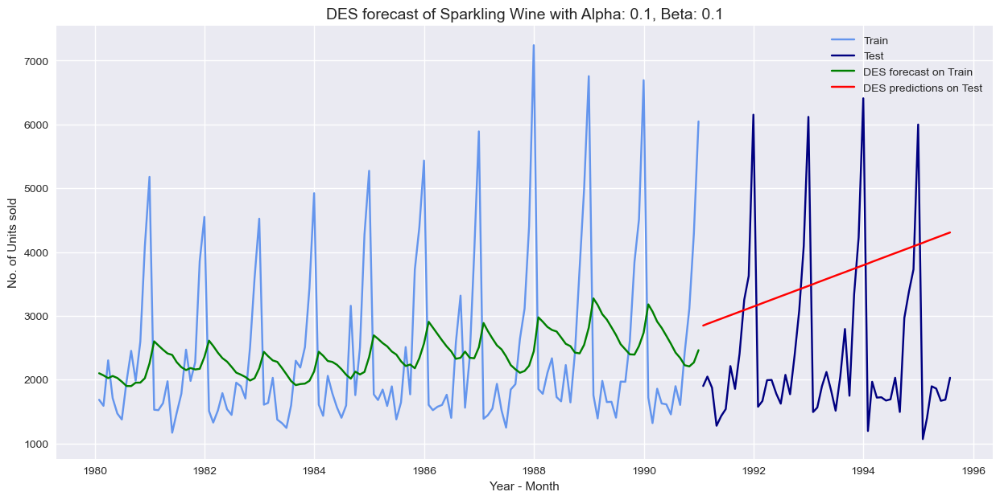

In [175]:
plt.plot(DES_train['Sparkling'], label='Train', color = 'cornflowerblue')
plt.plot(DES_test['Sparkling'], label='Test', color = 'navy')

plt.plot(DES_train['predict_spark', 0.1, 0.1], color = 'green', label='DES forecast on Train')
plt.plot(DES_test['predict_spark', 0.1, 0.1], color = 'red', label='DES predictions on Test')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('DES forecast of Sparkling Wine with Alpha: 0.1, Beta: 0.1', fontsize=14)
plt.legend(loc='best');

In [176]:
#Trying outfit for the model
model_DES_autofit = model_DES.fit(optimized=True,use_brute=True)

In [177]:
model_DES_autofit.params

{'smoothing_level': 0.6885714285714285,
 'smoothing_trend': 9.999999999999999e-05,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 1686.0,
 'initial_trend': -95.0,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [178]:
alpha = model_DES_autofit.params['smoothing_level']
beta = model_DES_autofit.params['smoothing_trend']
alpha_6_1 = alpha
beta_6_1 = beta

In [179]:
DES_train['predict_spark',alpha,beta] = model_DES_autofit.fittedvalues

In [180]:
DES_test['predict_spark',alpha,beta] = model_DES_autofit.forecast(len(test['Sparkling']))

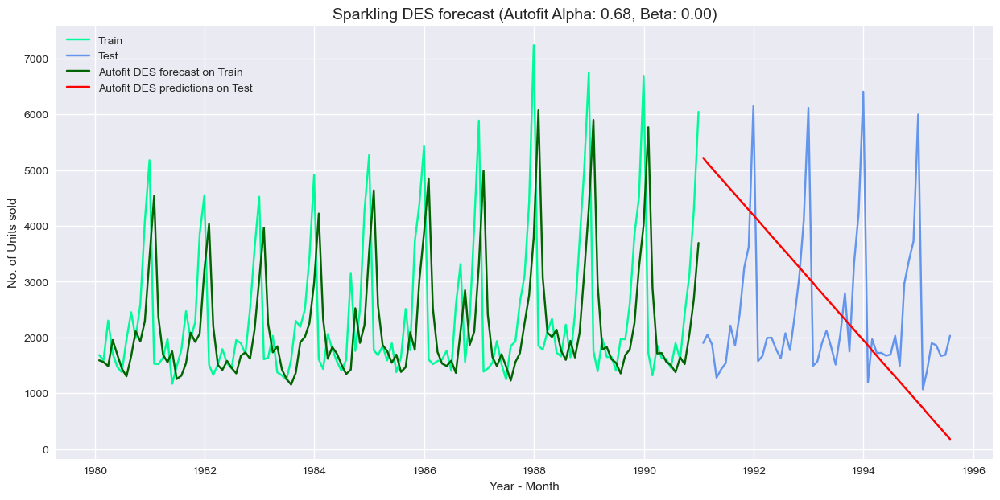

In [181]:
plt.plot(DES_train['Sparkling'], label='Train', color = 'mediumspringgreen')
plt.plot(DES_test['Sparkling'], label='Test', color = 'cornflowerblue')

plt.plot(DES_train['predict_spark',alpha,beta], color = 'darkgreen', label='Autofit DES forecast on Train')
plt.plot(DES_test['predict_spark',alpha,beta], color = 'red', label='Autofit DES predictions on Test')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Sparkling DES forecast (Autofit Alpha: 0.68, Beta: 0.00)', fontsize=14);
plt.legend(loc='best');

In [182]:
rmse_spark_model6_train = metrics.mean_squared_error(DES_train['Sparkling'],DES_train['predict_spark',alpha,beta],squared=False)
mape_spark_model6_train = MAPE(DES_train['Sparkling'],DES_train['predict_spark',alpha,beta])
        
rmse_spark_model6_test = metrics.mean_squared_error(DES_test['Sparkling'],DES_test['predict_spark',alpha,beta],squared=False)
mape_spark_model6_test = MAPE(DES_test['Sparkling'],DES_test['predict_spark',alpha,beta])

resultsDf_6 = resultsDf_6.append({'Alpha':alpha,'Beta':beta,'Train RMSE':rmse_spark_model6_train
                                      ,'Train MAPE': mape_spark_model6_train,'Test RMSE':rmse_spark_model6_test
                                      ,'Test MAPE':mape_spark_model6_test}, ignore_index=True)

In [183]:
resultsDf_6.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Train RMSE,Train MAPE,Test RMSE,Test MAPE
0,0.100000,0.1000,1363.47000,44.26,1779.420000,67.23
100,0.688571,0.0001,1349.65046,39.23,2007.238526,68.23
1,0.100000,0.2000,1398.19000,45.61,2601.540000,95.50
10,0.200000,0.1000,1412.03000,46.62,3611.770000,135.41
2,0.100000,0.3000,1431.37000,46.90,4288.430000,155.25


In [184]:
resultsDf_6.sort_values(by=['Test MAPE']).head()

,Alpha,Beta,Train RMSE,Train MAPE,Test RMSE,Test MAPE
0,0.100000,0.1000,1363.47000,44.26,1779.420000,67.23
100,0.688571,0.0001,1349.65046,39.23,2007.238526,68.23
1,0.100000,0.2000,1398.19000,45.61,2601.540000,95.50
10,0.200000,0.1000,1412.03000,46.62,3611.770000,135.41
2,0.100000,0.3000,1431.37000,46.90,4288.430000,155.25


#### Auto fitted model shows better RMSE and MAPE in train, but not the best fit in test set

### Rose Wine

In [185]:
model_DES_rose = Holt(DES_train['Rose'])

In [186]:
resultsDf_6_rose = pd.DataFrame({'Alpha':[],'Beta':[],'Train RMSE':[],'Train MAPE':[]
                                ,'Test RMSE': [],'Test MAPE': []})
for i in np.arange(0.1,1.1,0.1):
    for j in np.arange(0.1,1.1,0.1):
        model_DES_rose_alpha_i_j = model_DES_rose.fit(smoothing_level=i,smoothing_trend=j,optimized=True,use_brute=True)
        DES_train['predict_rose',i,j] = model_DES_rose_alpha_i_j.fittedvalues
        DES_test['predict_rose',i,j] = model_DES_rose_alpha_i_j.forecast(len(test['Rose']))
        
        rmse_rose_model6_train = metrics.mean_squared_error(DES_train['Rose'],DES_train['predict_rose',i,j],squared=False)
        mape_rose_model6_train = MAPE(DES_train['Rose'],DES_train['predict_rose',i,j])
        
        rmse_rose_model6_test = metrics.mean_squared_error(DES_test['Rose'],DES_test['predict_rose',i,j],squared=False)
        mape_rose_model6_test = MAPE(DES_test['Rose'],DES_test['predict_rose',i,j])
        
        resultsDf_6_rose = resultsDf_6_rose.append({'Alpha':i,'Beta':j,'Train RMSE':rmse_rose_model6_train
                                      ,'Train MAPE': mape_rose_model6_train,'Test RMSE':rmse_rose_model6_test
                                      ,'Test MAPE':mape_rose_model6_test}, ignore_index=True)

In [187]:
resultsDf_6_rose.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Train RMSE,Train MAPE,Test RMSE,Test MAPE
0,0.1,0.1,32.026565,22.78,37.056911,64.02
1,0.1,0.2,32.685228,23.63,48.806921,83.29
10,0.2,0.1,32.796403,23.06,65.731352,113.20
2,0.1,0.3,32.925494,24.23,78.209401,131.33
20,0.3,0.1,33.528397,23.47,98.653063,170.12


In [188]:
resultsDf_6_rose.sort_values(by=['Test MAPE']).head()

,Alpha,Beta,Train RMSE,Train MAPE,Test RMSE,Test MAPE
0,0.1,0.1,32.026565,22.78,37.056911,64.02
1,0.1,0.2,32.685228,23.63,48.806921,83.29
10,0.2,0.1,32.796403,23.06,65.731352,113.20
2,0.1,0.3,32.925494,24.23,78.209401,131.33
3,0.1,0.4,33.179749,24.75,99.554566,165.49


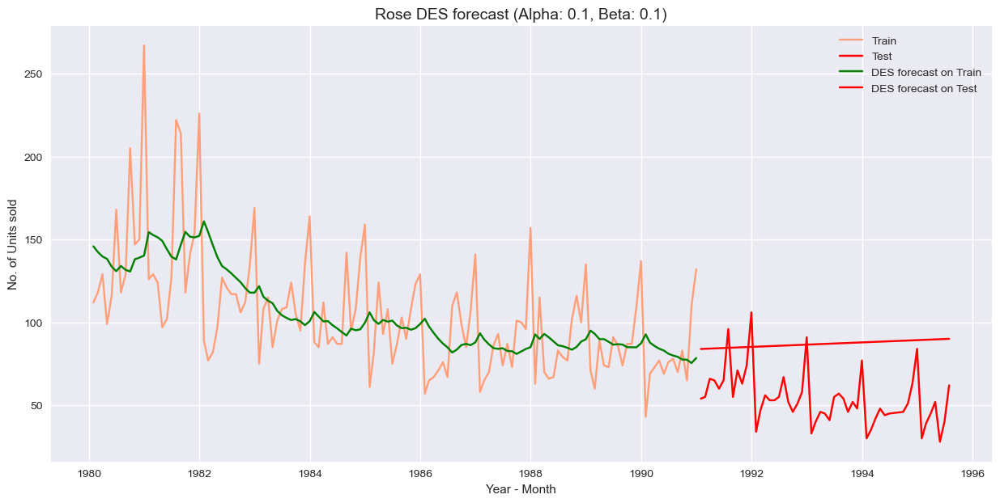

In [189]:
plt.plot(DES_train['Rose'], label='Train', color = 'lightsalmon')
plt.plot(DES_test['Rose'], label='Test', color = 'red')

plt.plot(DES_train['predict_rose', 0.1, 0.1], color = 'green', label='DES forecast on Train')
plt.plot(DES_test['predict_rose', 0.1, 0.1], color = 'red', label='DES forecast on Test')

plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Rose DES forecast (Alpha: 0.1, Beta: 0.1)', fontsize=14);
plt.legend(loc='best');

##### Attempting autofit

In [190]:
model_DES_rose_autofit = model_DES_rose.fit(optimized=True,use_brute=True)

In [191]:
model_DES_rose_autofit.params

{'smoothing_level': 0.017549790270679714,
 'smoothing_trend': 3.236153800377395e-05,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 138.82081494774005,
 'initial_trend': -0.492580228245491,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [192]:
alpha = model_DES_rose_autofit.params['smoothing_level']
beta = model_DES_rose_autofit.params['smoothing_trend']
alpha_6_2 = alpha
beta_6_2 = beta

In [193]:
DES_train['predict_rose',alpha,beta] = model_DES_rose_autofit.fittedvalues

In [194]:
DES_test['predict_rose',alpha,beta] = model_DES_rose_autofit.forecast(len(test['Rose']))

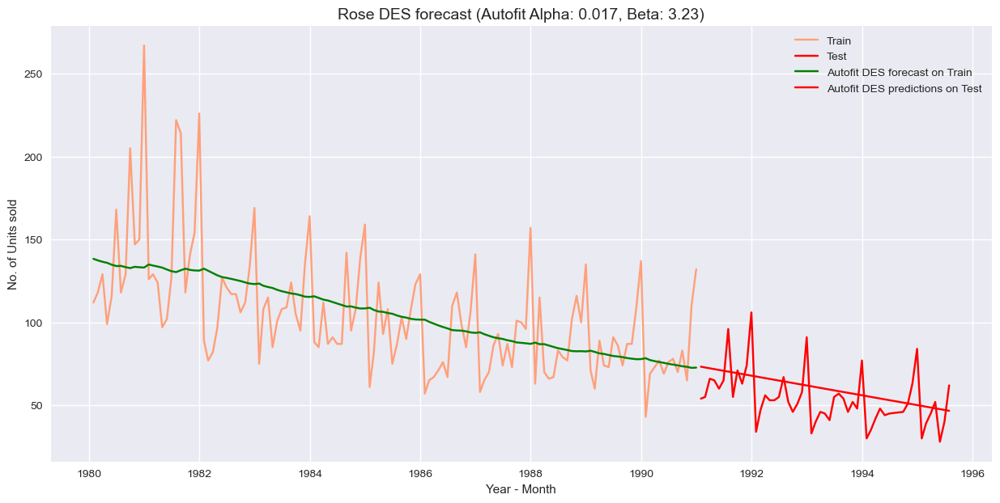

In [195]:
plt.plot(DES_train['Rose'], label='Train', color = 'lightsalmon')
plt.plot(DES_test['Rose'], label='Test', color = 'red')

plt.plot(DES_train['predict_rose',alpha,beta], color = 'green', label='Autofit DES forecast on Train')
plt.plot(DES_test['predict_rose',alpha,beta], color = 'red', label='Autofit DES predictions on Test')

plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Rose DES forecast (Autofit Alpha: 0.017, Beta: 3.23)', fontsize=14)

plt.legend(loc='best');

In [196]:
rmse_rose_model6_train = metrics.mean_squared_error(DES_train['Rose'],DES_train['predict_rose',alpha,beta],squared=False)
mape_rose_model6_train = MAPE(DES_train['Rose'],DES_train['predict_rose',alpha,beta])
        
rmse_rose_model6_test = metrics.mean_squared_error(DES_test['Rose'],DES_test['predict_rose',alpha,beta],squared=False)
mape_rose_model6_test = MAPE(DES_test['Rose'],DES_test['predict_rose',alpha,beta])
        
resultsDf_6_rose = resultsDf_6_rose.append({'Alpha':alpha,'Beta':beta,'Train RMSE':rmse_rose_model6_train
                                      ,'Train MAPE': mape_rose_model6_train,'Test RMSE':rmse_rose_model6_test
                                      ,'Test MAPE':mape_rose_model6_test}, ignore_index=True)

In [197]:
resultsDf_6_rose.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Train RMSE,Train MAPE,Test RMSE,Test MAPE
100,0.01755,0.000032,30.890794,21.61,15.706968,24.12
0,0.10000,0.100000,32.026565,22.78,37.056911,64.02
1,0.10000,0.200000,32.685228,23.63,48.806921,83.29
10,0.20000,0.100000,32.796403,23.06,65.731352,113.20
2,0.10000,0.300000,32.925494,24.23,78.209401,131.33


In [198]:
resultsDf_6_rose.sort_values(by=['Test MAPE']).head()

,Alpha,Beta,Train RMSE,Train MAPE,Test RMSE,Test MAPE
100,0.01755,0.000032,30.890794,21.61,15.706968,24.12
0,0.10000,0.100000,32.026565,22.78,37.056911,64.02
1,0.10000,0.200000,32.685228,23.63,48.806921,83.29
10,0.20000,0.100000,32.796403,23.06,65.731352,113.20
2,0.10000,0.300000,32.925494,24.23,78.209401,131.33


### Model Evaluation

In [199]:
resultsDf_6_1 = pd.DataFrame({'Test RMSE': [resultsDf_6['Test RMSE'][0],resultsDf_6['Test RMSE'][100]],
                              'Test MAPE': [resultsDf_6['Test MAPE'][0],resultsDf_6['Test MAPE'][100]]}
                           ,index=['DES Alpha 0.1,Beta 0.1','DES Alpha 0.6,Beta 0.0'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_6_1])
spark_resultsDf

,Test RMSE,Test MAPE
Regression On Time,1389.135175,50.15
NaiveModel,3864.279352,152.87
SimpleAverage,1275.081804,38.90
2 point TMA,813.400684,19.70
4 point TMA,1156.589694,35.96
6 point TMA,1283.927428,43.86
9 point TMA,1346.278315,46.86
SES Alpha 0.00,1316.035487,45.47
"DES Alpha 0.1,Beta 0.1",1779.420000,67.23
"DES Alpha 0.6,Beta 0.0",2007.238526,68.23


In [200]:
resultsDf_6_1 = pd.DataFrame({'Test RMSE':[resultsDf_6_rose['Test RMSE'][100],resultsDf_6_rose['Test RMSE'][0]],
                              'Test MAPE':[resultsDf_6_rose['Test MAPE'][100],resultsDf_6_rose['Test MAPE'][0]]}
                           ,index=['DES Alpha 0.017, Beta 3.23','DES Alpha 0.10, Beta 0.10'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_6_1])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82
NaiveModel,79.718559,145.10
SimpleAverage,53.460350,94.93
2 point TMA,11.529278,13.54
4 point TMA,14.451364,19.49
6 point TMA,14.566269,20.82
9 point TMA,14.727594,21.01
SES Alpha 0.01,36.796004,63.88
"DES Alpha 0.017, Beta 3.23",15.706968,24.12
"DES Alpha 0.10, Beta 0.10",37.056911,64.02


### Model 7: Triple Exponential Smoothing (Holt - Winter's Model)

In [201]:
TES_train = train.copy()
TES_test = test.copy()

### Sparking Wine

In [202]:
model_TES = ExponentialSmoothing(TES_train['Sparkling'],trend='additive',seasonal='multiplicative',freq='M')

In [203]:
resultsDf_7_1 = pd.DataFrame({'Alpha':[],'Beta':[],'Gamma':[],'Train RMSE':[],'Train MAPE':[]
                                ,'Test RMSE': [],'Test MAPE': []})
for i in np.arange(0.1,1.1,0.1):
    for j in np.arange(0.1,1.1,0.1):
        for k in np.arange(0.1,1.1,0.1):
            model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=i,smoothing_trend=j,smoothing_seasonal=k,optimized=True,use_brute=True)
            TES_train['predict_spark',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
            TES_test['predict_spark',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=len(test['Sparkling']))
        
            rmse_spark_model7_train = metrics.mean_squared_error(TES_train['Sparkling'],TES_train['predict_spark',i,j,k],squared=False)
            mape_spark_model7_train = MAPE(TES_train['Sparkling'],TES_train['predict_spark',i,j,k])
        
            rmse_spark_model7_test = metrics.mean_squared_error(TES_test['Sparkling'],TES_test['predict_spark',i,j,k],squared=False)
            mape_spark_model7_test = MAPE(TES_test['Sparkling'],TES_test['predict_spark',i,j,k])
        
            resultsDf_7_1 = resultsDf_7_1.append({'Alpha':i,'Beta':j,'Gamma':k,'Train RMSE':rmse_spark_model7_train
                                      ,'Train MAPE': mape_spark_model7_train,'Test RMSE':rmse_spark_model7_test
                                      ,'Test MAPE': mape_spark_model7_test}, ignore_index=True)

In [204]:
resultsDf_7_1.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
211,0.3,0.2,0.2,377.777799,11.26,314.906684,10.10
301,0.4,0.1,0.2,374.619861,11.24,315.935531,10.45
300,0.4,0.1,0.1,370.612639,11.03,318.103496,10.01
402,0.5,0.1,0.3,390.175608,11.54,325.544937,9.99
30,0.1,0.4,0.1,400.768319,11.48,331.257015,10.54


In [205]:
resultsDf_7_1.sort_values(by=['Test MAPE']).head()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
137,0.2,0.4,0.8,469.644813,13.45,336.712085,9.98
402,0.5,0.1,0.3,390.175608,11.54,325.544937,9.99
300,0.4,0.1,0.1,370.612639,11.03,318.103496,10.01
211,0.3,0.2,0.2,377.777799,11.26,314.906684,10.10
301,0.4,0.1,0.2,374.619861,11.24,315.935531,10.45


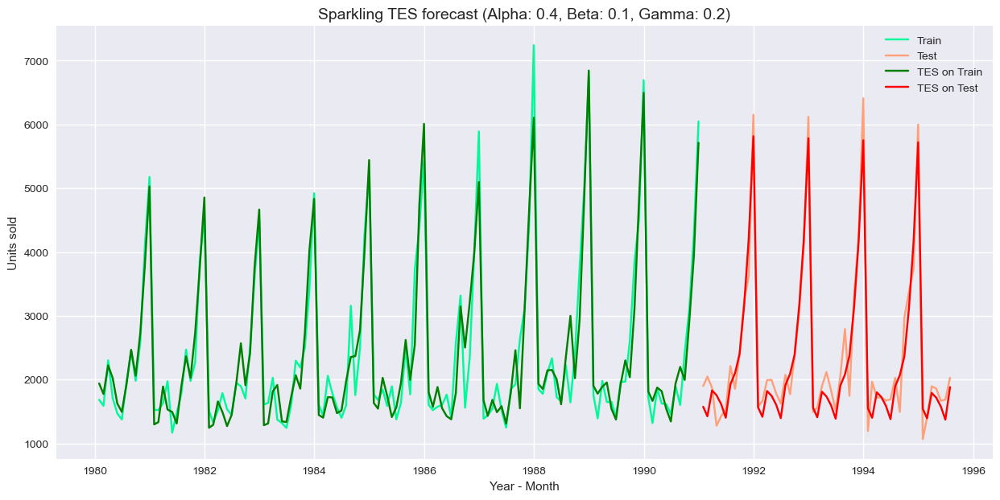

In [206]:
plt.plot(TES_train['Sparkling'], label='Train', color = 'mediumspringgreen')
plt.plot(TES_test['Sparkling'], label='Test', color = 'lightsalmon')

plt.plot(TES_train['predict_spark', 0.4, 0.1, 0.2], color = 'green', label='TES on Train')
plt.plot(TES_test['predict_spark', 0.4, 0.1, 0.2], color='red', label='TES on Test')

plt.xlabel('Year - Month')
plt.ylabel('Units sold')
plt.title('Sparkling TES forecast (Alpha: 0.4, Beta: 0.1, Gamma: 0.2)', fontsize=14)

plt.legend(loc='best');

#### Autofit of TES

In [207]:
model_TES_autofit = model_TES.fit(optimized=True,use_brute=True)

In [208]:
model_TES_autofit.params

{'smoothing_level': 0.11133818361298699,
 'smoothing_trend': 0.049505131019509915,
 'smoothing_seasonal': 0.3620795793580111,
 'damping_trend': nan,
 'initial_level': 2356.4967888704355,
 'initial_trend': -10.187944726007238,
 'initial_seasons': array([0.71296382, 0.68242226, 0.90755008, 0.80515228, 0.65597218,
        0.65414505, 0.88617935, 1.13345121, 0.92046306, 1.21337874,
        1.87340336, 2.37811768]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [209]:
alpha = model_TES_autofit.params['smoothing_level']
beta = model_TES_autofit.params['smoothing_trend']
gamma = model_TES_autofit.params['smoothing_seasonal']
alpha_7_1 = alpha
beta_7_1 = beta
gamma_7_1 = gamma

In [210]:
TES_train['predict_spark',alpha,beta,gamma] = model_TES_autofit.fittedvalues

In [211]:
TES_test['predict_spark',alpha,beta,gamma] = model_TES_autofit.forecast(steps=len(test['Sparkling']))

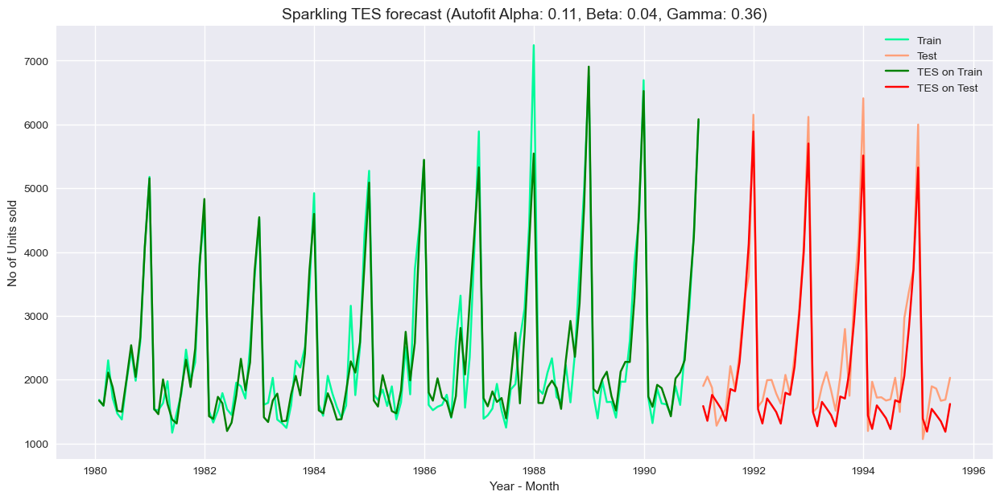

In [212]:
plt.plot(TES_train['Sparkling'], label='Train', color = 'mediumspringgreen')
plt.plot(TES_test['Sparkling'], label='Test', color = 'lightsalmon')

plt.plot(TES_train['predict_spark',alpha,beta,gamma], color = 'green', label='TES on Train')
plt.plot(TES_test['predict_spark',alpha,beta,gamma], color='red', label='TES on Test')

plt.xlabel('Year - Month')
plt.ylabel('No of Units sold')
plt.title('Sparkling TES forecast (Autofit Alpha: 0.11, Beta: 0.04, Gamma: 0.36)', fontsize=14)

plt.legend(loc='best');

In [213]:
rmse_spark_model7_train = metrics.mean_squared_error(TES_train['Sparkling'],TES_train['predict_spark',alpha,beta,gamma],squared=False)
mape_spark_model7_train = MAPE(TES_train['Sparkling'],TES_train['predict_spark',alpha,beta,gamma])
        
rmse_spark_model7_test = metrics.mean_squared_error(TES_test['Sparkling'],TES_test['predict_spark',alpha,beta,gamma],squared=False)
mape_spark_model7_test = MAPE(TES_test['Sparkling'],TES_test['predict_spark',alpha,beta,gamma])
        
resultsDf_7_1 = resultsDf_7_1.append({'Alpha':np.round(alpha,2),'Beta':np.round(beta,2),'Gamma':np.round(gamma,2),'Train RMSE':rmse_spark_model7_train
                                      ,'Train MAPE': mape_spark_model7_train,'Test RMSE':rmse_spark_model7_test
                                      ,'Test MAPE': mape_spark_model7_test}, ignore_index=True)

In [214]:
resultsDf_7_1.tail()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
996,1.00,1.00,0.70,2.660015e+05,1554.57,8.649577e+06,188660.61
997,1.00,1.00,0.80,1.101923e+06,7348.46,2.700435e+05,5645.84
998,1.00,1.00,0.90,7.695708e+04,1220.71,2.472201e+05,6434.67
999,1.00,1.00,1.00,2.456050e+04,467.65,1.256914e+05,2789.45
1000,0.11,0.05,0.36,3.557668e+02,10.19,4.042868e+02,13.93


In [215]:
resultsDf_7_1.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
211,0.3,0.2,0.2,377.777799,11.26,314.906684,10.10
301,0.4,0.1,0.2,374.619861,11.24,315.935531,10.45
300,0.4,0.1,0.1,370.612639,11.03,318.103496,10.01
402,0.5,0.1,0.3,390.175608,11.54,325.544937,9.99
30,0.1,0.4,0.1,400.768319,11.48,331.257015,10.54


In [216]:
resultsDf_7_1.sort_values(by=['Test MAPE']).head()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
137,0.2,0.4,0.8,469.644813,13.45,336.712085,9.98
402,0.5,0.1,0.3,390.175608,11.54,325.544937,9.99
300,0.4,0.1,0.1,370.612639,11.03,318.103496,10.01
211,0.3,0.2,0.2,377.777799,11.26,314.906684,10.10
301,0.4,0.1,0.2,374.619861,11.24,315.935531,10.45


#### Rose Wine

In [217]:
model_TES_2 = ExponentialSmoothing(TES_train['Rose'],trend='additive',seasonal='multiplicative',freq='M')

In [218]:
resultsDf_7_2 = pd.DataFrame({'Alpha':[],'Beta':[],'Gamma':[],'Train RMSE':[],'Train MAPE':[]
                                ,'Test RMSE': [],'Test MAPE': []})

In [219]:
for i in np.arange(0.1,1.1,0.1):
    for j in np.arange(0.1,1.1,0.1):
        for k in np.arange(0.1,1.1,0.1):
            model_TES_alpha_i_j_k = model_TES_2.fit(smoothing_level=i,smoothing_trend=j,smoothing_seasonal=k,optimized=True,use_brute=True)
            TES_train['predict_rose',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
            TES_test['predict_rose',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=len(test['Rose']))
        
            rmse_rose_model7_train = metrics.mean_squared_error(TES_train['Rose'],TES_train['predict_rose',i,j,k],squared=False)
            mape_rose_model7_train = MAPE(TES_train['Rose'],TES_train['predict_rose',i,j,k])
        
            rmse_rose_model7_test = metrics.mean_squared_error(TES_test['Rose'],TES_test['predict_rose',i,j,k],squared=False)
            mape_rose_model7_test = MAPE(TES_test['Rose'],TES_test['predict_rose',i,j,k])
        
            resultsDf_7_2 = resultsDf_7_2.append({'Alpha':i,'Beta':j,'Gamma':k,'Train RMSE':rmse_rose_model7_train
                                      ,'Train MAPE': mape_rose_model7_train,'Test RMSE':rmse_rose_model7_test
                                      ,'Test MAPE': mape_rose_model7_test}, ignore_index=True)

In [220]:
resultsDf_7_2.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
10,0.1,0.2,0.1,19.651464,14.31,9.171615,13.19
11,0.1,0.2,0.2,20.140683,14.66,9.493835,13.68
151,0.2,0.6,0.2,22.793871,17.02,9.682585,13.71
142,0.2,0.5,0.3,23.300524,17.35,9.885717,14.21
12,0.1,0.2,0.3,20.725703,14.88,9.896169,14.16


In [221]:
resultsDf_7_2.sort_values(by=['Test MAPE']).head()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
10,0.1,0.2,0.1,19.651464,14.31,9.171615,13.19
243,0.3,0.5,0.4,25.873405,17.54,10.375309,13.26
223,0.3,0.3,0.4,24.209084,16.78,10.169698,13.67
11,0.1,0.2,0.2,20.140683,14.66,9.493835,13.68
151,0.2,0.6,0.2,22.793871,17.02,9.682585,13.71


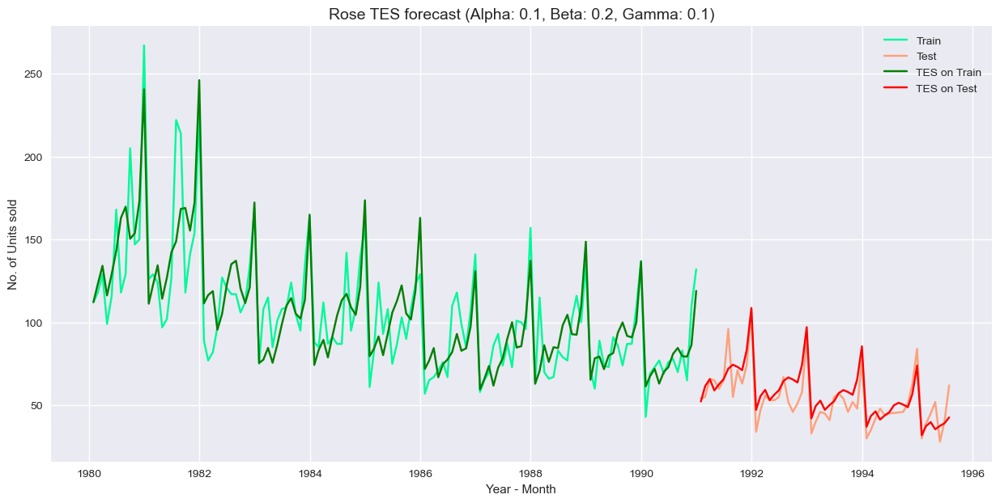

In [222]:
plt.plot(TES_train['Rose'], label='Train', color = 'mediumspringgreen')
plt.plot(TES_test['Rose'], label='Test', color = 'lightsalmon')

plt.plot(TES_train['predict_rose', 0.1, 0.2, 0.1], color = 'green', label='TES on Train')
plt.plot(TES_test['predict_rose', 0.1, 0.2, 0.1], color='red', label='TES on Test')

plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Rose TES forecast (Alpha: 0.1, Beta: 0.2, Gamma: 0.1)', fontsize=14)

plt.legend(loc='best');

#### Attempting autofit

In [223]:
model_TES_autofit = model_TES_2.fit(optimized=True,use_brute=True)

In [224]:
model_TES_autofit.params

{'smoothing_level': 0.0715106306609405,
 'smoothing_trend': 0.04529179757535142,
 'smoothing_seasonal': 7.244325029450242e-05,
 'damping_trend': nan,
 'initial_level': 130.40839142502193,
 'initial_trend': -0.77985743179386,
 'initial_seasons': array([0.86218996, 0.977675  , 1.0687727 , 0.93403881, 1.050625  ,
        1.14410977, 1.25836944, 1.33937772, 1.26778766, 1.24131254,
        1.44724625, 1.99553681]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [225]:
alpha = model_TES_autofit.params['smoothing_level']
beta = model_TES_autofit.params['smoothing_trend']
gamma = model_TES_autofit.params['smoothing_seasonal']
alpha_7_2 = alpha
beta_7_2 = beta
gamma_7_2 = gamma

In [226]:
TES_train['predict_rose',alpha,beta,gamma] = model_TES_autofit.fittedvalues

TES_test['predict_rose',alpha,beta,gamma] = model_TES_autofit.forecast(steps=len(test['Rose']))

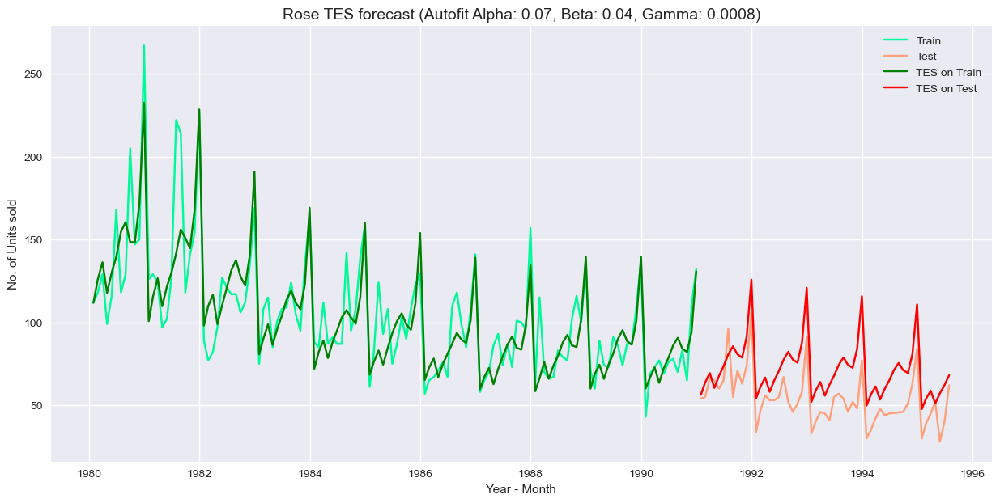

In [227]:
plt.plot(TES_train['Rose'], label='Train', color = 'mediumspringgreen')
plt.plot(TES_test['Rose'], label='Test', color = 'lightsalmon')

plt.plot(TES_train['predict_rose',alpha,beta,gamma], color = 'green', label='TES on Train')
plt.plot(TES_test['predict_rose',alpha,beta,gamma], color='red', label='TES on Test')

plt.xlabel('Year - Month')
plt.ylabel('No. of Units sold')
plt.title('Rose TES forecast (Autofit Alpha: 0.07, Beta: 0.04, Gamma: 0.0008)', fontsize=14)

plt.legend(loc='best');

In [228]:
rmse_rose_model7_train = metrics.mean_squared_error(TES_train['Rose'],TES_train['predict_rose',alpha,beta,gamma],squared=False)
mape_rose_model7_train = MAPE(TES_train['Rose'],TES_train['predict_rose',alpha,beta,gamma])
        
rmse_rose_model7_test = metrics.mean_squared_error(TES_test['Rose'],TES_test['predict_rose',alpha,beta,gamma],squared=False)
mape_rose_model7_test = MAPE(TES_test['Rose'],TES_test['predict_rose',alpha,beta,gamma])
        
resultsDf_7_2 = resultsDf_7_2.append({'Alpha':alpha,'Beta':beta,'Gamma':gamma,'Train RMSE':rmse_rose_model7_train
                                      ,'Train MAPE': mape_rose_model7_train,'Test RMSE':rmse_rose_model7_test
                                      ,'Test MAPE': mape_rose_model7_test}, ignore_index=True)

In [229]:
resultsDf_7_2.tail()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
996,1.000000,1.000000,0.700000,3091.001599,890.00,9721.144050,13046.06
997,1.000000,1.000000,0.800000,2438.212926,628.69,2573.842682,1998.89
998,1.000000,1.000000,0.900000,28835.801098,3026.25,3522.899085,2624.26
999,1.000000,1.000000,1.000000,1577.905281,583.77,3104.659378,3720.26
1000,0.071511,0.045292,0.000072,18.406337,12.58,20.156483,33.63


In [230]:
resultsDf_7_2.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
10,0.1,0.2,0.1,19.651464,14.31,9.171615,13.19
11,0.1,0.2,0.2,20.140683,14.66,9.493835,13.68
151,0.2,0.6,0.2,22.793871,17.02,9.682585,13.71
142,0.2,0.5,0.3,23.300524,17.35,9.885717,14.21
12,0.1,0.2,0.3,20.725703,14.88,9.896169,14.16


In [231]:
resultsDf_7_2.sort_values(by=['Test MAPE']).head()

,Alpha,Beta,Gamma,Train RMSE,Train MAPE,Test RMSE,Test MAPE
10,0.1,0.2,0.1,19.651464,14.31,9.171615,13.19
243,0.3,0.5,0.4,25.873405,17.54,10.375309,13.26
223,0.3,0.3,0.4,24.209084,16.78,10.169698,13.67
11,0.1,0.2,0.2,20.140683,14.66,9.493835,13.68
151,0.2,0.6,0.2,22.793871,17.02,9.682585,13.71


#### Model Evaluation

In [232]:
resultsDf_7_sp = pd.DataFrame({'Test RMSE': [resultsDf_7_1['Test RMSE'][301],resultsDf_7_1['Test RMSE'][1000]],
                              'Test MAPE': [resultsDf_7_1['Test MAPE'][301],resultsDf_7_1['Test MAPE'][1000]]}
                           ,index=['TES Alpha 0.4, Beta 0.1, Gamma 0.2','TES Alpha 0.11, Beta 0.04, Gamma 0.036'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_7_sp])
spark_resultsDf

,Test RMSE,Test MAPE
Regression On Time,1389.135175,50.15
NaiveModel,3864.279352,152.87
SimpleAverage,1275.081804,38.90
2 point TMA,813.400684,19.70
4 point TMA,1156.589694,35.96
6 point TMA,1283.927428,43.86
9 point TMA,1346.278315,46.86
SES Alpha 0.00,1316.035487,45.47
"DES Alpha 0.1,Beta 0.1",1779.420000,67.23
"DES Alpha 0.6,Beta 0.0",2007.238526,68.23


In [233]:
spark_resultsDf.sort_values(by=['Test RMSE'])

,Test RMSE,Test MAPE
"TES Alpha 0.4, Beta 0.1, Gamma 0.2",315.935531,10.45
"TES Alpha 0.11, Beta 0.04, Gamma 0.036",404.286809,13.93
2 point TMA,813.400684,19.70
4 point TMA,1156.589694,35.96
SimpleAverage,1275.081804,38.90
6 point TMA,1283.927428,43.86
SES Alpha 0.00,1316.035487,45.47
9 point TMA,1346.278315,46.86
Regression On Time,1389.135175,50.15
"DES Alpha 0.1,Beta 0.1",1779.420000,67.23


In [234]:
resultsDf_7_ro = pd.DataFrame({'Test RMSE': [resultsDf_7_2['Test RMSE'][11],resultsDf_7_2['Test RMSE'][1000]],
                              'Test MAPE': [resultsDf_7_2['Test MAPE'][11],resultsDf_7_2['Test MAPE'][1000]]}
                           ,index=['TES Alpha 0.1, Beta 0.2, Gamma 0.1','TES Alpha 0.07, Beta 0.04, Gamma 0.0008'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_7_ro])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82
NaiveModel,79.718559,145.10
SimpleAverage,53.460350,94.93
2 point TMA,11.529278,13.54
4 point TMA,14.451364,19.49
6 point TMA,14.566269,20.82
9 point TMA,14.727594,21.01
SES Alpha 0.01,36.796004,63.88
"DES Alpha 0.017, Beta 3.23",15.706968,24.12
"DES Alpha 0.10, Beta 0.10",37.056911,64.02


In [235]:
rose_resultsDf.sort_values(by=['Test RMSE'])

,Test RMSE,Test MAPE
"TES Alpha 0.1, Beta 0.2, Gamma 0.1",9.493835,13.68
2 point TMA,11.529278,13.54
4 point TMA,14.451364,19.49
6 point TMA,14.566269,20.82
9 point TMA,14.727594,21.01
Regression On Time,15.268885,22.82
"DES Alpha 0.017, Beta 3.23",15.706968,24.12
"TES Alpha 0.07, Beta 0.04, Gamma 0.0008",20.156483,33.63
SES Alpha 0.01,36.796004,63.88
"DES Alpha 0.10, Beta 0.10",37.056911,64.02


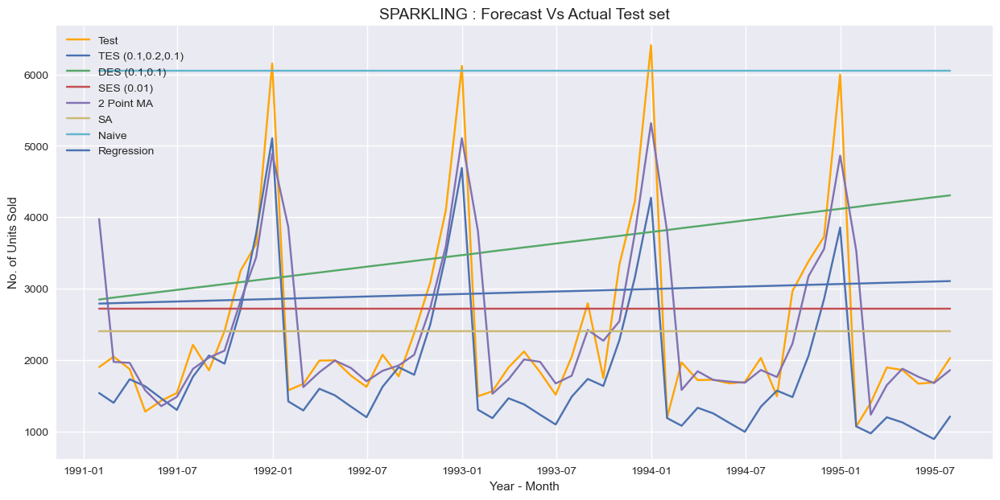

In [236]:
plt.plot(TES_test['Sparkling'], label='Test', color = 'orange')
#TES
plt.plot(TES_test['predict_spark',0.1,0.2,0.1],  label='TES (0.1,0.2,0.1)')
#DES
plt.plot(DES_test['predict_spark',0.1,0.1],  label='DES (0.1,0.1)')
#SES
plt.plot(SES_test['predict_spark'],  label='SES (0.01)')
#MA
plt.plot(trailing_MovingAverage_test['Spark_Trailing_2'],  label='2 Point MA')
#SA
plt.plot(SimpleAverage_test['spark_mean_forecast'], label='SA')
#Naive
plt.plot(NaiveModel_test['spark_naive'], label='Naive')
#Regression
plt.plot(LinearRegression_test['RegOnTime_spark'], label='Regression')

plt.legend(loc='upper left')
plt.xlabel('Year - Month')
plt.ylabel('No. of Units Sold')
plt.title('SPARKLING : Forecast Vs Actual Test set', fontsize=14);

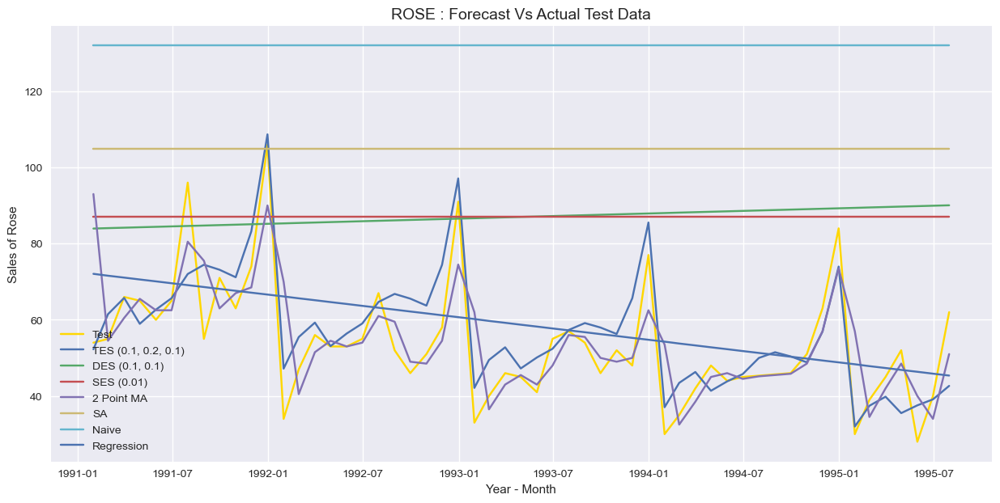

In [237]:
plt.plot(TES_test['Rose'], label='Test', color = 'gold')
#TES
plt.plot(TES_test['predict_rose',0.1,0.2,0.1],  label='TES (0.1, 0.2, 0.1)')
#DES
plt.plot(DES_test['predict_rose',0.1,0.1],  label='DES (0.1, 0.1)')
#SES
plt.plot(SES_test['predict_rose'],  label='SES (0.01)')
#MA
plt.plot(trailing_MovingAverage_test['Rose_Trailing_2'],  label='2 Point MA')
#SA
plt.plot(SimpleAverage_test['rose_mean_forecast'], label='SA')
#Naive
plt.plot(NaiveModel_test['rose_naive'], label='Naive')
#Regression
plt.plot(LinearRegression_test['RegOnTime_rose'], label='Regression')

plt.legend(loc='best')
plt.xlabel('Year - Month')
plt.ylabel('Sales of Rose')
plt.title('ROSE : Forecast Vs Actual Test Data', fontsize=14);

### Q5. Check for the stationarity of the data on which the model is being built on using appropriate statistical tests and also mention the hypothesis for the statistical test. If the data is found to be non-stationary, take appropriate steps to make it stationary. Check the new data for stationarity and comment. Note: Stationarity should be checked at alpha = 0.05.

### Check Stationarity of ROSE Data
#### The Augmented Dickey-Fuller test is an unit root test which determines whether there is a unit root and subsequently whether the series is non-stationary.The hypothesis in a simple form for the ADF test is:

#### Ho : The Time Series has a unit root and is thus non-stationary.
#### H1 : The Time Series does not have a unit root and is thus stationary.
#### We would want the series to be stationary for building ARIMA models and thus we would want the p-value of this test to be less than the alpha  value.

In [238]:
from statsmodels.tsa.stattools import adfuller

In [239]:
dfrs = adfuller(df['Rose'],regression='ct')
print('DF test statistic is %3.3f' %dfrs[0])
print('DF test p-value is' ,dfrs[1])
print('Number of lags used' ,dfrs[2])

DF test statistic is -2.240
DF test p-value is 0.46713926900201064
Number of lags used 13


In [240]:
dfrs = adfuller(df['Rose'].diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dfrs[0])
print('DF test p-value is' ,dfrs[1])
print('Number of lags used' ,dfrs[2])

DF test statistic is -8.162
DF test p-value is 3.015846877306047e-11
Number of lags used 12


#### We see that p-value < alpha=0.05 Hence, we reject the Null Hypothesis
#### We conclude that with a lag 1 - now the Rose data is Stationary
#### Now, let us go ahead and plot the stationary series.

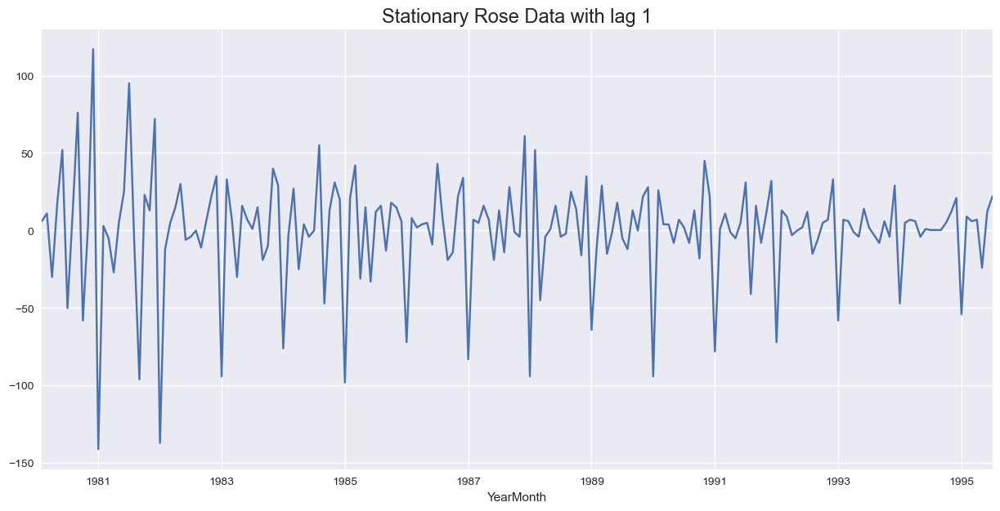

In [241]:
df['Rose'].diff().dropna().plot(grid=True);
plt.title('Stationary Rose Data with lag 1', fontsize=17);

#### Check Stationarity of SPARKLING Data
#### The Augmented Dickey-Fuller test is an unit root test which determines whether there is a unit root and subsequently whether the series is non-stationary.

#### The hypothesis in a simple form for the ADF test is:

#### Ho : The Time Series has a unit root and is thus non-stationary.
#### H1 : The Time Series does not have a unit root and is thus stationary.
#### We would want the series to be stationary for building ARIMA models and thus we would want the p-value of this test to be less than the alpha value.

In [242]:
dfss = adfuller(df['Sparkling'],regression='ct')
print('DF test statistic is %3.3f' %dfss[0])
print('DF test p-value is' ,dfss[1])
print('Number of lags used' ,dfss[2])

DF test statistic is -1.798
DF test p-value is 0.7055958459932417
Number of lags used 12


In [243]:
dfss = adfuller(df['Sparkling'].diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dfss[0])
print('DF test p-value is' ,dfss[1])
print('Number of lags used' ,dfss[2])

DF test statistic is -44.912
DF test p-value is 0.0
Number of lags used 10


#### We see that p-value < alpha=0.05 Hence, we reject the Null Hypothesis

#### We conclude that with a lag 1 - now the Sparkling data is Stationary

#### Now, let us go ahead and plot the stationary series.

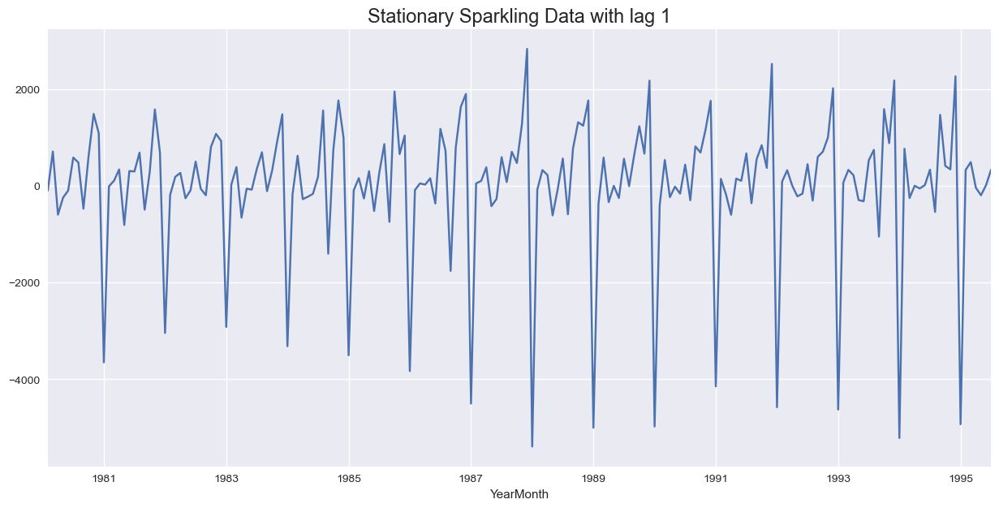

In [244]:
df['Sparkling'].diff().dropna().plot(grid=True);
plt.title('Stationary Sparkling Data with lag 1', fontsize=17);

### Q6. Build an automated version of the ARIMA/SARIMA model in which the parameters are selected using the lowest Akaike Information Criteria (AIC) on the training data and evaluate this model on the test data using RMSE.

#### 1) Sparkling (ARIMA)

In [245]:
ARIMA_train = train.copy()
ARIMA_test = test.copy()

In [246]:
import itertools
p = q = range(0, 4)
d= range(1,2)
pdq = list(itertools.product(p, d, q))
print('Examples of the parameter combinations for the Model')

Examples of the parameter combinations for the Model


In [247]:
for i in range(0,len(pdq)):
    print('Model: {}'.format(pdq[i]))
# Creating an empty Dataframe with column names only
SPARKLING_ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
SPARKLING_ARIMA_AIC

Model: (0, 1, 0)
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (0, 1, 3)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (1, 1, 3)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)
Model: (2, 1, 3)
Model: (3, 1, 0)
Model: (3, 1, 1)
Model: (3, 1, 2)
Model: (3, 1, 3)


,param,AIC


In [248]:
from statsmodels.tsa.arima.model import ARIMA

for param in pdq:# running a loop within the pdq parameters defined by itertools
    ARIMA_model = ARIMA(ARIMA_train['Sparkling'].values,order=param).fit()#fitting the ARIMA model
    #using the parameters from the loop
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_model.aic))#printing the parameters and the AIC
    #from the fitted models
    SPARKLING_ARIMA_AIC = SPARKLING_ARIMA_AIC.append({'param':param, 'AIC': ARIMA_model.aic}, ignore_index=True)

ARIMA(0, 1, 0) - AIC:2267.6630357855465
ARIMA(0, 1, 1) - AIC:2263.060015591336
ARIMA(0, 1, 2) - AIC:2234.408323131676
ARIMA(0, 1, 3) - AIC:2233.9948577793975
ARIMA(1, 1, 0) - AIC:2266.6085393190087
ARIMA(1, 1, 1) - AIC:2235.755094673378
ARIMA(1, 1, 2) - AIC:2234.5272004508324
ARIMA(1, 1, 3) - AIC:2235.6078073353247
ARIMA(2, 1, 0) - AIC:2260.365743968086
ARIMA(2, 1, 1) - AIC:2233.7776263084434
ARIMA(2, 1, 2) - AIC:2213.5092122972337
ARIMA(2, 1, 3) - AIC:2232.9347720936876
ARIMA(3, 1, 0) - AIC:2257.72337899794
ARIMA(3, 1, 1) - AIC:2235.498925478373
ARIMA(3, 1, 2) - AIC:2230.7834294952218
ARIMA(3, 1, 3) - AIC:2221.458953312183


In [249]:
SPARKLING_ARIMA_AIC.sort_values(by='AIC',ascending=True).head()
auto_ARIMA = ARIMA(ARIMA_train['Sparkling'], order=(2,1,2))

In [250]:
results_auto_ARIMA = auto_ARIMA.fit()
print(results_auto_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:              Sparkling   No. Observations:                  132
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -1101.755
Date:                Sun, 05 Mar 2023   AIC                           2213.509
Time:                        21:38:50   BIC                           2227.885
Sample:                    01-31-1980   HQIC                          2219.351
                         - 12-31-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3121      0.046     28.781      0.000       1.223       1.401
ar.L2         -0.5593      0.072     -7.741      0.000      -0.701      -0.418
ma.L1         -1.9917      0.109    -18.218      0.0

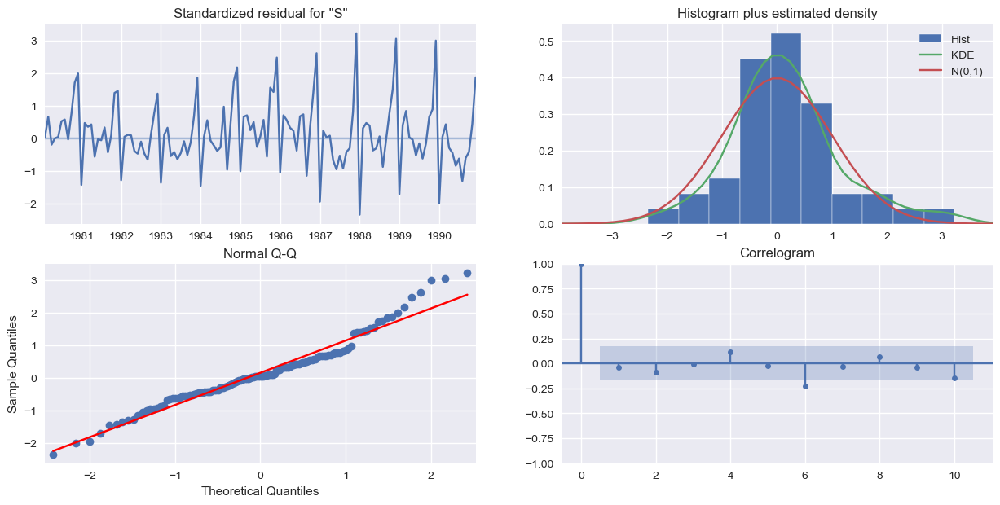

In [251]:
results_auto_ARIMA.plot_diagnostics();

In [252]:
predicted_auto_ARIMA = results_auto_ARIMA.forecast(steps=len(ARIMA_test))
predicted_auto_ARIMA
rmse_spark = metrics.mean_squared_error(ARIMA_test['Sparkling'],predicted_auto_ARIMA,squared=False)
mape_spark = MAPE(ARIMA_test['Sparkling'],predicted_auto_ARIMA)
print('Test RMSE Sparkling:',rmse_spark,'\nTest MAPE Sparkling:',mape_spark)

Test RMSE Sparkling: 1299.9796651035053 
Test MAPE Sparkling: 43.2


In [253]:
spark_arima_resultsDf = pd.DataFrame({'Test RMSE': [rmse_spark],'Test MAPE': [mape_spark]},index=['Sparkling Auto Arima'])
spark_arima_resultsDf

,Test RMSE,Test MAPE
Sparkling Auto Arima,1299.979665,43.2


#### 1) Rose (ARIMA)

In [254]:
ARIMA_train = train.copy()
ARIMA_test = test.copy()

In [255]:
import itertools
p = q = range(0, 4)
d= range(1,2)
pdq = list(itertools.product(p, d, q))
print('Examples of the parameter combinations for the Model')

Examples of the parameter combinations for the Model


In [256]:
for i in range(0,len(pdq)):
    print('Model: {}'.format(pdq[i]))
# Creating an empty Dataframe with column names only
ROSE_ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
ROSE_ARIMA_AIC

Model: (0, 1, 0)
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (0, 1, 3)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (1, 1, 3)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)
Model: (2, 1, 3)
Model: (3, 1, 0)
Model: (3, 1, 1)
Model: (3, 1, 2)
Model: (3, 1, 3)


,param,AIC


In [257]:
from statsmodels.tsa.arima.model import ARIMA

for param in pdq:# running a loop within the pdq parameters defined by itertools
    ARIMA_model = ARIMA(ARIMA_train['Rose'].values,order=param).fit()#fitting the ARIMA model
    #using the parameters from the loop
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_model.aic))#printing the parameters and the AIC
    #from the fitted models
    ROSE_ARIMA_AIC = ROSE_ARIMA_AIC.append({'param':param, 'AIC': ARIMA_model.aic}, ignore_index=True)

ARIMA(0, 1, 0) - AIC:1333.1546729124348
ARIMA(0, 1, 1) - AIC:1282.3098319748312
ARIMA(0, 1, 2) - AIC:1279.6715288535806
ARIMA(0, 1, 3) - AIC:1280.5453761734655
ARIMA(1, 1, 0) - AIC:1317.3503105381492
ARIMA(1, 1, 1) - AIC:1280.5742295380064
ARIMA(1, 1, 2) - AIC:1279.8707234231915
ARIMA(1, 1, 3) - AIC:1281.8707223309993
ARIMA(2, 1, 0) - AIC:1298.611034160493
ARIMA(2, 1, 1) - AIC:1281.5078621868513
ARIMA(2, 1, 2) - AIC:1281.8707222264356
ARIMA(2, 1, 3) - AIC:1274.6954123405285
ARIMA(3, 1, 0) - AIC:1297.4810917271739
ARIMA(3, 1, 1) - AIC:1282.4192776271939
ARIMA(3, 1, 2) - AIC:1283.720740597716
ARIMA(3, 1, 3) - AIC:1278.6679167115944


In [258]:
ROSE_ARIMA_AIC.sort_values(by='AIC',ascending=True).head()
auto_ARIMA = ARIMA(ARIMA_train['Rose'], order=(2,1,3))

In [259]:
results_auto_ARIMA = auto_ARIMA.fit()
print(results_auto_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:                   Rose   No. Observations:                  132
Model:                 ARIMA(2, 1, 3)   Log Likelihood                -631.348
Date:                Sun, 05 Mar 2023   AIC                           1274.695
Time:                        21:38:57   BIC                           1291.947
Sample:                    01-31-1980   HQIC                          1281.705
                         - 12-31-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.6783      0.084    -19.999      0.000      -1.843      -1.514
ar.L2         -0.7291      0.084     -8.687      0.000      -0.894      -0.565
ma.L1          1.0446      0.618      1.691      0.0

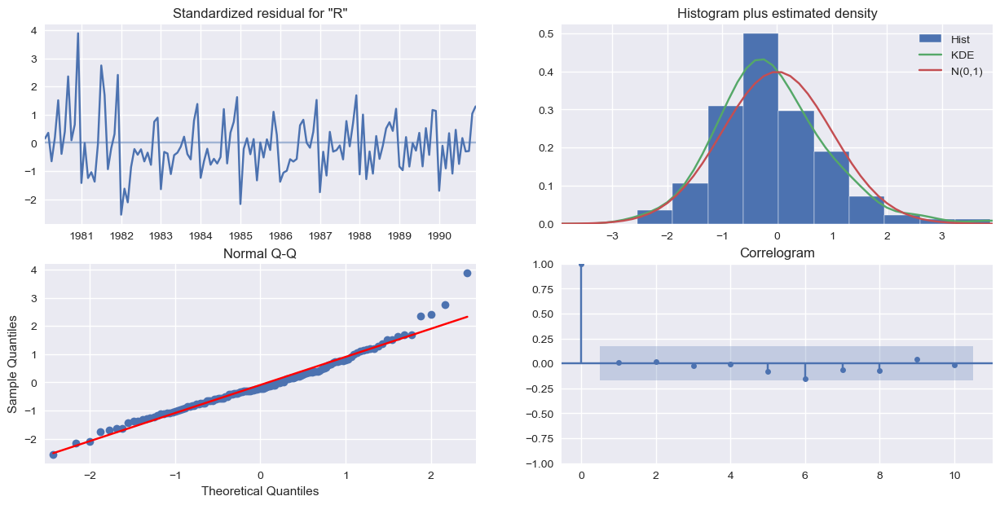

In [260]:
results_auto_ARIMA.plot_diagnostics();

In [261]:
predicted_auto_ARIMA = results_auto_ARIMA.forecast(steps=len(ARIMA_test))
predicted_auto_ARIMA
rmse_rose = metrics.mean_squared_error(ARIMA_test['Rose'],predicted_auto_ARIMA,squared=False)
mape_rose = MAPE(ARIMA_test['Rose'],predicted_auto_ARIMA)
print('Test RMSE Rose:',rmse_rose,'\nTest MAPE Rose:',mape_rose)

Test RMSE Rose: 36.8127616402961 
Test MAPE Rose: 63.89


In [262]:
rose_arima_resultsDf = pd.DataFrame({'Test RMSE': [rmse_rose],'Test MAPE': [mape_rose]},index=['Rose Auto Arima'])
rose_arima_resultsDf

,Test RMSE,Test MAPE
Rose Auto Arima,36.812762,63.89


#### 3) SPARKLING (SARIMA)

In [263]:
SARIMA_train = train.copy()
SARIMA_test = test.copy()

In [264]:
import itertools
p = q = range(0,4)
d= range(1,2)
D = range(1,2)
pdq = list(itertools.product(p, d, q))
model_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of some parameter combinations for Model...')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], model_pdq[i]))

Examples of some parameter combinations for Model...
Model: (0, 1, 1)(0, 1, 1, 12)
Model: (0, 1, 2)(0, 1, 2, 12)
Model: (0, 1, 3)(0, 1, 3, 12)
Model: (1, 1, 0)(1, 1, 0, 12)
Model: (1, 1, 1)(1, 1, 1, 12)
Model: (1, 1, 2)(1, 1, 2, 12)
Model: (1, 1, 3)(1, 1, 3, 12)
Model: (2, 1, 0)(2, 1, 0, 12)
Model: (2, 1, 1)(2, 1, 1, 12)
Model: (2, 1, 2)(2, 1, 2, 12)
Model: (2, 1, 3)(2, 1, 3, 12)
Model: (3, 1, 0)(3, 1, 0, 12)
Model: (3, 1, 1)(3, 1, 1, 12)
Model: (3, 1, 2)(3, 1, 2, 12)
Model: (3, 1, 3)(3, 1, 3, 12)


In [265]:
SARIMA_AIC_spark = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC_spark

,param,seasonal,AIC


In [266]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_model_spark = sm.tsa.statespace.SARIMAX(SARIMA_train['Sparkling'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_SARIMA_spark = SARIMA_model_spark.fit(maxiter=1000)
        print('SARIMA{}x{}7 - AIC:{}'.format(param, param_seasonal, results_SARIMA_spark.aic))
        SARIMA_AIC_spark = SARIMA_AIC_spark.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA_spark.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 1, 0, 12)7 - AIC:1822.9824851895298
SARIMA(0, 1, 0)x(0, 1, 1, 12)7 - AIC:1626.8626334678963
SARIMA(0, 1, 0)x(0, 1, 2, 12)7 - AIC:1452.677357426081
SARIMA(0, 1, 0)x(0, 1, 3, 12)7 - AIC:2514.5850892167837
SARIMA(0, 1, 0)x(1, 1, 0, 12)7 - AIC:1646.377816766144
SARIMA(0, 1, 0)x(1, 1, 1, 12)7 - AIC:1628.324390819106
SARIMA(0, 1, 0)x(1, 1, 2, 12)7 - AIC:1454.5289621306945
SARIMA(0, 1, 0)x(1, 1, 3, 12)7 - AIC:3405.4839823270036
SARIMA(0, 1, 0)x(2, 1, 0, 12)7 - AIC:1466.6211360755017
SARIMA(0, 1, 0)x(2, 1, 1, 12)7 - AIC:1468.500098186662
SARIMA(0, 1, 0)x(2, 1, 2, 12)7 - AIC:1455.9911553654035
SARIMA(0, 1, 0)x(2, 1, 3, 12)7 - AIC:3266.351803766712
SARIMA(0, 1, 0)x(3, 1, 0, 12)7 - AIC:1289.2398197439918
SARIMA(0, 1, 0)x(3, 1, 1, 12)7 - AIC:1291.2448875094105
SARIMA(0, 1, 0)x(3, 1, 2, 12)7 - AIC:1288.6070380230383
SARIMA(0, 1, 0)x(3, 1, 3, 12)7 - AIC:3462.0769927232586
SARIMA(0, 1, 1)x(0, 1, 0, 12)7 - AIC:1760.6565719828557
SARIMA(0, 1, 1)x(0, 1, 1, 12)7 - AIC:1569.66392342300

In [267]:
SARIMA_AIC_spark.sort_values(by=['AIC']).head(20)

,param,seasonal,AIC
179,"(2, 1, 3)","(0, 1, 3, 12)",18.000000
187,"(2, 1, 3)","(2, 1, 3, 12)",22.000000
183,"(2, 1, 3)","(1, 1, 3, 12)",905.599591
123,"(1, 1, 3)","(2, 1, 3, 12)",949.022901
252,"(3, 1, 3)","(3, 1, 0, 12)",1213.282564
253,"(3, 1, 3)","(3, 1, 1, 12)",1215.213401
220,"(3, 1, 1)","(3, 1, 0, 12)",1215.898777
254,"(3, 1, 3)","(3, 1, 2, 12)",1216.479985
236,"(3, 1, 2)","(3, 1, 0, 12)",1216.859180
221,"(3, 1, 1)","(3, 1, 1, 12)",1217.713895


In [268]:
SARIMA_AIC_spark.sort_values(by=['AIC']).tail()

,param,seasonal,AIC
31,"(0, 1, 1)","(3, 1, 3, 12)",3679.075915
127,"(1, 1, 3)","(3, 1, 3, 12)",3693.486971
75,"(1, 1, 0)","(2, 1, 3, 12)",4006.922921
115,"(1, 1, 3)","(0, 1, 3, 12)",5215.730778
191,"(2, 1, 3)","(3, 1, 3, 12)",6232.655037


In [269]:
auto_SARIMA_spark = sm.tsa.statespace.SARIMAX(SARIMA_train['Sparkling'].values,
                                order=(3, 1, 3),
                                seasonal_order=(3, 1, 0, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_spark = auto_SARIMA_spark.fit(maxiter=1000)
print(results_auto_SARIMA_spark.summary())

                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                  132
Model:             SARIMAX(3, 1, 3)x(3, 1, [], 12)   Log Likelihood                -596.641
Date:                             Sun, 05 Mar 2023   AIC                           1213.283
Time:                                     21:53:18   BIC                           1237.103
Sample:                                          0   HQIC                          1222.833
                                             - 132                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.6138      0.176     -9.174      0.000      -1.959      -1.269
ar.L2         -0.6116      

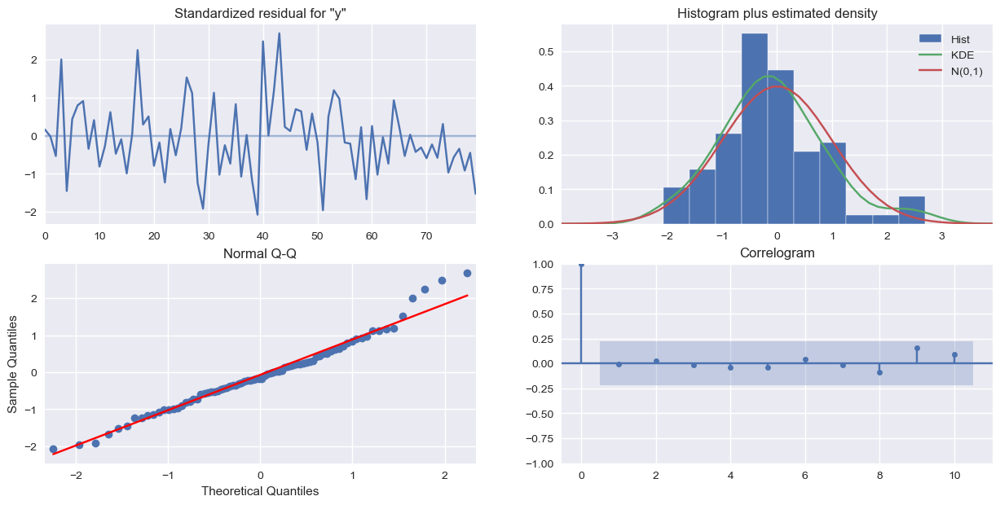

In [270]:
results_auto_SARIMA_spark.plot_diagnostics()
plt.show();

In [271]:
SARIMA_test.head()

,Sparkling,Rose
YearMonth,,
1991-01-31,1902,54.0
1991-02-28,2049,55.0
1991-03-31,1874,66.0
1991-04-30,1279,65.0
1991-05-31,1432,60.0


In [272]:
pred_dynamic = results_auto_SARIMA_spark.get_prediction(dynamic=True, full_results=True)

In [273]:
pred_dynamic_ci = pred_dynamic.conf_int()
predicted_auto_SARIMA_spark = results_auto_SARIMA_spark.get_forecast(steps=len(SARIMA_test['Sparkling']), alpha=0.05)

In [274]:
predicted_auto_SARIMA_spark.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,1430.334371,431.199546,585.198792,2275.469951
1,1540.190467,458.422144,641.699576,2438.681359
2,1707.264337,460.187094,805.314207,2609.214468
3,1858.730495,466.755947,943.905649,2773.555340
4,1501.443936,467.055647,586.031688,2416.856184


In [275]:
spark_forecasted = pred_dynamic.predicted_mean
SARIMA_test['spark_forecasted'] = predicted_auto_SARIMA_spark.predicted_mean
SARIMA_test.head()

,Sparkling,Rose,spark_forecasted
YearMonth,,,
1991-01-31,1902,54.0,1430.334371
1991-02-28,2049,55.0,1540.190467
1991-03-31,1874,66.0,1707.264337
1991-04-30,1279,65.0,1858.730495
1991-05-31,1432,60.0,1501.443936


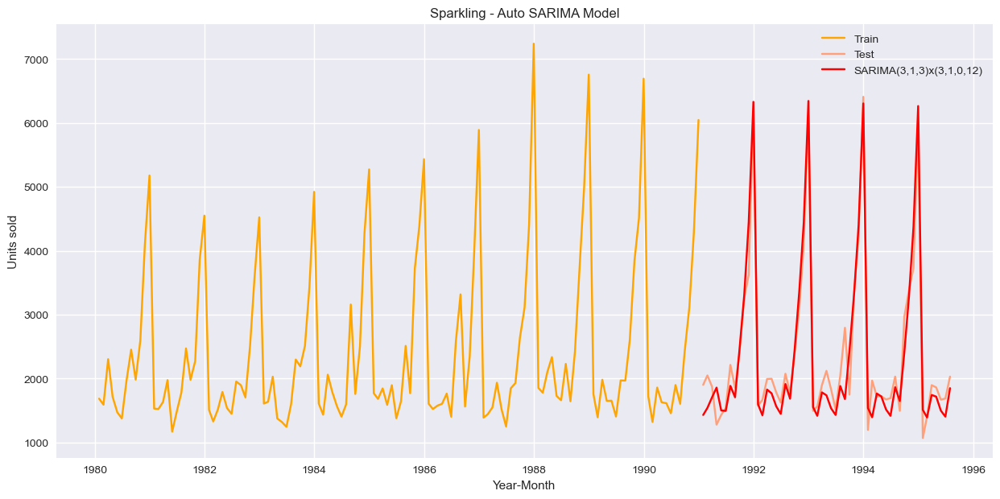

In [276]:
plt.plot(train['Sparkling'], label='Train', color = 'orange')
plt.plot(test['Sparkling'], label='Test', color = 'lightsalmon')

plt.plot(SARIMA_test['spark_forecasted'], color='red', label='SARIMA(3,1,3)x(3,1,0,12)')
plt.xlabel('Year-Month')
plt.ylabel('Units sold')
plt.title('Sparkling - Auto SARIMA Model')
plt.legend(loc='best');

In [277]:
rmse_spark_model8_test = metrics.mean_squared_error(test['Sparkling'],SARIMA_test['spark_forecasted'],squared=False)
mape_spark_model8_test = MAPE(test['Sparkling'],SARIMA_test['spark_forecasted'])
print("For SARIMA forecast on the Sparkling Wine Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model8_test, mape_spark_model8_test))

For SARIMA forecast on the Sparkling Wine Testing Data:  RMSE is 331.717 and MAPE is 10.34


In [278]:
resultsDf_8_spark1 = pd.DataFrame({'Test RMSE': [rmse_spark_model8_test],'Test MAPE': [mape_spark_model8_test]},index=['Auto SARIMA(3,1,3)x(3,1,0,12)'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_8_spark1])
spark_resultsDf

,Test RMSE,Test MAPE
Regression On Time,1389.135175,50.15
NaiveModel,3864.279352,152.87
SimpleAverage,1275.081804,38.90
2 point TMA,813.400684,19.70
4 point TMA,1156.589694,35.96
6 point TMA,1283.927428,43.86
9 point TMA,1346.278315,46.86
SES Alpha 0.00,1316.035487,45.47
"DES Alpha 0.1,Beta 0.1",1779.420000,67.23
"DES Alpha 0.6,Beta 0.0",2007.238526,68.23


#### 4) Rose (SARIMA)

In [279]:
SARIMA_AIC_rose = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC_rose

,param,seasonal,AIC


In [280]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_model_rose = sm.tsa.statespace.SARIMAX(SARIMA_train['Rose'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_SARIMA_rose = SARIMA_model_rose.fit(maxiter=1000)
        print('SARIMA{}x{}7 - AIC:{}'.format(param, param_seasonal, results_SARIMA_rose.aic))
        SARIMA_AIC_rose = SARIMA_AIC_rose.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA_rose.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 1, 0, 12)7 - AIC:1171.2013438279514
SARIMA(0, 1, 0)x(0, 1, 1, 12)7 - AIC:965.5057301627294
SARIMA(0, 1, 0)x(0, 1, 2, 12)7 - AIC:845.8687014776131
SARIMA(0, 1, 0)x(0, 1, 3, 12)7 - AIC:3052.2314842172414
SARIMA(0, 1, 0)x(1, 1, 0, 12)7 - AIC:982.3269589658807
SARIMA(0, 1, 0)x(1, 1, 1, 12)7 - AIC:975.3375383601636
SARIMA(0, 1, 0)x(1, 1, 2, 12)7 - AIC:847.7332182654773
SARIMA(0, 1, 0)x(1, 1, 3, 12)7 - AIC:2353.8126183187474
SARIMA(0, 1, 0)x(2, 1, 0, 12)7 - AIC:858.5132698374416
SARIMA(0, 1, 0)x(2, 1, 1, 12)7 - AIC:853.3390729144143
SARIMA(0, 1, 0)x(2, 1, 2, 12)7 - AIC:842.628224422131
SARIMA(0, 1, 0)x(2, 1, 3, 12)7 - AIC:3709.2575915333177
SARIMA(0, 1, 0)x(3, 1, 0, 12)7 - AIC:752.3958122739762
SARIMA(0, 1, 0)x(3, 1, 1, 12)7 - AIC:748.3165246490122
SARIMA(0, 1, 0)x(3, 1, 2, 12)7 - AIC:748.9721713370949
SARIMA(0, 1, 0)x(3, 1, 3, 12)7 - AIC:3160.8897281151
SARIMA(0, 1, 1)x(0, 1, 0, 12)7 - AIC:1113.7663133563515
SARIMA(0, 1, 1)x(0, 1, 1, 12)7 - AIC:915.0730606717417
SARIMA(0

In [281]:
SARIMA_AIC_rose.sort_values(by=['AIC']).head()

,param,seasonal,AIC
107,"(1, 1, 2)","(2, 1, 3, 12)",18.000000
171,"(2, 1, 2)","(2, 1, 3, 12)",20.000000
127,"(1, 1, 3)","(3, 1, 3, 12)",22.000000
95,"(1, 1, 1)","(3, 1, 3, 12)",83.687767
175,"(2, 1, 2)","(3, 1, 3, 12)",112.346173


In [282]:
auto_SARIMA_rose = sm.tsa.statespace.SARIMAX(SARIMA_train['Rose'].values,
                                order=(3, 1, 1),
                                seasonal_order=(3, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_rose = auto_SARIMA_rose.fit(maxiter=1000)
print(results_auto_SARIMA_rose.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                  132
Model:             SARIMAX(3, 1, 1)x(3, 1, 1, 12)   Log Likelihood                -331.681
Date:                            Sun, 05 Mar 2023   AIC                            681.363
Time:                                    22:06:26   BIC                            702.801
Sample:                                         0   HQIC                           689.958
                                            - 132                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0172      0.151      0.114      0.909      -0.279       0.314
ar.L2         -0.0427      0.141   

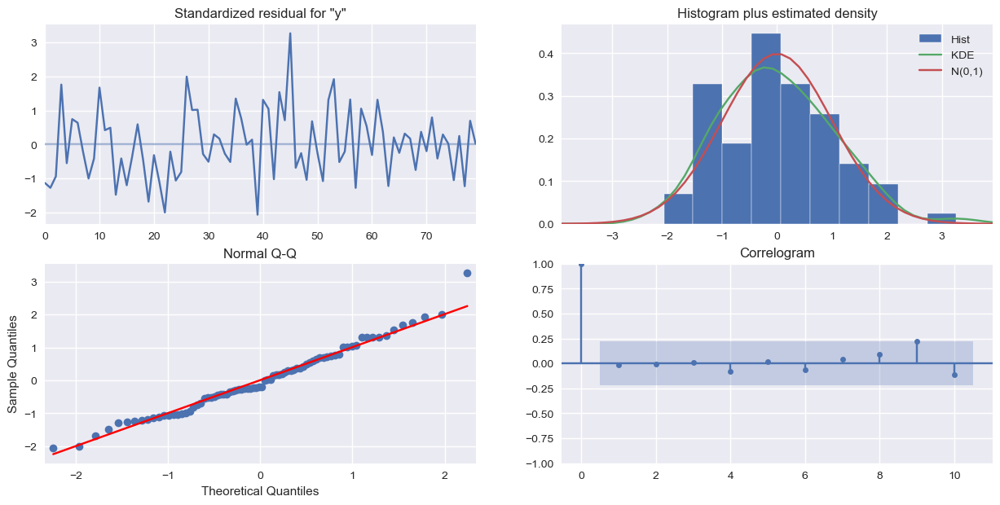

In [283]:
results_auto_SARIMA_rose.plot_diagnostics()
plt.show();

In [284]:
pred_dynamic = results_auto_SARIMA_rose.get_prediction(dynamic=True, full_results=True)

In [285]:
pred_dynamic_ci = pred_dynamic.conf_int()
predicted_auto_SARIMA_rose = results_auto_SARIMA_rose.get_forecast(steps=len(SARIMA_test['Rose']), alpha=0.05)

In [286]:
predicted_auto_SARIMA_rose.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,45.225092,14.458669,16.886621,73.563562
1,63.056080,14.503512,34.629718,91.482441
2,68.117345,14.453543,39.788921,96.445770
3,61.827079,14.449786,33.506018,90.148140
4,68.436749,14.470290,40.075502,96.797997


In [287]:
rose_forecasted = pred_dynamic.predicted_mean
SARIMA_test['rose_auto_forecasted'] = predicted_auto_SARIMA_rose.predicted_mean
SARIMA_test.head()

,Sparkling,Rose,spark_forecasted,rose_auto_forecasted
YearMonth,,,,
1991-01-31,1902,54.0,1430.334371,45.225092
1991-02-28,2049,55.0,1540.190467,63.056080
1991-03-31,1874,66.0,1707.264337,68.117345
1991-04-30,1279,65.0,1858.730495,61.827079
1991-05-31,1432,60.0,1501.443936,68.436749


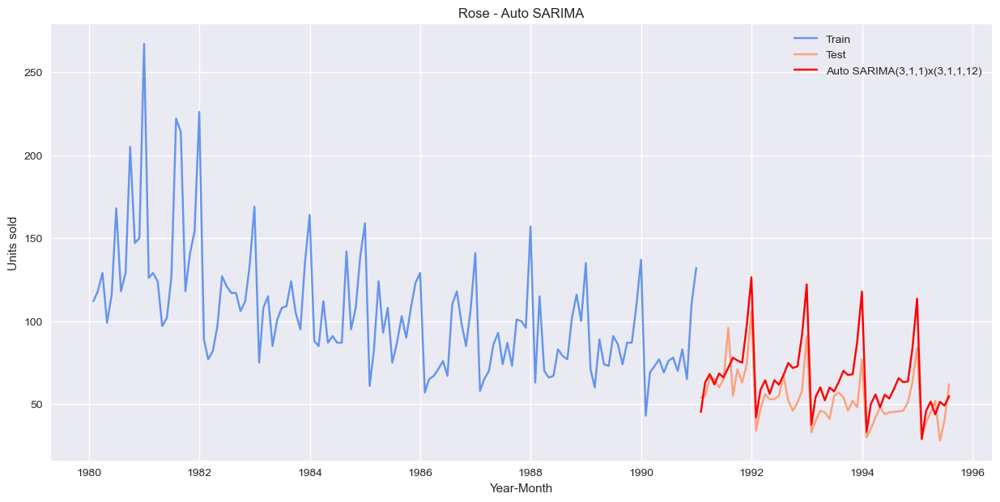

In [288]:
plt.plot(train['Rose'], label='Train', color = 'cornflowerblue')
plt.plot(test['Rose'], label='Test', color = 'lightsalmon')

plt.plot(SARIMA_test['rose_auto_forecasted'], color='red', label='Auto SARIMA(3,1,1)x(3,1,1,12)')
plt.xlabel('Year-Month')
plt.ylabel('Units sold')
plt.title('Rose - Auto SARIMA')
plt.legend(loc='best');

In [289]:
rmse_rose_model8_test = metrics.mean_squared_error(test['Rose'],SARIMA_test['rose_auto_forecasted'],squared=False)
mape_rose_model8_test = MAPE(test['Rose'],SARIMA_test['rose_auto_forecasted'])
print("For SARIMA forecast on the Rose Wine Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model8_test, mape_rose_model8_test))

For SARIMA forecast on the Rose Wine Testing Data:  RMSE is 16.824 and MAPE is 25.48


In [290]:
resultsDf_8_rose1 = pd.DataFrame({'Test RMSE': [rmse_rose_model8_test],'Test MAPE': [mape_rose_model8_test]},index=['Auto SARIMA(3,1,1)x(3,1,1,12)'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_8_rose1])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82
NaiveModel,79.718559,145.10
SimpleAverage,53.460350,94.93
2 point TMA,11.529278,13.54
4 point TMA,14.451364,19.49
6 point TMA,14.566269,20.82
9 point TMA,14.727594,21.01
SES Alpha 0.01,36.796004,63.88
"DES Alpha 0.017, Beta 3.23",15.706968,24.12
"DES Alpha 0.10, Beta 0.10",37.056911,64.02


### Q7. Build ARIMA/SARIMA models based on the cut-off points of ACF and PACF on the training data and evaluate this model on the test data using RMSE.

### Seasonality was found in the dataset. Hence, we are proceeding with Manual SARIMA as the final model for the analysis.

#### 1) Sparkling (Manual SARIMA)

##### SARIMA model for which the best parameters are selected by looking at the ACF and the PACF plots.

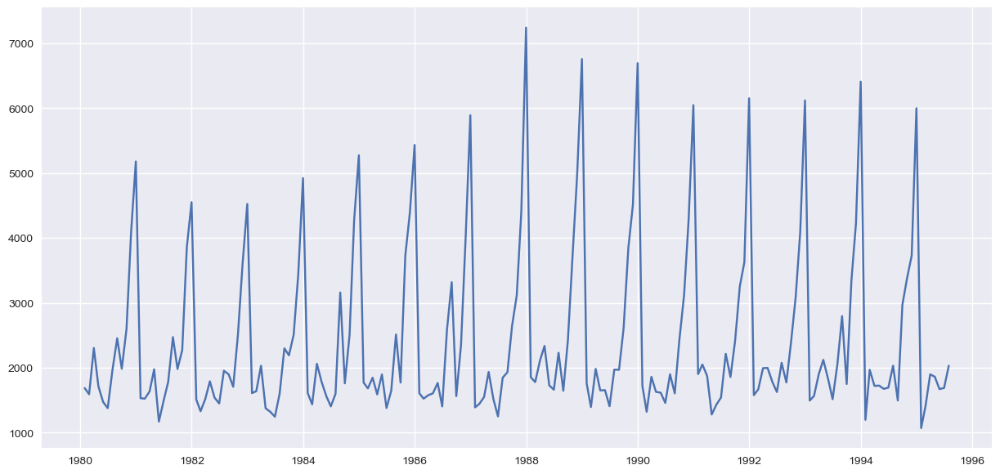

In [291]:
plt.figure(figsize=(15,7))
plt.plot(df['Sparkling']);

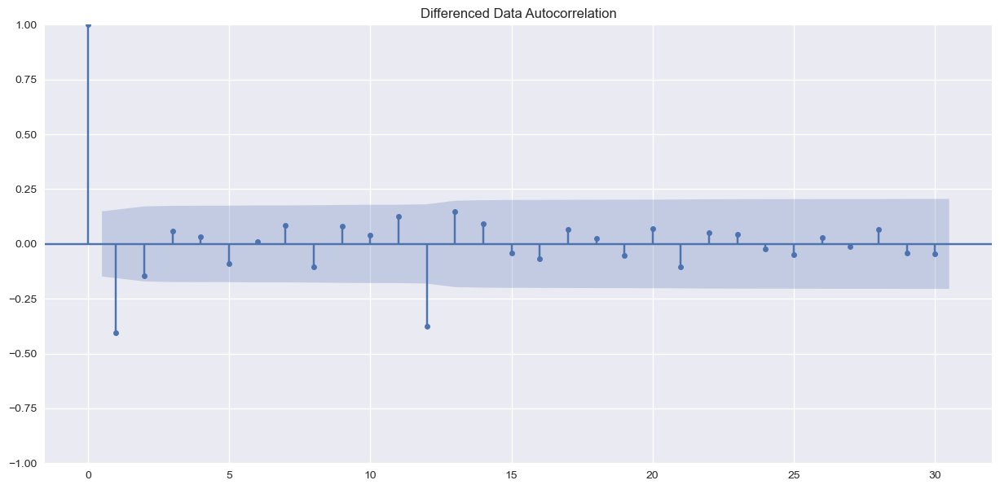

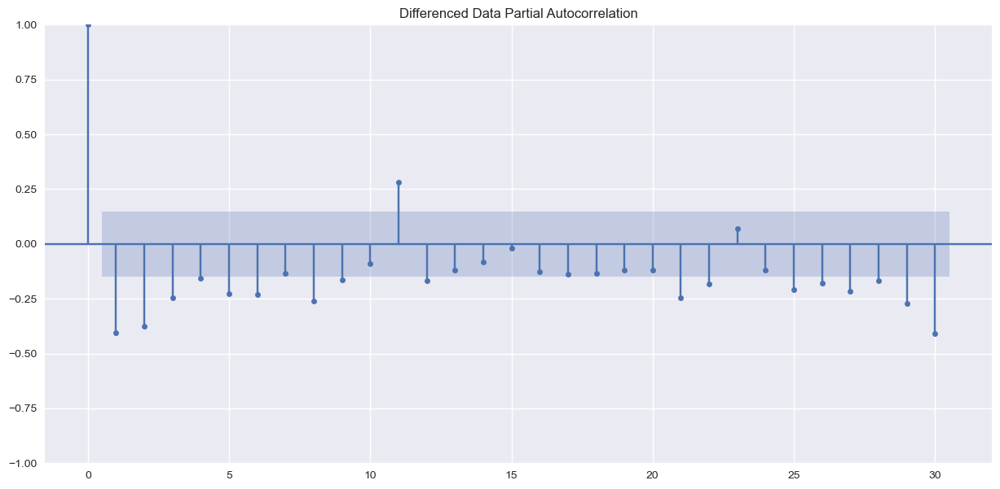

In [292]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plot_acf((df['Sparkling'].diff(12).dropna()).diff().dropna(),lags=30, title='Differenced Data Autocorrelation')
plot_pacf((df['Sparkling'].diff(12).dropna()).diff().dropna(),lags=30, title='Differenced Data Partial Autocorrelation');

In [293]:
import statsmodels.api as sm

manual_SARIMA_spark = sm.tsa.statespace.SARIMAX(train['Sparkling'].values,
                                order=(3, 1, 1),#(3, 1, 1),
                                seasonal_order= (1, 1, 2, 12),#(0, 1, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA_spark = manual_SARIMA_spark.fit(maxiter=1000)
print(results_manual_SARIMA_spark.summary())

                                        SARIMAX Results                                        
Dep. Variable:                                       y   No. Observations:                  132
Model:             SARIMAX(3, 1, 1)x(1, 1, [1, 2], 12)   Log Likelihood                -693.697
Date:                                 Sun, 05 Mar 2023   AIC                           1403.394
Time:                                         22:06:37   BIC                           1423.654
Sample:                                              0   HQIC                          1411.574
                                                 - 132                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2229      0.130      1.713      0.087      -0.032       0

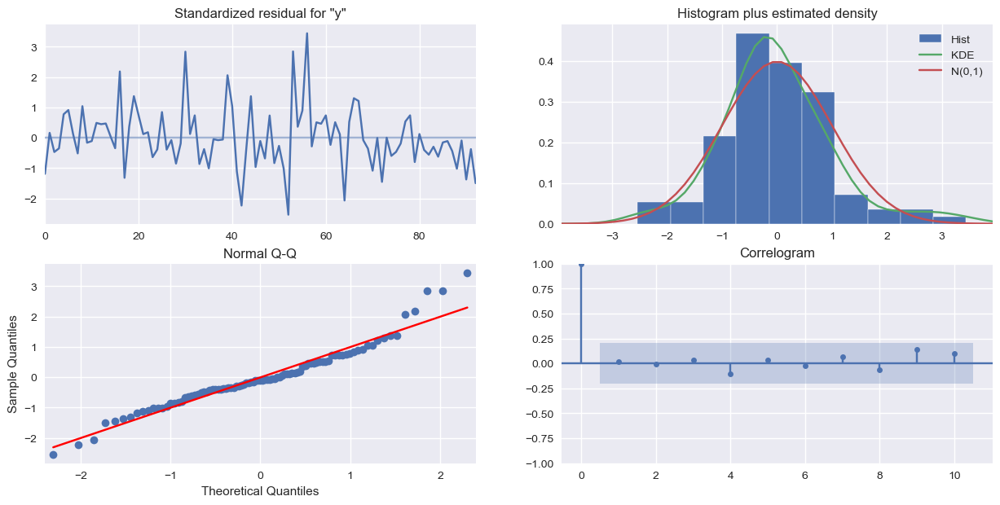

In [294]:
results_manual_SARIMA_spark.plot_diagnostics()
plt.show();

In [295]:
pred_dynamic = results_manual_SARIMA_spark.get_prediction(dynamic=True, full_results=True)

In [296]:
pred_dynamic_ci = pred_dynamic.conf_int()
predicted_manual_SARIMA_spark = results_manual_SARIMA_spark.get_forecast(steps=len(SARIMA_test['Sparkling']), alpha=0.5)

In [297]:
predicted_manual_SARIMA_spark.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,1579.905527,416.593917,763.396454,2396.414600
1,1419.146615,429.113122,578.100351,2260.192878
2,1868.135387,429.103765,1027.107463,2709.163312
3,1731.464728,430.972636,886.773883,2576.155573
4,1659.814781,431.905708,813.295148,2506.334414


In [298]:
spark_manual_forecasted = pred_dynamic.predicted_mean
SARIMA_test['spark_manual_forecasted'] = predicted_manual_SARIMA_spark.predicted_mean
SARIMA_test.head()

,Sparkling,Rose,spark_forecasted,rose_auto_forecasted,spark_manual_forecasted
YearMonth,,,,,
1991-01-31,1902,54.0,1430.334371,45.225092,1579.905527
1991-02-28,2049,55.0,1540.190467,63.056080,1419.146615
1991-03-31,1874,66.0,1707.264337,68.117345,1868.135387
1991-04-30,1279,65.0,1858.730495,61.827079,1731.464728
1991-05-31,1432,60.0,1501.443936,68.436749,1659.814781


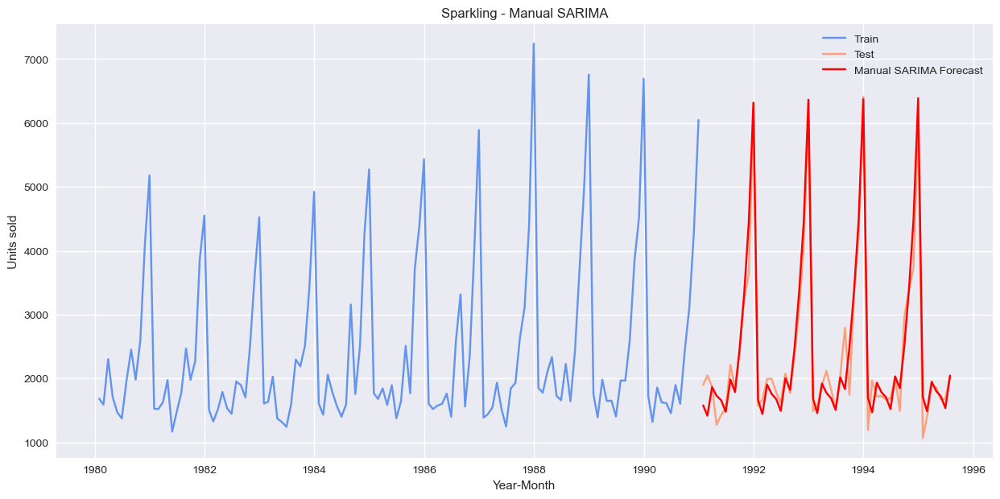

In [299]:
plt.plot(train['Sparkling'], label='Train', color = 'cornflowerblue')
plt.plot(test['Sparkling'], label='Test', color = 'lightsalmon')

plt.plot(SARIMA_test['spark_manual_forecasted'], color='red', label='Manual SARIMA Forecast')
plt.ylabel('Units sold')
plt.xlabel('Year-Month')
plt.title('Sparkling - Manual SARIMA')
plt.legend(loc='best');

In [300]:
rmse_spark_model8_test = metrics.mean_squared_error(test['Sparkling'],SARIMA_test['spark_manual_forecasted'],squared=False)
mape_spark_model8_test = MAPE(test['Sparkling'],SARIMA_test['spark_manual_forecasted'])
print("For SARIMA forecast on the Sparkling Wine Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_spark_model8_test, mape_spark_model8_test))

For SARIMA forecast on the Sparkling Wine Testing Data:  RMSE is 324.104 and MAPE is 9.48


In [301]:
resultsDf_8_spark3 = pd.DataFrame({'Test RMSE': [rmse_spark_model8_test],'Test MAPE': [mape_spark_model8_test]},index=['Manual SARIMA(3,1,1)x(1,1,2,12)'])

spark_resultsDf = pd.concat([spark_resultsDf, resultsDf_8_spark3])
spark_resultsDf

,Test RMSE,Test MAPE
Regression On Time,1389.135175,50.15
NaiveModel,3864.279352,152.87
SimpleAverage,1275.081804,38.90
2 point TMA,813.400684,19.70
4 point TMA,1156.589694,35.96
6 point TMA,1283.927428,43.86
9 point TMA,1346.278315,46.86
SES Alpha 0.00,1316.035487,45.47
"DES Alpha 0.1,Beta 0.1",1779.420000,67.23
"DES Alpha 0.6,Beta 0.0",2007.238526,68.23


#### 2) Rose (Manual SARIMA)

##### SARIMA model for which the best parameters are selected by looking at the ACF and the PACF plots.

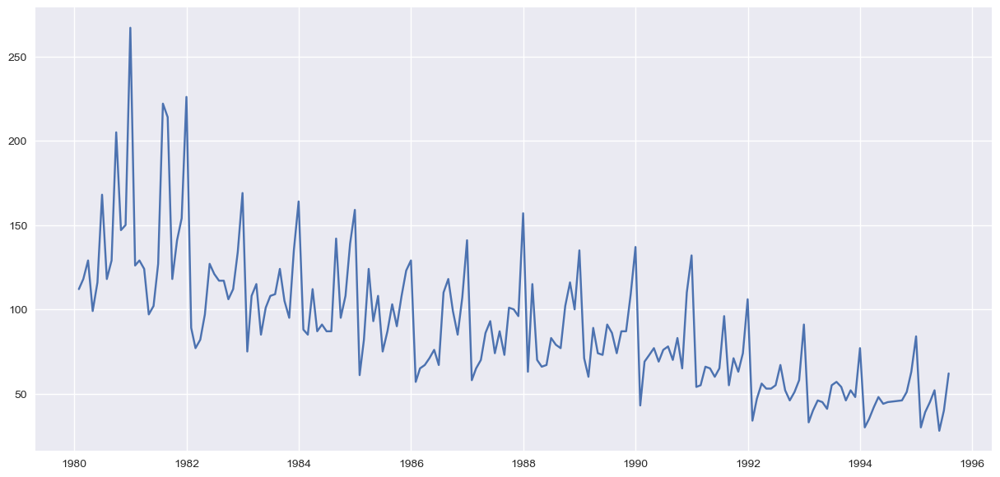

In [302]:
plt.figure(figsize=(15,7))
plt.plot(df['Rose']);

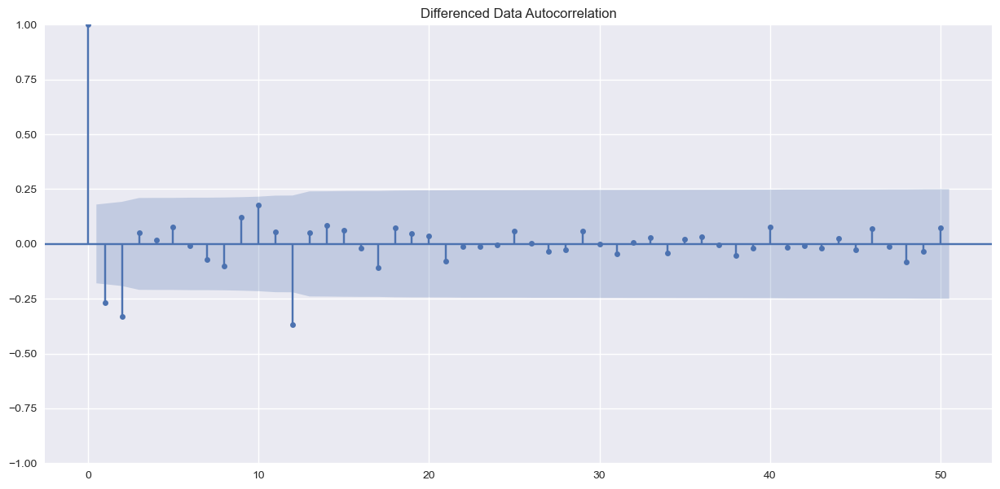

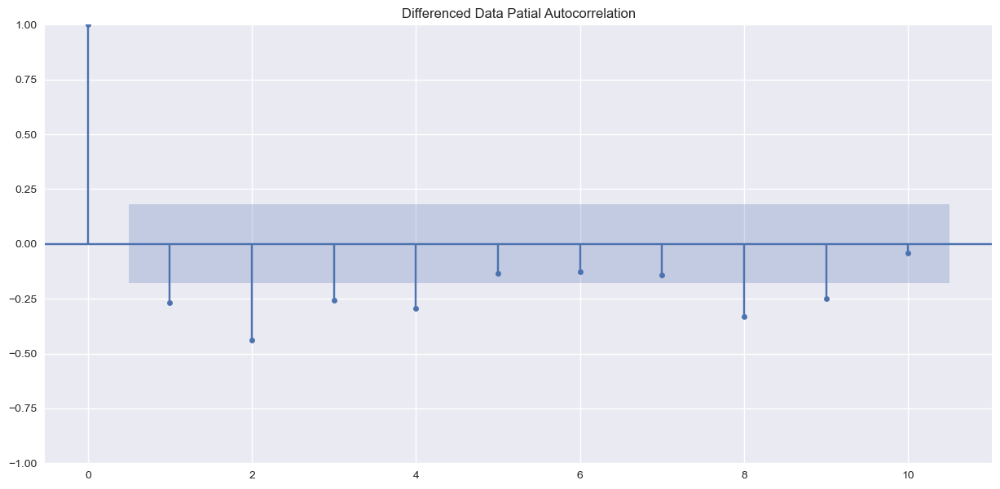

In [303]:
plot_acf((SARIMA_train['Rose'].diff(12).dropna()).diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plot_pacf((SARIMA_train['Rose'].diff(12).dropna()).diff().dropna(),lags=10,title='Differenced Data Patial Autocorrelation')
plt.show();

In [304]:
manual_SARIMA_rose = sm.tsa.statespace.SARIMAX(train['Rose'].values,
                                order=(4, 1, 2),
                                seasonal_order=(0, 1, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA_rose = manual_SARIMA_rose.fit(maxiter=1000)
print(results_manual_SARIMA_rose.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                  132
Model:             SARIMAX(4, 1, 2)x(0, 1, 2, 12)   Log Likelihood                -384.369
Date:                            Sun, 05 Mar 2023   AIC                            786.737
Time:                                    22:06:43   BIC                            809.433
Sample:                                         0   HQIC                           795.898
                                            - 132                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8967      0.132     -6.814      0.000      -1.155      -0.639
ar.L2          0.0165      0.171   

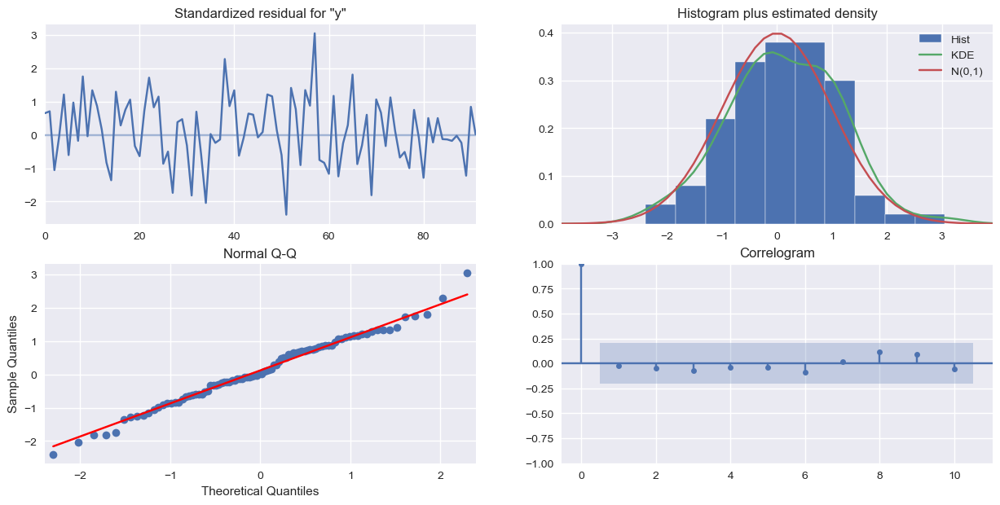

In [305]:
results_manual_SARIMA_rose.plot_diagnostics()
plt.show();

In [306]:
pred_dynamic = results_manual_SARIMA_rose.get_prediction(dynamic=True, full_results=True)

In [307]:
pred_dynamic_ci = pred_dynamic.conf_int()
predicted_manual_SARIMA_rose = results_manual_SARIMA_rose.get_forecast(steps=len(test['Rose']), alpha=0.05)

In [308]:
predicted_manual_SARIMA_rose.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,44.733041,15.552666,14.250376,75.215705
1,64.208694,16.000767,32.847767,95.569620
2,65.110689,16.074606,33.605042,96.616337
3,68.453063,16.150995,36.797694,100.108432
4,61.423433,16.154555,29.761087,93.085780


In [309]:
rose_manual_forecasted = pred_dynamic.predicted_mean
SARIMA_test['rose_manual_forecasted'] = predicted_manual_SARIMA_rose.predicted_mean
SARIMA_test.head()

,Sparkling,Rose,spark_forecasted,rose_auto_forecasted,spark_manual_forecasted,rose_manual_forecasted
YearMonth,,,,,,
1991-01-31,1902,54.0,1430.334371,45.225092,1579.905527,44.733041
1991-02-28,2049,55.0,1540.190467,63.056080,1419.146615,64.208694
1991-03-31,1874,66.0,1707.264337,68.117345,1868.135387,65.110689
1991-04-30,1279,65.0,1858.730495,61.827079,1731.464728,68.453063
1991-05-31,1432,60.0,1501.443936,68.436749,1659.814781,61.423433


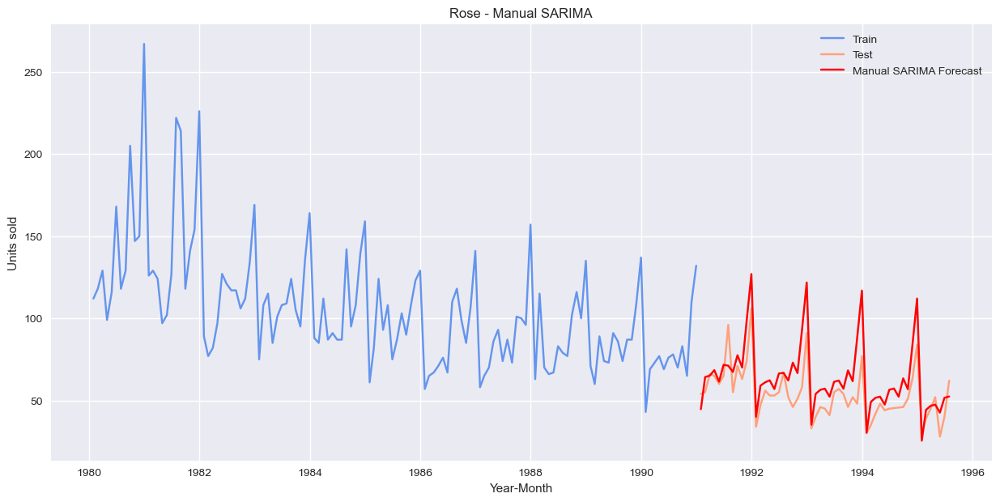

In [310]:
plt.plot(train['Rose'], label='Train', color = 'cornflowerblue')
plt.plot(test['Rose'], label='Test', color = 'lightsalmon')

plt.plot(SARIMA_test['rose_manual_forecasted'], color='red', label='Manual SARIMA Forecast')
plt.ylabel('Units sold')
plt.xlabel('Year-Month')
plt.title('Rose - Manual SARIMA')
plt.legend(loc='best');

In [311]:
rmse_rose_model8_test = metrics.mean_squared_error(test['Rose'],SARIMA_test['rose_manual_forecasted'],squared=False)
mape_rose_model8_test = MAPE(test['Rose'],SARIMA_test['rose_manual_forecasted'])
print("For SARIMA forecast on the Rose Wine Testing Data:  RMSE is %3.3f and MAPE is %3.2f" %(rmse_rose_model8_test, mape_rose_model8_test))

For SARIMA forecast on the Rose Wine Testing Data:  RMSE is 15.377 and MAPE is 22.16


In [312]:
resultsDf_8_rose2 = pd.DataFrame({'Test RMSE': [rmse_rose_model8_test],'Test MAPE': [mape_rose_model8_test]},index=['Manual SARIMA(4,1,2)x(0,1,1,12)'])

rose_resultsDf = pd.concat([rose_resultsDf, resultsDf_8_rose2])
rose_resultsDf

,Test RMSE,Test MAPE
Regression On Time,15.268885,22.82
NaiveModel,79.718559,145.10
SimpleAverage,53.460350,94.93
2 point TMA,11.529278,13.54
4 point TMA,14.451364,19.49
6 point TMA,14.566269,20.82
9 point TMA,14.727594,21.01
SES Alpha 0.01,36.796004,63.88
"DES Alpha 0.017, Beta 3.23",15.706968,24.12
"DES Alpha 0.10, Beta 0.10",37.056911,64.02


## Q8. Build a table (create a data frame) with all the models built along with their corresponding parameters and the respective RMSE values on the test data.

In [313]:
rose_results_df_ = pd.concat([rose_resultsDf,rose_arima_resultsDf],axis=0)

In [314]:
rose_results_df_.sort_values(by='Test RMSE')

,Test RMSE,Test MAPE
"TES Alpha 0.1, Beta 0.2, Gamma 0.1",9.493835,13.68
2 point TMA,11.529278,13.54
4 point TMA,14.451364,19.49
6 point TMA,14.566269,20.82
9 point TMA,14.727594,21.01
Regression On Time,15.268885,22.82
"Manual SARIMA(4,1,2)x(0,1,1,12)",15.377144,22.16
"DES Alpha 0.017, Beta 3.23",15.706968,24.12
"Auto SARIMA(3,1,1)x(3,1,1,12)",16.823598,25.48
"TES Alpha 0.07, Beta 0.04, Gamma 0.0008",20.156483,33.63


In [315]:
spark_results_df_ = pd.concat([spark_resultsDf,spark_arima_resultsDf],axis=0)

In [317]:
spark_results_df_.sort_values(by='Test RMSE')

,Test RMSE,Test MAPE
"TES Alpha 0.4, Beta 0.1, Gamma 0.2",315.935531,10.45
"Manual SARIMA(3,1,1)x(1,1,2,12)",324.104370,9.48
"Auto SARIMA(3,1,3)x(3,1,0,12)",331.716809,10.34
"TES Alpha 0.11, Beta 0.04, Gamma 0.036",404.286809,13.93
2 point TMA,813.400684,19.70
4 point TMA,1156.589694,35.96
SimpleAverage,1275.081804,38.90
6 point TMA,1283.927428,43.86
Sparkling Auto Arima,1299.979665,43.20
SES Alpha 0.00,1316.035487,45.47


## Q9. Based on the model-building exercise, build the most optimum model(s) on the complete data and predict 12 months into the future with appropriate confidence intervals/bands.

#### Sparkling Wine

In [318]:
# Initializing the Double Exponential Smoothing Model
model_TES = ExponentialSmoothing(df['Sparkling'],trend='add',seasonal='additive',initialization_method='estimated')
# Fitting the model
model_TES = model_TES.fit()

print('')
print('==Holt Winters model Exponential Smoothing Estimated Parameters ==')
print('')
print(model_TES.params)


==Holt Winters model Exponential Smoothing Estimated Parameters ==

{'smoothing_level': 0.07596713146311772, 'smoothing_trend': 0.03256921715086211, 'smoothing_seasonal': 0.37660762886165167, 'damping_trend': nan, 'initial_level': 2356.500087258337, 'initial_trend': -0.8449338106956193, 'initial_seasons': array([-636.25474139, -723.00153617, -398.66964817, -473.45571811,
       -808.43306854, -815.37001157, -384.24814771,   73.00119661,
       -237.46281546,  272.34574748, 1541.39349329, 2590.11477306]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


In [319]:
# Forecasting using this model for the duration of the test set
TES_predict =  model_TES.forecast(steps=12)
TES_predict
prediction_1 = TES_predict

In [320]:
plt.rcParams["figure.figsize"] = [16,9]

In [321]:
pred_1_df = pd.DataFrame({'lower_CI':prediction_1 - 1.96*np.std(model_TES.resid,ddof=1),
                          'prediction':prediction_1,
                          'upper_ci': prediction_1 + 1.96*np.std(model_TES.resid,ddof=1)})
pred_1_df.head()

,lower_CI,prediction,upper_ci
1995-08-31,1159.508682,1877.431801,2595.354921
1995-09-30,1687.362628,2405.285747,3123.208866
1995-10-31,2524.182579,3242.105698,3960.028817
1995-11-30,3204.266404,3922.189524,4640.112643
1995-12-31,5400.579284,6118.502404,6836.425523


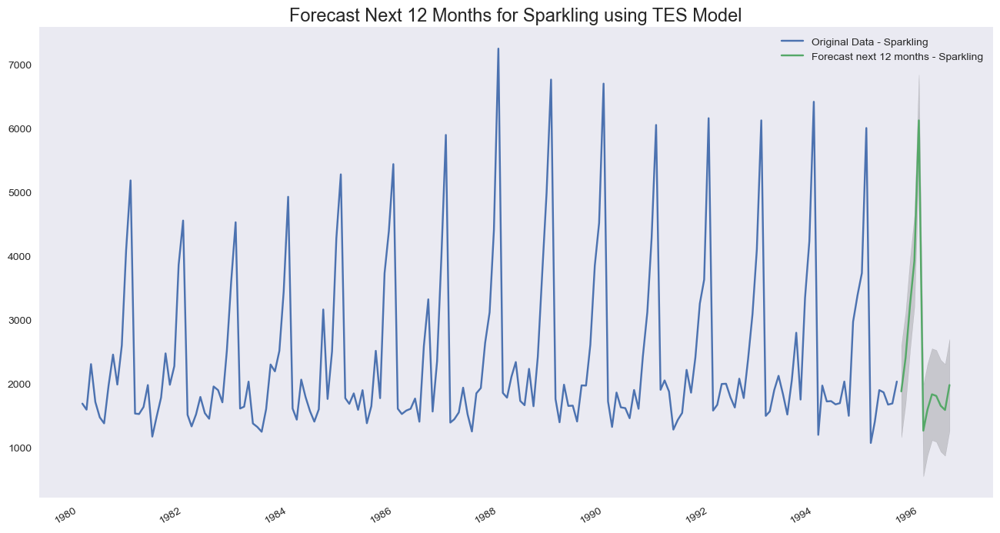

In [323]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(df['Sparkling'], label='Original Data - Sparkling')

ax =TES_predict.plot(label='Forecast next 12 months - Sparkling')
ax.fill_between(pred_1_df.index,pred_1_df['lower_CI'], pred_1_df['upper_ci'], color='k', alpha=.15)

plt.legend(loc='best')
plt.grid()
plt.title('Forecast Next 12 Months for Sparkling using TES Model', fontsize=17);

#### Rose Wine

In [324]:
# Initializing the Double Exponential Smoothing Model
model_TES = ExponentialSmoothing(df['Rose'],trend='add',seasonal='additive',initialization_method='estimated')
# Fitting the model
model_TES = model_TES.fit()

print('')
print('==Holt Winters model Exponential Smoothing Estimated Parameters ==')
print('')
print(model_TES.params)


==Holt Winters model Exponential Smoothing Estimated Parameters ==

{'smoothing_level': 0.10048282724205451, 'smoothing_trend': 4.342804219348294e-06, 'smoothing_seasonal': 0.00034450039918648966, 'damping_trend': nan, 'initial_level': 144.93826495331575, 'initial_trend': -0.5353122052798194, 'initial_seasons': array([-28.09893561, -17.38935387,  -9.31965558, -15.93316798,
       -11.88231382,  -5.82404148,   5.38542329,   5.25599055,
         2.56711906,   1.78676286,  16.89504853,  55.65866748]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


In [325]:
# Forecasting using this model for the duration of the test set
TES_predict =  model_TES.forecast(steps=12)
TES_predict
prediction_1 = TES_predict

In [326]:
plt.rcParams["figure.figsize"] = [16,9]

In [327]:
pred_1_df = pd.DataFrame({'lower_CI':prediction_1 - 1.96*np.std(model_TES.resid,ddof=1),
                          'prediction':prediction_1,
                          'upper_ci': prediction_1 + 1.96*np.std(model_TES.resid,ddof=1)})
pred_1_df.head()

,lower_CI,prediction,upper_ci
1995-08-31,15.517079,50.230059,84.943039
1995-09-30,12.293212,47.006192,81.719172
1995-10-31,10.977815,45.690795,80.403775
1995-11-30,25.550863,60.263843,94.976823
1995-12-31,63.779219,98.492199,133.205179


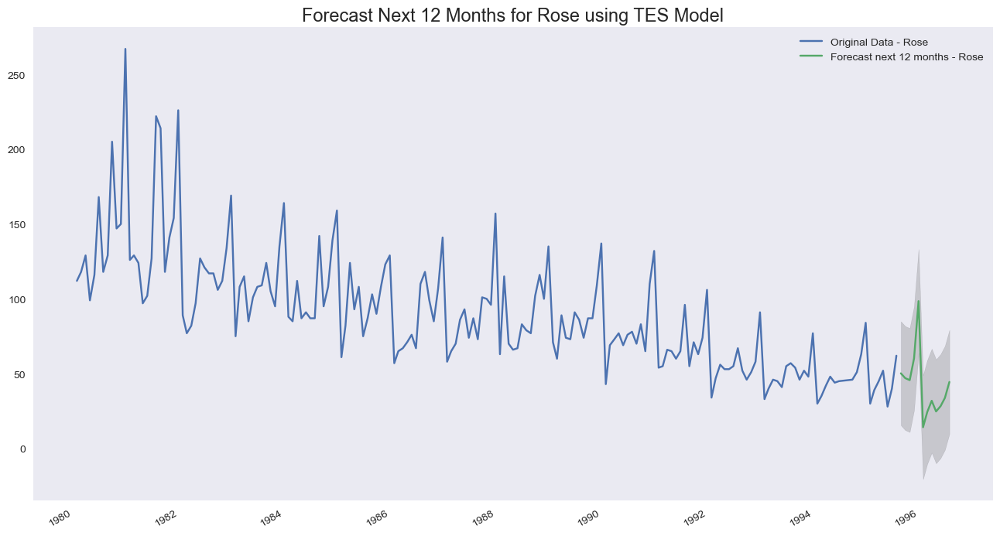

In [328]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(df['Rose'], label='Original Data - Rose')

ax =TES_predict.plot(label='Forecast next 12 months - Rose')
ax.fill_between(pred_1_df.index,pred_1_df['lower_CI'], pred_1_df['upper_ci'], color='k', alpha=.15)

plt.legend(loc='best')
plt.grid()
plt.title('Forecast Next 12 Months for Rose using TES Model', fontsize=17);